# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

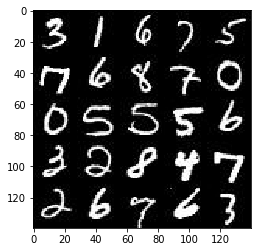

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

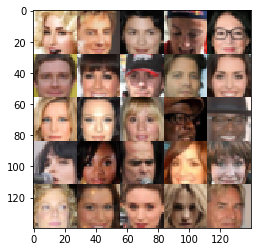

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [20]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # 1st convolutional layer.
        x1 = tf.layers.conv2d(images, filters=64, kernel_size=5, strides=(2,2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        # Batch normalization. DON'T USE HERE, CREATES ARTEFACTS
         # Leaky ReLU.
        relu1 = tf.maximum(alpha * x1, x1)
        
        # 2nd convolutional layer.
        x2 = tf.layers.conv2d(relu1, filters=128, kernel_size=5, strides=(2,2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        # Batch normalization.
        b2 = tf.layers.batch_normalization(x2, training=True)
         # Leaky ReLU.
        relu2 = tf.maximum(alpha * b2, b2)
        
        # 3rd convolutional layer.
        x3 = tf.layers.conv2d(relu2, filters=256, kernel_size=5, strides=(2,2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        # Batch normalization.
        b3 = tf.layers.batch_normalization(x3, training=True)
         # Leaky ReLU.
        relu3 = tf.maximum(alpha * b3, b3)
        
        # Turn last layer into vector.
        x4 = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(x4, 1, kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [21]:
def generator(z, out_channel_dim, training=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not training):
        # First fully connected layer
        # TF does not have leaky ReLU built in, so we use no
        # activation fuction but create it afterwards
        h1 = tf.layers.dense(z, 4*4*512, activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        # Reshape into 3d array to start the convolutional part of the network.
        h1 = tf.reshape(h1, (-1, 4, 4, 512))
        # Batch normalization.
        h1 = tf.layers.batch_normalization(h1, training=training)
        # Leaky ReLU activation function.
        h1 = tf.maximum(alpha * h1, h1)
        # h1 now has a dimension of 4x4x512
        
        # 2nd convolutional layer 7x7x256
        h2 = tf.layers.conv2d_transpose(h1, filters=256, kernel_size=4, strides=(1,1), padding='valid', kernel_initializer=tf.contrib.layers.xavier_initializer())
        # Batch normalization.
        h2 = tf.layers.batch_normalization(h2, training=training)
         # Leaky ReLU.
        h2 = tf.maximum(alpha * h2, h2)
         
        # 3rd convolutional layer 14x14x128
        h3 = tf.layers.conv2d_transpose(h2, filters=128, kernel_size=5, strides=(2,2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        # Batch normalization.
        h3 = tf.layers.batch_normalization(h3, training=training)
         # Leaky ReLU.
        h3 = tf.maximum(alpha * h3, h3)
        
        # Output layer, 28x28x3
        logits = tf.layers.conv2d_transpose(inputs=h3, filters=out_channel_dim, kernel_size=5, strides=(2,2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [24]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)
    
    smooth = 0.1
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels = tf.ones_like((d_model_real) * (1 - smooth))))#labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [25]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [26]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np
import matplotlib
def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode, losses):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    
    matplotlib.rcParams['figure.figsize'] = [10,6]
    pyplot.subplot(1, 2, 1)
    pyplot.plot(range(len(losses)), [i[1] for i in losses], '-g', label='Gen loss')
    pyplot.plot(range(len(losses)), [i[0] for i in losses], '-r', label='Dis loss')
    pyplot.xlabel("Step")
    pyplot.ylabel("Loss")
    pyplot.legend()
    pyplot.grid()
    pyplot.gca().set_xlim((0,len(losses)))
    pyplot.gca().set_ylim((0,10))
    pyplot.gca().set_aspect(len(losses)/10.)
    pyplot.subplot(1, 2, 2)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [27]:
import time
from matplotlib import pyplot as plt
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # Build model.
    # Create inputs.
    input_real, input_z, learning_rate_placeholder = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    # Create losses.
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha=0.2)
    # Create optimizers.
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate_placeholder, beta1)

    print_every = 10
    show_every = 100
        
    losses = []
    steps = 0
        
    time_start = time.time()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                # Rescale batch images to range from -1 to 1
                batch_images = batch_images * 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_placeholder:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, learning_rate_placeholder:learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    time_elapsed = time.time() - time_start
                    progress = steps / (epoch_count * (data_shape[0]/batch_size))
                    time_to_finish = time_elapsed / progress - time_elapsed
                    print("Epc: {}/{}    ".format(epoch_i+1, epochs) +
                          "Bat: {:04g}/{}    ".format(steps - epoch_i*int(data_shape[0]/batch_size), int(data_shape[0]/batch_size)) +
                          "Dis Loss: {:.4f}    ".format(train_loss_d) +
                          "Gen Loss: {:.4f}    ".format(train_loss_g) +
                          "Time elaps: {}    ".format(time.strftime("%H:%M:%S", time.gmtime(time_elapsed))) +
                          "Time remain: {}.".format(time.strftime("%H:%M:%S", time.gmtime(time_to_finish))))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode, losses)
                    '''
                    plt.plot(range(len(losses)), [i[0] for i in losses], '-r', label='Dis loss')
                    plt.plot(range(len(losses)), [i[1] for i in losses], '-g', label='Gen loss')
                    plt.xlabel("Step")
                    plt.ylabel("Loss")
                    plt.legend()
                    plt.show()
                    '''

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epc: 1/2    Bat: 0010/1200    Dis Loss: 1.3803    Gen Loss: 15.6087    Time elaps: 00:00:01    Time remain: 00:07:41.
Epc: 1/2    Bat: 0020/1200    Dis Loss: 0.0921    Gen Loss: 16.8544    Time elaps: 00:00:03    Time remain: 00:06:45.
Epc: 1/2    Bat: 0030/1200    Dis Loss: 0.1494    Gen Loss: 3.6232    Time elaps: 00:00:04    Time remain: 00:06:26.
Epc: 1/2    Bat: 0040/1200    Dis Loss: 1.2054    Gen Loss: 0.8663    Time elaps: 00:00:06    Time remain: 00:06:16.
Epc: 1/2    Bat: 0050/1200    Dis Loss: 0.3780    Gen Loss: 3.3904    Time elaps: 00:00:07    Time remain: 00:06:10.
Epc: 1/2    Bat: 0060/1200    Dis Loss: 0.9392    Gen Loss: 5.5800    Time elaps: 00:00:09    Time remain: 00:06:05.
Epc: 1/2    Bat: 0070/1200    Dis Loss: 0.8240    Gen Loss: 1.2972    Time elaps: 00:00:10    Time remain: 00:06:01.
Epc: 1/2    Bat: 0080/1200    Dis Loss: 0.7434    Gen Loss: 1.1407    Time elaps: 00:00:12    Time remain: 00:05:57.
Epc: 1/2    Bat: 0090/1200    Dis Loss: 0.4804    Gen Loss: 3.

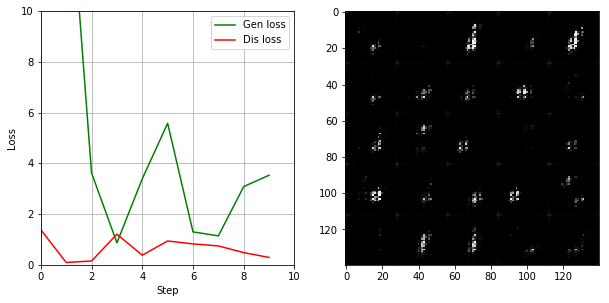

Epc: 1/2    Bat: 0110/1200    Dis Loss: 3.2211    Gen Loss: 0.0988    Time elaps: 00:00:17    Time remain: 00:05:56.
Epc: 1/2    Bat: 0120/1200    Dis Loss: 1.7288    Gen Loss: 0.4792    Time elaps: 00:00:18    Time remain: 00:05:53.
Epc: 1/2    Bat: 0130/1200    Dis Loss: 0.8124    Gen Loss: 1.0478    Time elaps: 00:00:20    Time remain: 00:05:51.
Epc: 1/2    Bat: 0140/1200    Dis Loss: 0.7756    Gen Loss: 1.0994    Time elaps: 00:00:21    Time remain: 00:05:48.
Epc: 1/2    Bat: 0150/1200    Dis Loss: 1.7023    Gen Loss: 3.2023    Time elaps: 00:00:23    Time remain: 00:05:46.
Epc: 1/2    Bat: 0160/1200    Dis Loss: 1.1001    Gen Loss: 0.9400    Time elaps: 00:00:24    Time remain: 00:05:43.
Epc: 1/2    Bat: 0170/1200    Dis Loss: 0.6843    Gen Loss: 2.4020    Time elaps: 00:00:26    Time remain: 00:05:41.
Epc: 1/2    Bat: 0180/1200    Dis Loss: 0.7727    Gen Loss: 1.5815    Time elaps: 00:00:27    Time remain: 00:05:39.
Epc: 1/2    Bat: 0190/1200    Dis Loss: 0.7709    Gen Loss: 1.45

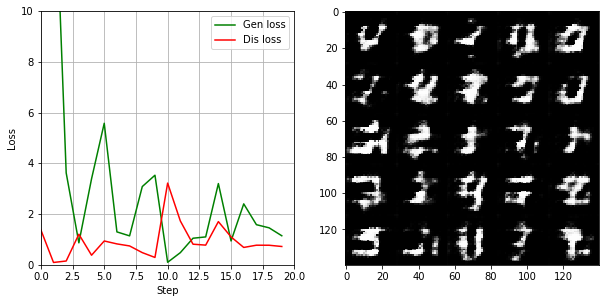

Epc: 1/2    Bat: 0210/1200    Dis Loss: 1.3769    Gen Loss: 0.5371    Time elaps: 00:00:32    Time remain: 00:05:37.
Epc: 1/2    Bat: 0220/1200    Dis Loss: 0.9298    Gen Loss: 1.1109    Time elaps: 00:00:33    Time remain: 00:05:35.
Epc: 1/2    Bat: 0230/1200    Dis Loss: 1.1909    Gen Loss: 0.5806    Time elaps: 00:00:35    Time remain: 00:05:33.
Epc: 1/2    Bat: 0240/1200    Dis Loss: 1.2984    Gen Loss: 0.6414    Time elaps: 00:00:36    Time remain: 00:05:31.
Epc: 1/2    Bat: 0250/1200    Dis Loss: 0.6997    Gen Loss: 1.7400    Time elaps: 00:00:38    Time remain: 00:05:29.
Epc: 1/2    Bat: 0260/1200    Dis Loss: 0.7748    Gen Loss: 1.5103    Time elaps: 00:00:39    Time remain: 00:05:27.
Epc: 1/2    Bat: 0270/1200    Dis Loss: 1.0903    Gen Loss: 1.1198    Time elaps: 00:00:41    Time remain: 00:05:25.
Epc: 1/2    Bat: 0280/1200    Dis Loss: 0.7907    Gen Loss: 1.7673    Time elaps: 00:00:42    Time remain: 00:05:23.
Epc: 1/2    Bat: 0290/1200    Dis Loss: 1.2899    Gen Loss: 0.58

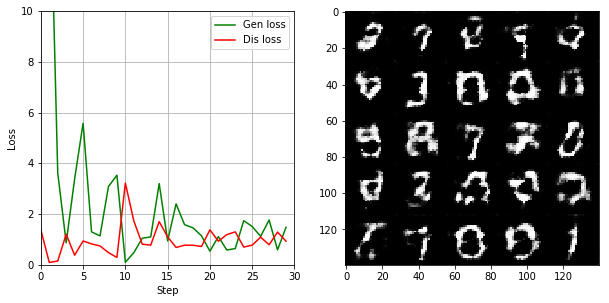

Epc: 1/2    Bat: 0310/1200    Dis Loss: 1.1012    Gen Loss: 0.9444    Time elaps: 00:00:47    Time remain: 00:05:20.
Epc: 1/2    Bat: 0320/1200    Dis Loss: 1.5997    Gen Loss: 2.4166    Time elaps: 00:00:48    Time remain: 00:05:18.
Epc: 1/2    Bat: 0330/1200    Dis Loss: 1.0090    Gen Loss: 0.8308    Time elaps: 00:00:50    Time remain: 00:05:16.
Epc: 1/2    Bat: 0340/1200    Dis Loss: 1.6913    Gen Loss: 0.3545    Time elaps: 00:00:51    Time remain: 00:05:14.
Epc: 1/2    Bat: 0350/1200    Dis Loss: 1.1453    Gen Loss: 1.5473    Time elaps: 00:00:53    Time remain: 00:05:12.
Epc: 1/2    Bat: 0360/1200    Dis Loss: 0.7182    Gen Loss: 1.4445    Time elaps: 00:00:54    Time remain: 00:05:11.
Epc: 1/2    Bat: 0370/1200    Dis Loss: 1.1259    Gen Loss: 0.7035    Time elaps: 00:00:56    Time remain: 00:05:09.
Epc: 1/2    Bat: 0380/1200    Dis Loss: 0.8969    Gen Loss: 1.3961    Time elaps: 00:00:57    Time remain: 00:05:07.
Epc: 1/2    Bat: 0390/1200    Dis Loss: 0.9621    Gen Loss: 1.75

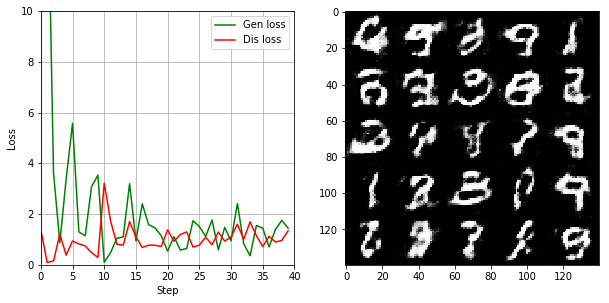

Epc: 1/2    Bat: 0410/1200    Dis Loss: 1.0069    Gen Loss: 0.8511    Time elaps: 00:01:02    Time remain: 00:05:04.
Epc: 1/2    Bat: 0420/1200    Dis Loss: 0.9579    Gen Loss: 0.8740    Time elaps: 00:01:04    Time remain: 00:05:02.
Epc: 1/2    Bat: 0430/1200    Dis Loss: 1.7757    Gen Loss: 0.3104    Time elaps: 00:01:05    Time remain: 00:05:00.
Epc: 1/2    Bat: 0440/1200    Dis Loss: 1.4670    Gen Loss: 0.4579    Time elaps: 00:01:07    Time remain: 00:04:59.
Epc: 1/2    Bat: 0450/1200    Dis Loss: 0.9011    Gen Loss: 1.5641    Time elaps: 00:01:08    Time remain: 00:04:57.
Epc: 1/2    Bat: 0460/1200    Dis Loss: 1.3546    Gen Loss: 1.7307    Time elaps: 00:01:10    Time remain: 00:04:55.
Epc: 1/2    Bat: 0470/1200    Dis Loss: 1.3059    Gen Loss: 2.0295    Time elaps: 00:01:11    Time remain: 00:04:53.
Epc: 1/2    Bat: 0480/1200    Dis Loss: 1.0204    Gen Loss: 0.9073    Time elaps: 00:01:13    Time remain: 00:04:52.
Epc: 1/2    Bat: 0490/1200    Dis Loss: 1.2180    Gen Loss: 0.52

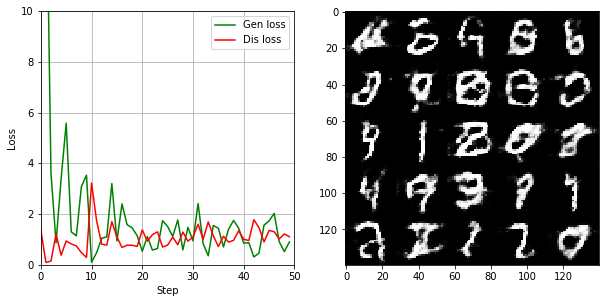

Epc: 1/2    Bat: 0510/1200    Dis Loss: 0.9068    Gen Loss: 1.3164    Time elaps: 00:01:17    Time remain: 00:04:48.
Epc: 1/2    Bat: 0520/1200    Dis Loss: 1.3871    Gen Loss: 0.4686    Time elaps: 00:01:19    Time remain: 00:04:46.
Epc: 1/2    Bat: 0530/1200    Dis Loss: 1.0580    Gen Loss: 0.6627    Time elaps: 00:01:20    Time remain: 00:04:45.
Epc: 1/2    Bat: 0540/1200    Dis Loss: 0.9612    Gen Loss: 1.0237    Time elaps: 00:01:22    Time remain: 00:04:43.
Epc: 1/2    Bat: 0550/1200    Dis Loss: 1.2233    Gen Loss: 1.8385    Time elaps: 00:01:23    Time remain: 00:04:41.
Epc: 1/2    Bat: 0560/1200    Dis Loss: 1.0076    Gen Loss: 0.9470    Time elaps: 00:01:25    Time remain: 00:04:40.
Epc: 1/2    Bat: 0570/1200    Dis Loss: 1.0595    Gen Loss: 0.8355    Time elaps: 00:01:26    Time remain: 00:04:38.
Epc: 1/2    Bat: 0580/1200    Dis Loss: 1.0752    Gen Loss: 1.0000    Time elaps: 00:01:28    Time remain: 00:04:36.
Epc: 1/2    Bat: 0590/1200    Dis Loss: 1.0151    Gen Loss: 1.18

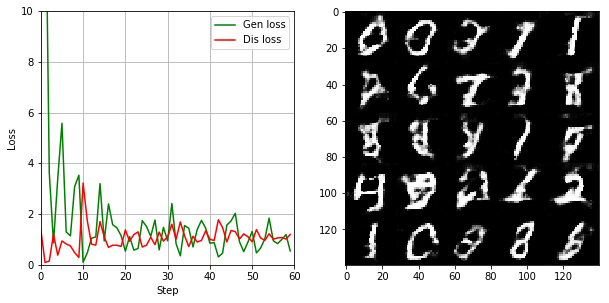

Epc: 1/2    Bat: 0610/1200    Dis Loss: 1.1841    Gen Loss: 0.7328    Time elaps: 00:01:33    Time remain: 00:04:33.
Epc: 1/2    Bat: 0620/1200    Dis Loss: 1.1045    Gen Loss: 0.6590    Time elaps: 00:01:34    Time remain: 00:04:31.
Epc: 1/2    Bat: 0630/1200    Dis Loss: 1.4282    Gen Loss: 0.4115    Time elaps: 00:01:36    Time remain: 00:04:29.
Epc: 1/2    Bat: 0640/1200    Dis Loss: 1.5644    Gen Loss: 1.7885    Time elaps: 00:01:37    Time remain: 00:04:28.
Epc: 1/2    Bat: 0650/1200    Dis Loss: 1.0385    Gen Loss: 1.2066    Time elaps: 00:01:39    Time remain: 00:04:26.
Epc: 1/2    Bat: 0660/1200    Dis Loss: 1.3861    Gen Loss: 0.4145    Time elaps: 00:01:40    Time remain: 00:04:24.
Epc: 1/2    Bat: 0670/1200    Dis Loss: 0.9561    Gen Loss: 1.0052    Time elaps: 00:01:41    Time remain: 00:04:23.
Epc: 1/2    Bat: 0680/1200    Dis Loss: 1.0579    Gen Loss: 0.6885    Time elaps: 00:01:43    Time remain: 00:04:21.
Epc: 1/2    Bat: 0690/1200    Dis Loss: 0.8568    Gen Loss: 1.26

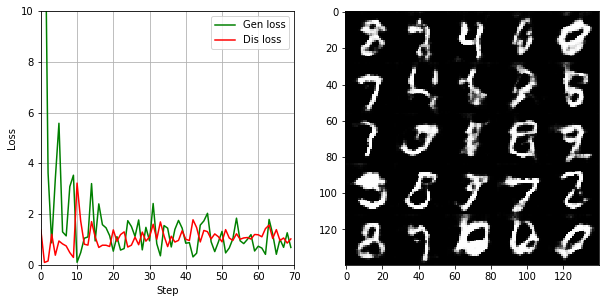

Epc: 1/2    Bat: 0710/1200    Dis Loss: 1.0448    Gen Loss: 0.7892    Time elaps: 00:01:48    Time remain: 00:04:17.
Epc: 1/2    Bat: 0720/1200    Dis Loss: 1.0871    Gen Loss: 1.1298    Time elaps: 00:01:49    Time remain: 00:04:16.
Epc: 1/2    Bat: 0730/1200    Dis Loss: 1.1108    Gen Loss: 0.7027    Time elaps: 00:01:51    Time remain: 00:04:14.
Epc: 1/2    Bat: 0740/1200    Dis Loss: 1.0750    Gen Loss: 0.5736    Time elaps: 00:01:52    Time remain: 00:04:12.
Epc: 1/2    Bat: 0750/1200    Dis Loss: 1.1300    Gen Loss: 1.4787    Time elaps: 00:01:54    Time remain: 00:04:11.
Epc: 1/2    Bat: 0760/1200    Dis Loss: 0.9171    Gen Loss: 1.2783    Time elaps: 00:01:55    Time remain: 00:04:09.
Epc: 1/2    Bat: 0770/1200    Dis Loss: 1.2474    Gen Loss: 1.5981    Time elaps: 00:01:57    Time remain: 00:04:08.
Epc: 1/2    Bat: 0780/1200    Dis Loss: 1.1812    Gen Loss: 0.5762    Time elaps: 00:01:58    Time remain: 00:04:06.
Epc: 1/2    Bat: 0790/1200    Dis Loss: 0.8654    Gen Loss: 1.31

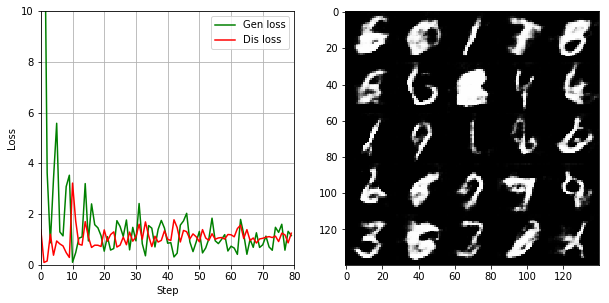

Epc: 1/2    Bat: 0810/1200    Dis Loss: 1.0123    Gen Loss: 1.1352    Time elaps: 00:02:03    Time remain: 00:04:02.
Epc: 1/2    Bat: 0820/1200    Dis Loss: 1.3812    Gen Loss: 0.4420    Time elaps: 00:02:04    Time remain: 00:04:00.
Epc: 1/2    Bat: 0830/1200    Dis Loss: 1.6102    Gen Loss: 0.2764    Time elaps: 00:02:06    Time remain: 00:03:59.
Epc: 1/2    Bat: 0840/1200    Dis Loss: 0.9812    Gen Loss: 0.7228    Time elaps: 00:02:07    Time remain: 00:03:57.
Epc: 1/2    Bat: 0850/1200    Dis Loss: 1.4186    Gen Loss: 0.5691    Time elaps: 00:02:09    Time remain: 00:03:55.
Epc: 1/2    Bat: 0860/1200    Dis Loss: 1.2501    Gen Loss: 0.5674    Time elaps: 00:02:10    Time remain: 00:03:54.
Epc: 1/2    Bat: 0870/1200    Dis Loss: 0.9499    Gen Loss: 1.0110    Time elaps: 00:02:12    Time remain: 00:03:52.
Epc: 1/2    Bat: 0880/1200    Dis Loss: 1.0801    Gen Loss: 0.6573    Time elaps: 00:02:13    Time remain: 00:03:51.
Epc: 1/2    Bat: 0890/1200    Dis Loss: 1.0220    Gen Loss: 0.72

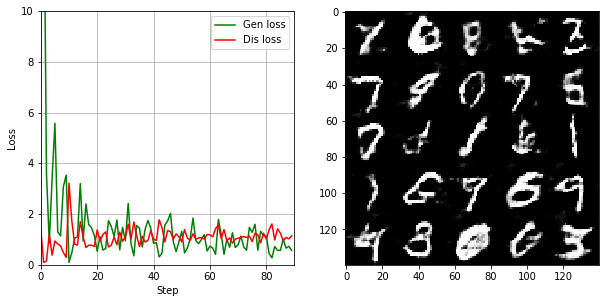

Epc: 1/2    Bat: 0910/1200    Dis Loss: 1.1611    Gen Loss: 0.5487    Time elaps: 00:02:18    Time remain: 00:03:46.
Epc: 1/2    Bat: 0920/1200    Dis Loss: 0.9817    Gen Loss: 1.0147    Time elaps: 00:02:20    Time remain: 00:03:45.
Epc: 1/2    Bat: 0930/1200    Dis Loss: 1.0317    Gen Loss: 0.7400    Time elaps: 00:02:21    Time remain: 00:03:43.
Epc: 1/2    Bat: 0940/1200    Dis Loss: 0.9518    Gen Loss: 1.6158    Time elaps: 00:02:23    Time remain: 00:03:42.
Epc: 1/2    Bat: 0950/1200    Dis Loss: 1.5487    Gen Loss: 0.3332    Time elaps: 00:02:24    Time remain: 00:03:40.
Epc: 1/2    Bat: 0960/1200    Dis Loss: 1.0107    Gen Loss: 0.8481    Time elaps: 00:02:26    Time remain: 00:03:39.
Epc: 1/2    Bat: 0970/1200    Dis Loss: 0.9225    Gen Loss: 0.8400    Time elaps: 00:02:27    Time remain: 00:03:37.
Epc: 1/2    Bat: 0980/1200    Dis Loss: 1.3322    Gen Loss: 1.6891    Time elaps: 00:02:28    Time remain: 00:03:35.
Epc: 1/2    Bat: 0990/1200    Dis Loss: 1.0515    Gen Loss: 1.11

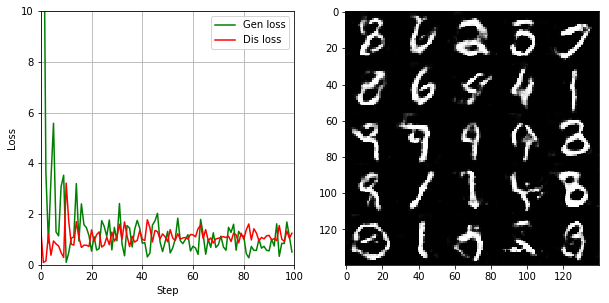

Epc: 1/2    Bat: 1010/1200    Dis Loss: 1.0084    Gen Loss: 1.2426    Time elaps: 00:02:33    Time remain: 00:03:31.
Epc: 1/2    Bat: 1020/1200    Dis Loss: 1.0733    Gen Loss: 0.8706    Time elaps: 00:02:35    Time remain: 00:03:30.
Epc: 1/2    Bat: 1030/1200    Dis Loss: 0.8516    Gen Loss: 1.1801    Time elaps: 00:02:36    Time remain: 00:03:28.
Epc: 1/2    Bat: 1040/1200    Dis Loss: 1.4088    Gen Loss: 0.4247    Time elaps: 00:02:38    Time remain: 00:03:26.
Epc: 1/2    Bat: 1050/1200    Dis Loss: 1.1739    Gen Loss: 0.7165    Time elaps: 00:02:39    Time remain: 00:03:25.
Epc: 1/2    Bat: 1060/1200    Dis Loss: 0.9522    Gen Loss: 0.7494    Time elaps: 00:02:41    Time remain: 00:03:23.
Epc: 1/2    Bat: 1070/1200    Dis Loss: 1.0975    Gen Loss: 0.6482    Time elaps: 00:02:42    Time remain: 00:03:22.
Epc: 1/2    Bat: 1080/1200    Dis Loss: 0.9627    Gen Loss: 1.1175    Time elaps: 00:02:44    Time remain: 00:03:20.
Epc: 1/2    Bat: 1090/1200    Dis Loss: 0.8945    Gen Loss: 0.86

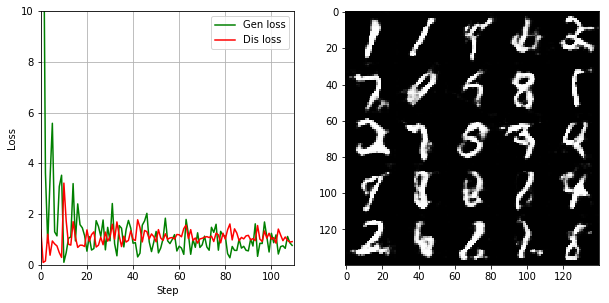

Epc: 1/2    Bat: 1110/1200    Dis Loss: 1.4102    Gen Loss: 0.4729    Time elaps: 00:02:48    Time remain: 00:03:16.
Epc: 1/2    Bat: 1120/1200    Dis Loss: 1.2513    Gen Loss: 0.5884    Time elaps: 00:02:50    Time remain: 00:03:14.
Epc: 1/2    Bat: 1130/1200    Dis Loss: 1.2561    Gen Loss: 0.5018    Time elaps: 00:02:51    Time remain: 00:03:13.
Epc: 1/2    Bat: 1140/1200    Dis Loss: 1.4483    Gen Loss: 0.3727    Time elaps: 00:02:53    Time remain: 00:03:11.
Epc: 1/2    Bat: 1150/1200    Dis Loss: 0.8460    Gen Loss: 1.0508    Time elaps: 00:02:54    Time remain: 00:03:10.
Epc: 1/2    Bat: 1160/1200    Dis Loss: 1.0815    Gen Loss: 0.5721    Time elaps: 00:02:56    Time remain: 00:03:08.
Epc: 1/2    Bat: 1170/1200    Dis Loss: 2.1589    Gen Loss: 0.1920    Time elaps: 00:02:57    Time remain: 00:03:06.
Epc: 1/2    Bat: 1180/1200    Dis Loss: 1.1442    Gen Loss: 0.6029    Time elaps: 00:02:59    Time remain: 00:03:05.
Epc: 1/2    Bat: 1190/1200    Dis Loss: 0.8362    Gen Loss: 1.09

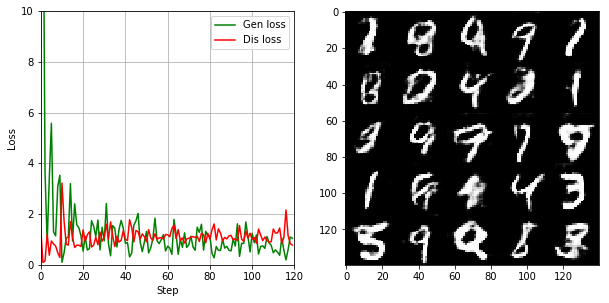

Epc: 2/2    Bat: 0010/1200    Dis Loss: 1.2339    Gen Loss: 0.4427    Time elaps: 00:03:04    Time remain: 00:03:01.
Epc: 2/2    Bat: 0020/1200    Dis Loss: 0.9111    Gen Loss: 1.5894    Time elaps: 00:03:05    Time remain: 00:02:59.
Epc: 2/2    Bat: 0030/1200    Dis Loss: 0.6752    Gen Loss: 1.1629    Time elaps: 00:03:07    Time remain: 00:02:58.
Epc: 2/2    Bat: 0040/1200    Dis Loss: 0.7666    Gen Loss: 1.0326    Time elaps: 00:03:08    Time remain: 00:02:56.
Epc: 2/2    Bat: 0050/1200    Dis Loss: 2.6066    Gen Loss: 4.2821    Time elaps: 00:03:10    Time remain: 00:02:54.
Epc: 2/2    Bat: 0060/1200    Dis Loss: 1.1065    Gen Loss: 1.5016    Time elaps: 00:03:11    Time remain: 00:02:53.
Epc: 2/2    Bat: 0070/1200    Dis Loss: 0.8462    Gen Loss: 0.9173    Time elaps: 00:03:13    Time remain: 00:02:51.
Epc: 2/2    Bat: 0080/1200    Dis Loss: 0.8426    Gen Loss: 2.6365    Time elaps: 00:03:14    Time remain: 00:02:50.
Epc: 2/2    Bat: 0090/1200    Dis Loss: 0.8920    Gen Loss: 0.75

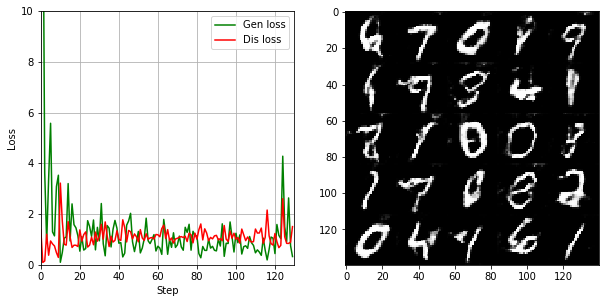

Epc: 2/2    Bat: 0110/1200    Dis Loss: 1.3125    Gen Loss: 2.3250    Time elaps: 00:03:19    Time remain: 00:02:45.
Epc: 2/2    Bat: 0120/1200    Dis Loss: 0.6187    Gen Loss: 1.8189    Time elaps: 00:03:20    Time remain: 00:02:44.
Epc: 2/2    Bat: 0130/1200    Dis Loss: 0.7631    Gen Loss: 1.8020    Time elaps: 00:03:22    Time remain: 00:02:42.
Epc: 2/2    Bat: 0140/1200    Dis Loss: 0.7995    Gen Loss: 1.2796    Time elaps: 00:03:23    Time remain: 00:02:41.
Epc: 2/2    Bat: 0150/1200    Dis Loss: 0.7016    Gen Loss: 0.9485    Time elaps: 00:03:25    Time remain: 00:02:39.
Epc: 2/2    Bat: 0160/1200    Dis Loss: 1.2660    Gen Loss: 0.4591    Time elaps: 00:03:26    Time remain: 00:02:38.
Epc: 2/2    Bat: 0170/1200    Dis Loss: 0.8788    Gen Loss: 1.6250    Time elaps: 00:03:28    Time remain: 00:02:36.
Epc: 2/2    Bat: 0180/1200    Dis Loss: 1.3568    Gen Loss: 1.2442    Time elaps: 00:03:29    Time remain: 00:02:34.
Epc: 2/2    Bat: 0190/1200    Dis Loss: 1.8182    Gen Loss: 0.25

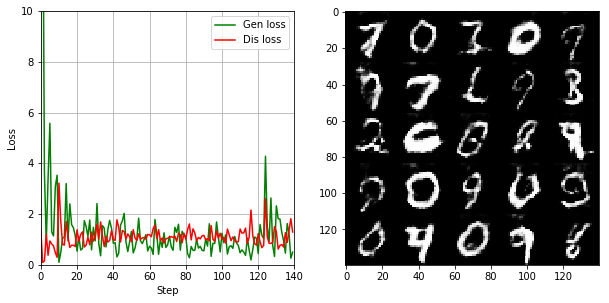

Epc: 2/2    Bat: 0210/1200    Dis Loss: 0.9519    Gen Loss: 0.8532    Time elaps: 00:03:34    Time remain: 00:02:30.
Epc: 2/2    Bat: 0220/1200    Dis Loss: 1.1816    Gen Loss: 0.5520    Time elaps: 00:03:35    Time remain: 00:02:28.
Epc: 2/2    Bat: 0230/1200    Dis Loss: 0.6899    Gen Loss: 1.4252    Time elaps: 00:03:37    Time remain: 00:02:27.
Epc: 2/2    Bat: 0240/1200    Dis Loss: 0.9592    Gen Loss: 2.0365    Time elaps: 00:03:38    Time remain: 00:02:25.
Epc: 2/2    Bat: 0250/1200    Dis Loss: 0.9819    Gen Loss: 0.8079    Time elaps: 00:03:40    Time remain: 00:02:24.
Epc: 2/2    Bat: 0260/1200    Dis Loss: 0.5430    Gen Loss: 1.3112    Time elaps: 00:03:41    Time remain: 00:02:22.
Epc: 2/2    Bat: 0270/1200    Dis Loss: 1.1665    Gen Loss: 0.8656    Time elaps: 00:03:43    Time remain: 00:02:21.
Epc: 2/2    Bat: 0280/1200    Dis Loss: 0.7439    Gen Loss: 1.1010    Time elaps: 00:03:44    Time remain: 00:02:19.
Epc: 2/2    Bat: 0290/1200    Dis Loss: 1.0428    Gen Loss: 0.88

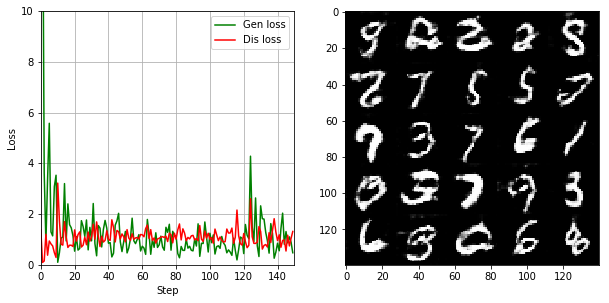

Epc: 2/2    Bat: 0310/1200    Dis Loss: 1.0230    Gen Loss: 0.7565    Time elaps: 00:03:49    Time remain: 00:02:15.
Epc: 2/2    Bat: 0320/1200    Dis Loss: 1.1445    Gen Loss: 2.6105    Time elaps: 00:03:50    Time remain: 00:02:13.
Epc: 2/2    Bat: 0330/1200    Dis Loss: 1.4012    Gen Loss: 0.4666    Time elaps: 00:03:52    Time remain: 00:02:12.
Epc: 2/2    Bat: 0340/1200    Dis Loss: 0.9243    Gen Loss: 1.4913    Time elaps: 00:03:53    Time remain: 00:02:10.
Epc: 2/2    Bat: 0350/1200    Dis Loss: 0.6177    Gen Loss: 1.6321    Time elaps: 00:03:55    Time remain: 00:02:08.
Epc: 2/2    Bat: 0360/1200    Dis Loss: 1.2167    Gen Loss: 0.4952    Time elaps: 00:03:56    Time remain: 00:02:07.
Epc: 2/2    Bat: 0370/1200    Dis Loss: 0.8248    Gen Loss: 0.8371    Time elaps: 00:03:58    Time remain: 00:02:05.
Epc: 2/2    Bat: 0380/1200    Dis Loss: 0.8002    Gen Loss: 1.6553    Time elaps: 00:03:59    Time remain: 00:02:04.
Epc: 2/2    Bat: 0390/1200    Dis Loss: 0.9949    Gen Loss: 0.88

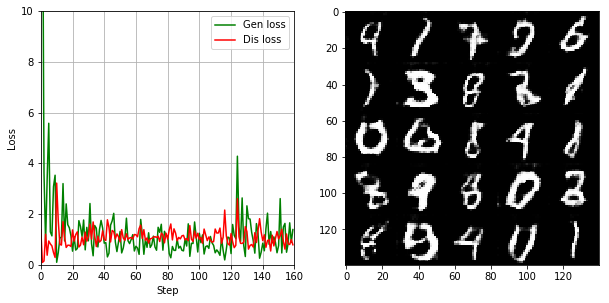

Epc: 2/2    Bat: 0410/1200    Dis Loss: 0.9934    Gen Loss: 0.6733    Time elaps: 00:04:04    Time remain: 00:01:59.
Epc: 2/2    Bat: 0420/1200    Dis Loss: 1.8641    Gen Loss: 0.3791    Time elaps: 00:04:05    Time remain: 00:01:58.
Epc: 2/2    Bat: 0430/1200    Dis Loss: 0.9263    Gen Loss: 0.9036    Time elaps: 00:04:07    Time remain: 00:01:56.
Epc: 2/2    Bat: 0440/1200    Dis Loss: 1.1084    Gen Loss: 0.5566    Time elaps: 00:04:08    Time remain: 00:01:55.
Epc: 2/2    Bat: 0450/1200    Dis Loss: 0.9431    Gen Loss: 2.7479    Time elaps: 00:04:10    Time remain: 00:01:53.
Epc: 2/2    Bat: 0460/1200    Dis Loss: 0.8330    Gen Loss: 0.9327    Time elaps: 00:04:11    Time remain: 00:01:52.
Epc: 2/2    Bat: 0470/1200    Dis Loss: 1.2403    Gen Loss: 0.5248    Time elaps: 00:04:13    Time remain: 00:01:50.
Epc: 2/2    Bat: 0480/1200    Dis Loss: 0.6540    Gen Loss: 1.1346    Time elaps: 00:04:14    Time remain: 00:01:49.
Epc: 2/2    Bat: 0490/1200    Dis Loss: 0.8287    Gen Loss: 0.93

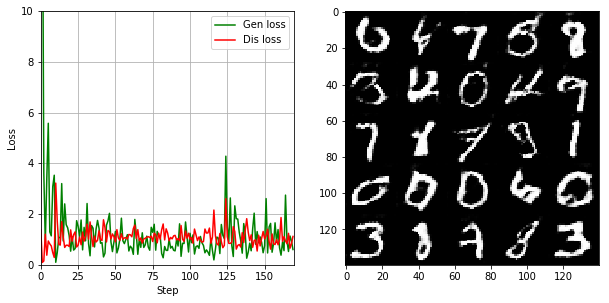

Epc: 2/2    Bat: 0510/1200    Dis Loss: 1.1620    Gen Loss: 0.5569    Time elaps: 00:04:19    Time remain: 00:01:44.
Epc: 2/2    Bat: 0520/1200    Dis Loss: 1.1702    Gen Loss: 0.5503    Time elaps: 00:04:20    Time remain: 00:01:43.
Epc: 2/2    Bat: 0530/1200    Dis Loss: 0.5787    Gen Loss: 1.2574    Time elaps: 00:04:22    Time remain: 00:01:41.
Epc: 2/2    Bat: 0540/1200    Dis Loss: 0.6366    Gen Loss: 1.2574    Time elaps: 00:04:23    Time remain: 00:01:40.
Epc: 2/2    Bat: 0550/1200    Dis Loss: 1.5182    Gen Loss: 3.2439    Time elaps: 00:04:25    Time remain: 00:01:38.
Epc: 2/2    Bat: 0560/1200    Dis Loss: 1.3645    Gen Loss: 0.4447    Time elaps: 00:04:26    Time remain: 00:01:36.
Epc: 2/2    Bat: 0570/1200    Dis Loss: 0.9032    Gen Loss: 0.7380    Time elaps: 00:04:28    Time remain: 00:01:35.
Epc: 2/2    Bat: 0580/1200    Dis Loss: 1.3740    Gen Loss: 0.4383    Time elaps: 00:04:29    Time remain: 00:01:33.
Epc: 2/2    Bat: 0590/1200    Dis Loss: 0.7152    Gen Loss: 1.30

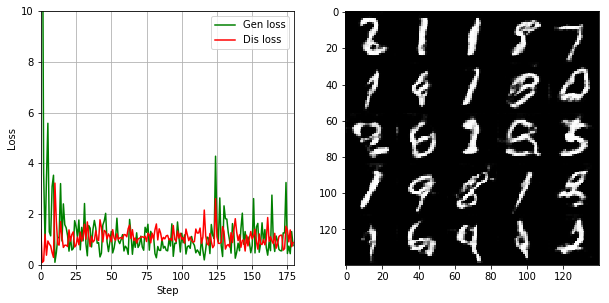

Epc: 2/2    Bat: 0610/1200    Dis Loss: 1.1596    Gen Loss: 0.5399    Time elaps: 00:04:34    Time remain: 00:01:29.
Epc: 2/2    Bat: 0620/1200    Dis Loss: 1.7393    Gen Loss: 0.3443    Time elaps: 00:04:35    Time remain: 00:01:27.
Epc: 2/2    Bat: 0630/1200    Dis Loss: 0.5958    Gen Loss: 1.4549    Time elaps: 00:04:37    Time remain: 00:01:26.
Epc: 2/2    Bat: 0640/1200    Dis Loss: 0.7774    Gen Loss: 1.1161    Time elaps: 00:04:38    Time remain: 00:01:24.
Epc: 2/2    Bat: 0650/1200    Dis Loss: 1.2347    Gen Loss: 0.4620    Time elaps: 00:04:40    Time remain: 00:01:23.
Epc: 2/2    Bat: 0660/1200    Dis Loss: 0.7649    Gen Loss: 0.9915    Time elaps: 00:04:41    Time remain: 00:01:21.
Epc: 2/2    Bat: 0670/1200    Dis Loss: 1.8729    Gen Loss: 2.5909    Time elaps: 00:04:43    Time remain: 00:01:20.
Epc: 2/2    Bat: 0680/1200    Dis Loss: 0.8206    Gen Loss: 1.1604    Time elaps: 00:04:44    Time remain: 00:01:18.
Epc: 2/2    Bat: 0690/1200    Dis Loss: 0.7942    Gen Loss: 1.05

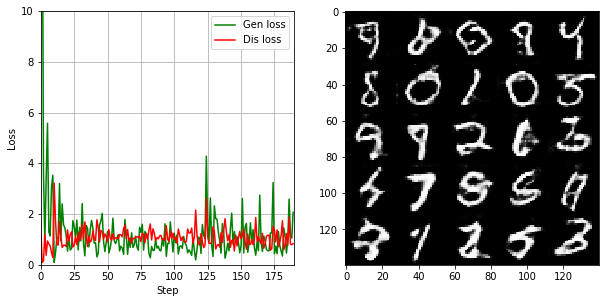

Epc: 2/2    Bat: 0710/1200    Dis Loss: 1.2499    Gen Loss: 0.5317    Time elaps: 00:04:49    Time remain: 00:01:14.
Epc: 2/2    Bat: 0720/1200    Dis Loss: 0.8041    Gen Loss: 1.2337    Time elaps: 00:04:50    Time remain: 00:01:12.
Epc: 2/2    Bat: 0730/1200    Dis Loss: 0.5681    Gen Loss: 1.5518    Time elaps: 00:04:52    Time remain: 00:01:11.
Epc: 2/2    Bat: 0740/1200    Dis Loss: 0.9934    Gen Loss: 1.6562    Time elaps: 00:04:53    Time remain: 00:01:09.
Epc: 2/2    Bat: 0750/1200    Dis Loss: 0.7259    Gen Loss: 1.1926    Time elaps: 00:04:55    Time remain: 00:01:08.
Epc: 2/2    Bat: 0760/1200    Dis Loss: 1.1796    Gen Loss: 0.6026    Time elaps: 00:04:56    Time remain: 00:01:06.
Epc: 2/2    Bat: 0770/1200    Dis Loss: 0.4552    Gen Loss: 1.4354    Time elaps: 00:04:58    Time remain: 00:01:05.
Epc: 2/2    Bat: 0780/1200    Dis Loss: 0.6807    Gen Loss: 1.1511    Time elaps: 00:04:59    Time remain: 00:01:03.
Epc: 2/2    Bat: 0790/1200    Dis Loss: 0.4412    Gen Loss: 1.64

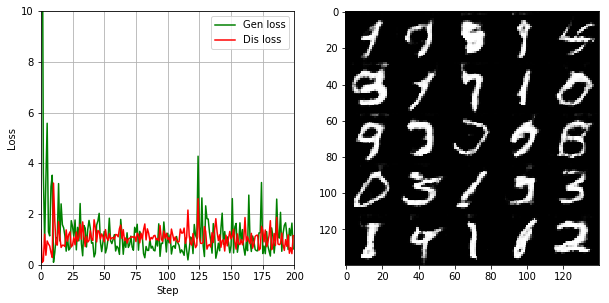

Epc: 2/2    Bat: 0810/1200    Dis Loss: 0.7836    Gen Loss: 0.9646    Time elaps: 00:05:04    Time remain: 00:00:59.
Epc: 2/2    Bat: 0820/1200    Dis Loss: 1.7767    Gen Loss: 0.4054    Time elaps: 00:05:05    Time remain: 00:00:57.
Epc: 2/2    Bat: 0830/1200    Dis Loss: 1.5127    Gen Loss: 0.3743    Time elaps: 00:05:07    Time remain: 00:00:55.
Epc: 2/2    Bat: 0840/1200    Dis Loss: 0.8029    Gen Loss: 0.8451    Time elaps: 00:05:08    Time remain: 00:00:54.
Epc: 2/2    Bat: 0850/1200    Dis Loss: 0.6126    Gen Loss: 1.2456    Time elaps: 00:05:10    Time remain: 00:00:52.
Epc: 2/2    Bat: 0860/1200    Dis Loss: 0.7750    Gen Loss: 0.9682    Time elaps: 00:05:11    Time remain: 00:00:51.
Epc: 2/2    Bat: 0870/1200    Dis Loss: 2.0786    Gen Loss: 0.3143    Time elaps: 00:05:13    Time remain: 00:00:49.
Epc: 2/2    Bat: 0880/1200    Dis Loss: 1.0627    Gen Loss: 0.6790    Time elaps: 00:05:14    Time remain: 00:00:48.
Epc: 2/2    Bat: 0890/1200    Dis Loss: 1.0481    Gen Loss: 0.64

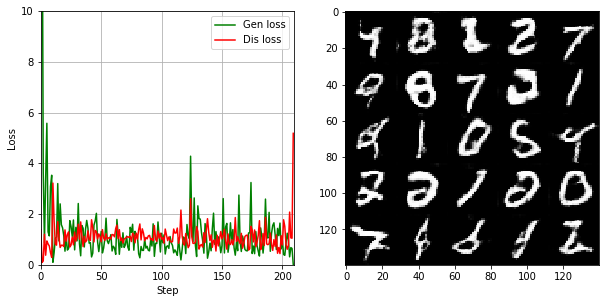

Epc: 2/2    Bat: 0910/1200    Dis Loss: 0.9170    Gen Loss: 0.8692    Time elaps: 00:05:19    Time remain: 00:00:43.
Epc: 2/2    Bat: 0920/1200    Dis Loss: 0.7885    Gen Loss: 0.8966    Time elaps: 00:05:20    Time remain: 00:00:42.
Epc: 2/2    Bat: 0930/1200    Dis Loss: 0.5830    Gen Loss: 1.7449    Time elaps: 00:05:22    Time remain: 00:00:40.
Epc: 2/2    Bat: 0940/1200    Dis Loss: 0.9545    Gen Loss: 0.7382    Time elaps: 00:05:23    Time remain: 00:00:39.
Epc: 2/2    Bat: 0950/1200    Dis Loss: 0.6234    Gen Loss: 1.2091    Time elaps: 00:05:25    Time remain: 00:00:37.
Epc: 2/2    Bat: 0960/1200    Dis Loss: 0.7809    Gen Loss: 1.0866    Time elaps: 00:05:26    Time remain: 00:00:36.
Epc: 2/2    Bat: 0970/1200    Dis Loss: 2.0861    Gen Loss: 0.2463    Time elaps: 00:05:27    Time remain: 00:00:34.
Epc: 2/2    Bat: 0980/1200    Dis Loss: 0.6755    Gen Loss: 2.3053    Time elaps: 00:05:29    Time remain: 00:00:33.
Epc: 2/2    Bat: 0990/1200    Dis Loss: 0.8724    Gen Loss: 2.08

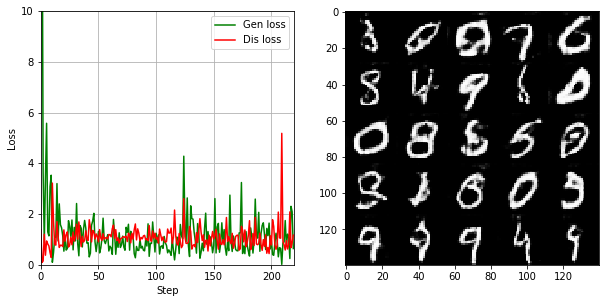

Epc: 2/2    Bat: 1010/1200    Dis Loss: 0.5136    Gen Loss: 1.4492    Time elaps: 00:05:34    Time remain: 00:00:28.
Epc: 2/2    Bat: 1020/1200    Dis Loss: 1.2487    Gen Loss: 0.5799    Time elaps: 00:05:35    Time remain: 00:00:27.
Epc: 2/2    Bat: 1030/1200    Dis Loss: 1.5652    Gen Loss: 0.4472    Time elaps: 00:05:37    Time remain: 00:00:25.
Epc: 2/2    Bat: 1040/1200    Dis Loss: 1.0750    Gen Loss: 0.6233    Time elaps: 00:05:38    Time remain: 00:00:24.
Epc: 2/2    Bat: 1050/1200    Dis Loss: 0.8905    Gen Loss: 0.7826    Time elaps: 00:05:40    Time remain: 00:00:22.
Epc: 2/2    Bat: 1060/1200    Dis Loss: 0.8856    Gen Loss: 0.8072    Time elaps: 00:05:41    Time remain: 00:00:21.
Epc: 2/2    Bat: 1070/1200    Dis Loss: 0.6944    Gen Loss: 1.0679    Time elaps: 00:05:42    Time remain: 00:00:19.
Epc: 2/2    Bat: 1080/1200    Dis Loss: 0.8550    Gen Loss: 0.7686    Time elaps: 00:05:44    Time remain: 00:00:18.
Epc: 2/2    Bat: 1090/1200    Dis Loss: 1.1381    Gen Loss: 3.26

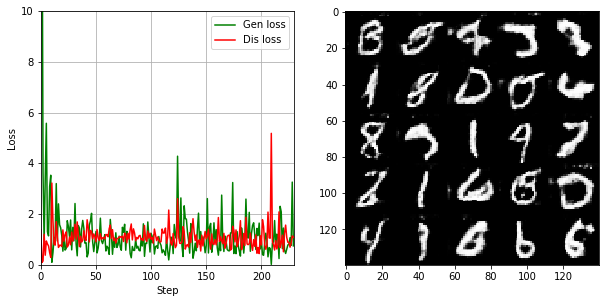

Epc: 2/2    Bat: 1110/1200    Dis Loss: 0.9452    Gen Loss: 1.2145    Time elaps: 00:05:49    Time remain: 00:00:13.
Epc: 2/2    Bat: 1120/1200    Dis Loss: 1.2079    Gen Loss: 0.6338    Time elaps: 00:05:50    Time remain: 00:00:12.
Epc: 2/2    Bat: 1130/1200    Dis Loss: 0.7418    Gen Loss: 0.9518    Time elaps: 00:05:52    Time remain: 00:00:10.
Epc: 2/2    Bat: 1140/1200    Dis Loss: 1.4913    Gen Loss: 0.5928    Time elaps: 00:05:53    Time remain: 00:00:09.
Epc: 2/2    Bat: 1150/1200    Dis Loss: 1.6519    Gen Loss: 0.3755    Time elaps: 00:05:55    Time remain: 00:00:07.
Epc: 2/2    Bat: 1160/1200    Dis Loss: 0.7686    Gen Loss: 0.9216    Time elaps: 00:05:56    Time remain: 00:00:06.
Epc: 2/2    Bat: 1170/1200    Dis Loss: 0.7124    Gen Loss: 1.4410    Time elaps: 00:05:57    Time remain: 00:00:04.
Epc: 2/2    Bat: 1180/1200    Dis Loss: 1.8647    Gen Loss: 4.1134    Time elaps: 00:05:59    Time remain: 00:00:03.
Epc: 2/2    Bat: 1190/1200    Dis Loss: 0.6600    Gen Loss: 1.08

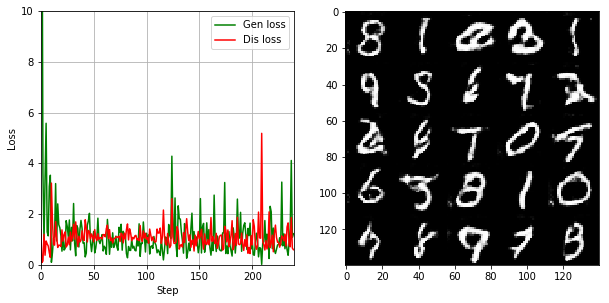

In [195]:
batch_size = 50
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches, mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epc: 1/1    Bat: 0010/12662    Dis Loss: 2.1546    Gen Loss: 0.1606    Time elaps: 00:00:01    Time remain: 00:24:44.
Epc: 1/1    Bat: 0020/12662    Dis Loss: 1.3868    Gen Loss: 0.4053    Time elaps: 00:00:01    Time remain: 00:20:12.
Epc: 1/1    Bat: 0030/12662    Dis Loss: 1.1835    Gen Loss: 0.4550    Time elaps: 00:00:02    Time remain: 00:18:41.
Epc: 1/1    Bat: 0040/12662    Dis Loss: 0.7408    Gen Loss: 0.8861    Time elaps: 00:00:03    Time remain: 00:17:54.
Epc: 1/1    Bat: 0050/12662    Dis Loss: 1.0579    Gen Loss: 0.5992    Time elaps: 00:00:04    Time remain: 00:17:26.
Epc: 1/1    Bat: 0060/12662    Dis Loss: 0.4142    Gen Loss: 1.3272    Time elaps: 00:00:04    Time remain: 00:17:07.
Epc: 1/1    Bat: 0070/12662    Dis Loss: 0.6332    Gen Loss: 0.9612    Time elaps: 00:00:05    Time remain: 00:16:53.
Epc: 1/1    Bat: 0080/12662    Dis Loss: 0.2636    Gen Loss: 2.3322    Time elaps: 00:00:06    Time remain: 00:16:43.
Epc: 1/1    Bat: 0090/12662    Dis Loss: 0.3658    Gen L

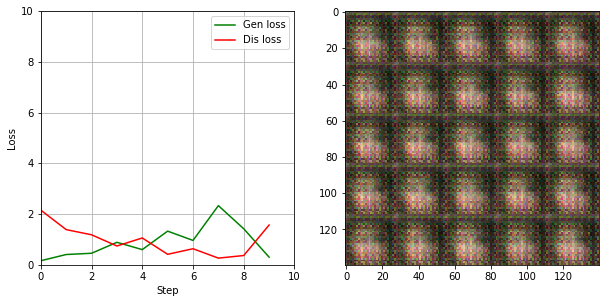

Epc: 1/1    Bat: 0110/12662    Dis Loss: 0.4216    Gen Loss: 2.1093    Time elaps: 00:00:08    Time remain: 00:17:02.
Epc: 1/1    Bat: 0120/12662    Dis Loss: 0.5186    Gen Loss: 1.2191    Time elaps: 00:00:09    Time remain: 00:16:58.
Epc: 1/1    Bat: 0130/12662    Dis Loss: 0.2779    Gen Loss: 1.8991    Time elaps: 00:00:10    Time remain: 00:16:50.
Epc: 1/1    Bat: 0140/12662    Dis Loss: 1.2103    Gen Loss: 0.4710    Time elaps: 00:00:11    Time remain: 00:16:44.
Epc: 1/1    Bat: 0150/12662    Dis Loss: 0.3921    Gen Loss: 1.4236    Time elaps: 00:00:11    Time remain: 00:16:38.
Epc: 1/1    Bat: 0160/12662    Dis Loss: 0.5259    Gen Loss: 0.9594    Time elaps: 00:00:12    Time remain: 00:16:33.
Epc: 1/1    Bat: 0170/12662    Dis Loss: 0.1428    Gen Loss: 4.4037    Time elaps: 00:00:13    Time remain: 00:16:29.
Epc: 1/1    Bat: 0180/12662    Dis Loss: 0.2458    Gen Loss: 2.1533    Time elaps: 00:00:14    Time remain: 00:16:24.
Epc: 1/1    Bat: 0190/12662    Dis Loss: 0.5558    Gen L

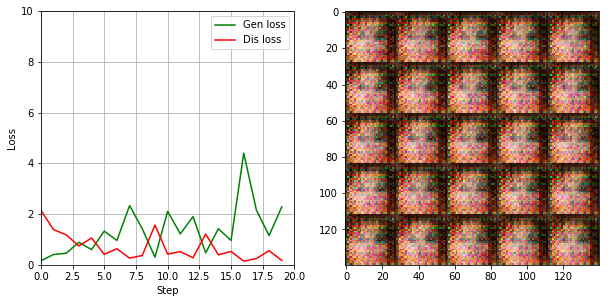

Epc: 1/1    Bat: 0210/12662    Dis Loss: 0.1526    Gen Loss: 6.4571    Time elaps: 00:00:16    Time remain: 00:16:35.
Epc: 1/1    Bat: 0220/12662    Dis Loss: 0.1468    Gen Loss: 2.3470    Time elaps: 00:00:17    Time remain: 00:16:31.
Epc: 1/1    Bat: 0230/12662    Dis Loss: 0.1371    Gen Loss: 2.4331    Time elaps: 00:00:18    Time remain: 00:16:30.
Epc: 1/1    Bat: 0240/12662    Dis Loss: 0.0904    Gen Loss: 3.0466    Time elaps: 00:00:19    Time remain: 00:16:30.
Epc: 1/1    Bat: 0250/12662    Dis Loss: 0.0357    Gen Loss: 5.8969    Time elaps: 00:00:19    Time remain: 00:16:29.
Epc: 1/1    Bat: 0260/12662    Dis Loss: 0.1863    Gen Loss: 2.1726    Time elaps: 00:00:20    Time remain: 00:16:28.
Epc: 1/1    Bat: 0270/12662    Dis Loss: 0.0854    Gen Loss: 2.7004    Time elaps: 00:00:21    Time remain: 00:16:26.
Epc: 1/1    Bat: 0280/12662    Dis Loss: 0.2629    Gen Loss: 1.7988    Time elaps: 00:00:22    Time remain: 00:16:25.
Epc: 1/1    Bat: 0290/12662    Dis Loss: 0.1265    Gen L

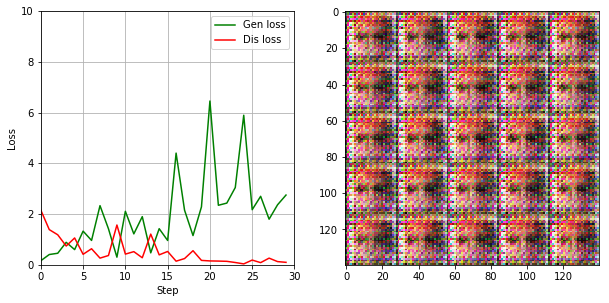

Epc: 1/1    Bat: 0310/12662    Dis Loss: 0.0735    Gen Loss: 2.8462    Time elaps: 00:00:25    Time remain: 00:16:52.
Epc: 1/1    Bat: 0320/12662    Dis Loss: 0.2480    Gen Loss: 1.9818    Time elaps: 00:00:26    Time remain: 00:16:51.
Epc: 1/1    Bat: 0330/12662    Dis Loss: 0.0956    Gen Loss: 2.5629    Time elaps: 00:00:27    Time remain: 00:16:49.
Epc: 1/1    Bat: 0340/12662    Dis Loss: 0.1616    Gen Loss: 2.2670    Time elaps: 00:00:27    Time remain: 00:16:46.
Epc: 1/1    Bat: 0350/12662    Dis Loss: 0.2892    Gen Loss: 1.5975    Time elaps: 00:00:28    Time remain: 00:16:42.
Epc: 1/1    Bat: 0360/12662    Dis Loss: 0.0522    Gen Loss: 3.4598    Time elaps: 00:00:29    Time remain: 00:16:39.
Epc: 1/1    Bat: 0370/12662    Dis Loss: 0.0932    Gen Loss: 2.6281    Time elaps: 00:00:29    Time remain: 00:16:36.
Epc: 1/1    Bat: 0380/12662    Dis Loss: 0.1299    Gen Loss: 2.5362    Time elaps: 00:00:30    Time remain: 00:16:33.
Epc: 1/1    Bat: 0390/12662    Dis Loss: 0.2752    Gen L

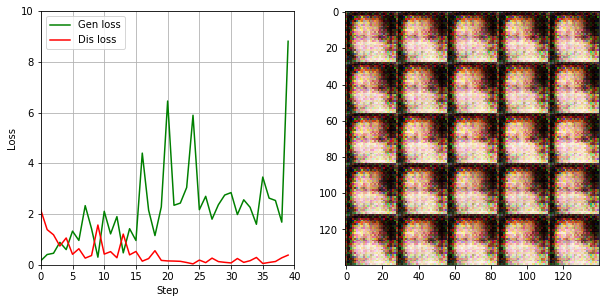

Epc: 1/1    Bat: 0410/12662    Dis Loss: 0.0897    Gen Loss: 3.6229    Time elaps: 00:00:33    Time remain: 00:16:37.
Epc: 1/1    Bat: 0420/12662    Dis Loss: 0.1720    Gen Loss: 3.0897    Time elaps: 00:00:34    Time remain: 00:16:34.
Epc: 1/1    Bat: 0430/12662    Dis Loss: 0.1004    Gen Loss: 2.7676    Time elaps: 00:00:34    Time remain: 00:16:32.
Epc: 1/1    Bat: 0440/12662    Dis Loss: 0.2027    Gen Loss: 2.3036    Time elaps: 00:00:35    Time remain: 00:16:29.
Epc: 1/1    Bat: 0450/12662    Dis Loss: 0.3353    Gen Loss: 3.7400    Time elaps: 00:00:36    Time remain: 00:16:26.
Epc: 1/1    Bat: 0460/12662    Dis Loss: 0.6587    Gen Loss: 2.3974    Time elaps: 00:00:37    Time remain: 00:16:24.
Epc: 1/1    Bat: 0470/12662    Dis Loss: 0.5809    Gen Loss: 1.1181    Time elaps: 00:00:37    Time remain: 00:16:21.
Epc: 1/1    Bat: 0480/12662    Dis Loss: 0.6132    Gen Loss: 3.3115    Time elaps: 00:00:38    Time remain: 00:16:19.
Epc: 1/1    Bat: 0490/12662    Dis Loss: 0.3953    Gen L

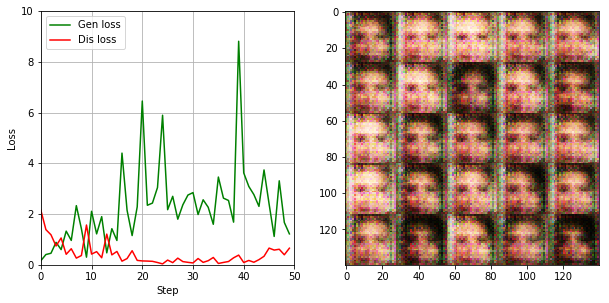

Epc: 1/1    Bat: 0510/12662    Dis Loss: 0.2371    Gen Loss: 2.5616    Time elaps: 00:00:41    Time remain: 00:16:24.
Epc: 1/1    Bat: 0520/12662    Dis Loss: 0.3405    Gen Loss: 2.0388    Time elaps: 00:00:42    Time remain: 00:16:22.
Epc: 1/1    Bat: 0530/12662    Dis Loss: 0.8946    Gen Loss: 0.7030    Time elaps: 00:00:42    Time remain: 00:16:19.
Epc: 1/1    Bat: 0540/12662    Dis Loss: 0.4795    Gen Loss: 1.5679    Time elaps: 00:00:43    Time remain: 00:16:17.
Epc: 1/1    Bat: 0550/12662    Dis Loss: 0.4897    Gen Loss: 1.3262    Time elaps: 00:00:44    Time remain: 00:16:15.
Epc: 1/1    Bat: 0560/12662    Dis Loss: 0.6793    Gen Loss: 0.8643    Time elaps: 00:00:45    Time remain: 00:16:13.
Epc: 1/1    Bat: 0570/12662    Dis Loss: 1.3143    Gen Loss: 0.4379    Time elaps: 00:00:45    Time remain: 00:16:11.
Epc: 1/1    Bat: 0580/12662    Dis Loss: 0.4078    Gen Loss: 1.5258    Time elaps: 00:00:46    Time remain: 00:16:09.
Epc: 1/1    Bat: 0590/12662    Dis Loss: 0.5659    Gen L

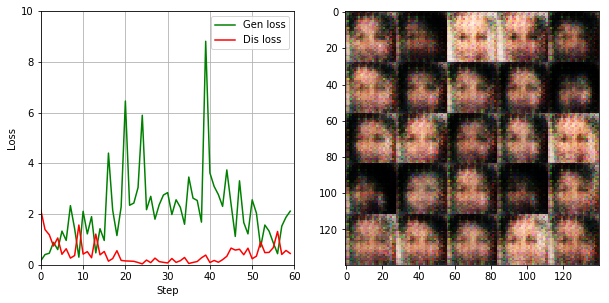

Epc: 1/1    Bat: 0610/12662    Dis Loss: 0.6560    Gen Loss: 1.4097    Time elaps: 00:00:49    Time remain: 00:16:11.
Epc: 1/1    Bat: 0620/12662    Dis Loss: 0.9872    Gen Loss: 0.7338    Time elaps: 00:00:49    Time remain: 00:16:09.
Epc: 1/1    Bat: 0630/12662    Dis Loss: 1.1822    Gen Loss: 0.5752    Time elaps: 00:00:50    Time remain: 00:16:07.
Epc: 1/1    Bat: 0640/12662    Dis Loss: 0.9398    Gen Loss: 0.9376    Time elaps: 00:00:51    Time remain: 00:16:05.
Epc: 1/1    Bat: 0650/12662    Dis Loss: 1.4211    Gen Loss: 4.2911    Time elaps: 00:00:52    Time remain: 00:16:03.
Epc: 1/1    Bat: 0660/12662    Dis Loss: 0.9062    Gen Loss: 0.7478    Time elaps: 00:00:52    Time remain: 00:16:01.
Epc: 1/1    Bat: 0670/12662    Dis Loss: 1.6487    Gen Loss: 0.2784    Time elaps: 00:00:53    Time remain: 00:15:59.
Epc: 1/1    Bat: 0680/12662    Dis Loss: 0.7394    Gen Loss: 1.5794    Time elaps: 00:00:54    Time remain: 00:15:57.
Epc: 1/1    Bat: 0690/12662    Dis Loss: 0.6966    Gen L

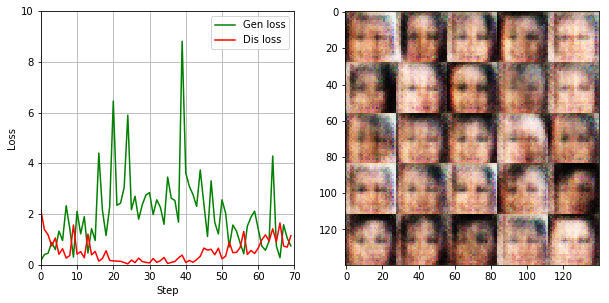

Epc: 1/1    Bat: 0710/12662    Dis Loss: 1.1867    Gen Loss: 2.5247    Time elaps: 00:00:56    Time remain: 00:15:59.
Epc: 1/1    Bat: 0720/12662    Dis Loss: 1.2205    Gen Loss: 0.4711    Time elaps: 00:00:57    Time remain: 00:15:57.
Epc: 1/1    Bat: 0730/12662    Dis Loss: 0.9957    Gen Loss: 2.3570    Time elaps: 00:00:58    Time remain: 00:15:55.
Epc: 1/1    Bat: 0740/12662    Dis Loss: 0.9696    Gen Loss: 0.7305    Time elaps: 00:00:59    Time remain: 00:15:54.
Epc: 1/1    Bat: 0750/12662    Dis Loss: 0.7118    Gen Loss: 1.3803    Time elaps: 00:00:59    Time remain: 00:15:52.
Epc: 1/1    Bat: 0760/12662    Dis Loss: 0.7068    Gen Loss: 1.1431    Time elaps: 00:01:00    Time remain: 00:15:50.
Epc: 1/1    Bat: 0770/12662    Dis Loss: 0.6253    Gen Loss: 1.8779    Time elaps: 00:01:01    Time remain: 00:15:49.
Epc: 1/1    Bat: 0780/12662    Dis Loss: 0.6859    Gen Loss: 0.9399    Time elaps: 00:01:02    Time remain: 00:15:47.
Epc: 1/1    Bat: 0790/12662    Dis Loss: 0.9305    Gen L

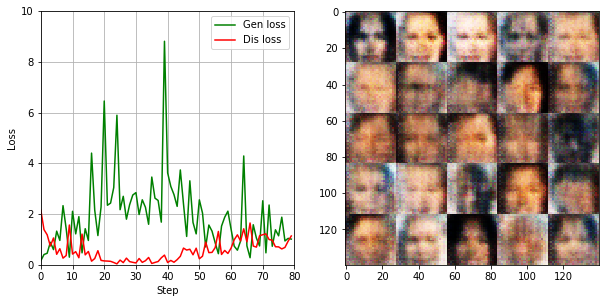

Epc: 1/1    Bat: 0810/12662    Dis Loss: 1.1003    Gen Loss: 0.5492    Time elaps: 00:01:04    Time remain: 00:15:49.
Epc: 1/1    Bat: 0820/12662    Dis Loss: 0.8950    Gen Loss: 1.2761    Time elaps: 00:01:05    Time remain: 00:15:47.
Epc: 1/1    Bat: 0830/12662    Dis Loss: 0.6230    Gen Loss: 1.4361    Time elaps: 00:01:06    Time remain: 00:15:46.
Epc: 1/1    Bat: 0840/12662    Dis Loss: 0.7917    Gen Loss: 0.8380    Time elaps: 00:01:07    Time remain: 00:15:44.
Epc: 1/1    Bat: 0850/12662    Dis Loss: 0.9547    Gen Loss: 2.2209    Time elaps: 00:01:07    Time remain: 00:15:42.
Epc: 1/1    Bat: 0860/12662    Dis Loss: 0.7468    Gen Loss: 1.0189    Time elaps: 00:01:08    Time remain: 00:15:41.
Epc: 1/1    Bat: 0870/12662    Dis Loss: 0.9362    Gen Loss: 0.8628    Time elaps: 00:01:09    Time remain: 00:15:39.
Epc: 1/1    Bat: 0880/12662    Dis Loss: 1.0218    Gen Loss: 0.6039    Time elaps: 00:01:10    Time remain: 00:15:38.
Epc: 1/1    Bat: 0890/12662    Dis Loss: 0.9555    Gen L

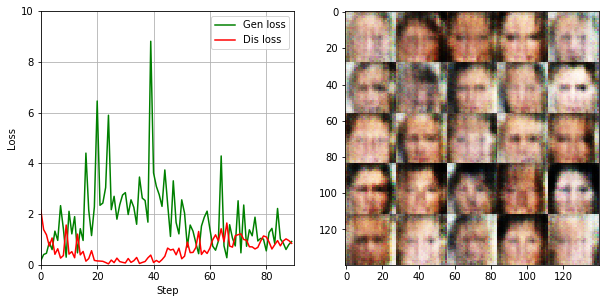

Epc: 1/1    Bat: 0910/12662    Dis Loss: 0.8950    Gen Loss: 1.1498    Time elaps: 00:01:12    Time remain: 00:15:39.
Epc: 1/1    Bat: 0920/12662    Dis Loss: 0.6742    Gen Loss: 1.1909    Time elaps: 00:01:13    Time remain: 00:15:38.
Epc: 1/1    Bat: 0930/12662    Dis Loss: 1.2154    Gen Loss: 0.6801    Time elaps: 00:01:14    Time remain: 00:15:36.
Epc: 1/1    Bat: 0940/12662    Dis Loss: 0.8548    Gen Loss: 0.8637    Time elaps: 00:01:14    Time remain: 00:15:35.
Epc: 1/1    Bat: 0950/12662    Dis Loss: 0.7354    Gen Loss: 1.8802    Time elaps: 00:01:15    Time remain: 00:15:33.
Epc: 1/1    Bat: 0960/12662    Dis Loss: 0.7869    Gen Loss: 0.8962    Time elaps: 00:01:16    Time remain: 00:15:32.
Epc: 1/1    Bat: 0970/12662    Dis Loss: 0.8865    Gen Loss: 0.7047    Time elaps: 00:01:17    Time remain: 00:15:30.
Epc: 1/1    Bat: 0980/12662    Dis Loss: 0.9146    Gen Loss: 0.8000    Time elaps: 00:01:17    Time remain: 00:15:29.
Epc: 1/1    Bat: 0990/12662    Dis Loss: 0.7477    Gen L

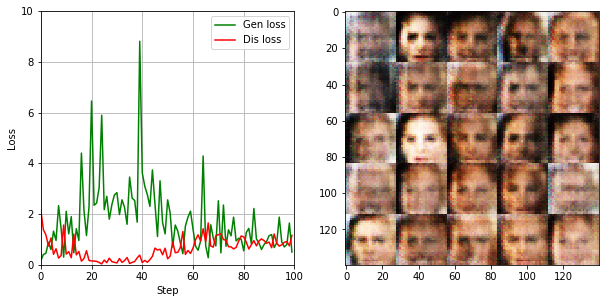

Epc: 1/1    Bat: 1010/12662    Dis Loss: 0.8006    Gen Loss: 0.8335    Time elaps: 00:01:20    Time remain: 00:15:29.
Epc: 1/1    Bat: 1020/12662    Dis Loss: 1.9597    Gen Loss: 0.2232    Time elaps: 00:01:21    Time remain: 00:15:28.
Epc: 1/1    Bat: 1030/12662    Dis Loss: 1.1099    Gen Loss: 0.7141    Time elaps: 00:01:22    Time remain: 00:15:26.
Epc: 1/1    Bat: 1040/12662    Dis Loss: 1.0530    Gen Loss: 0.6252    Time elaps: 00:01:22    Time remain: 00:15:25.
Epc: 1/1    Bat: 1050/12662    Dis Loss: 0.7669    Gen Loss: 0.9278    Time elaps: 00:01:23    Time remain: 00:15:24.
Epc: 1/1    Bat: 1060/12662    Dis Loss: 0.9077    Gen Loss: 0.8576    Time elaps: 00:01:24    Time remain: 00:15:23.
Epc: 1/1    Bat: 1070/12662    Dis Loss: 1.1856    Gen Loss: 0.6396    Time elaps: 00:01:25    Time remain: 00:15:22.
Epc: 1/1    Bat: 1080/12662    Dis Loss: 0.9448    Gen Loss: 0.8924    Time elaps: 00:01:25    Time remain: 00:15:20.
Epc: 1/1    Bat: 1090/12662    Dis Loss: 0.9999    Gen L

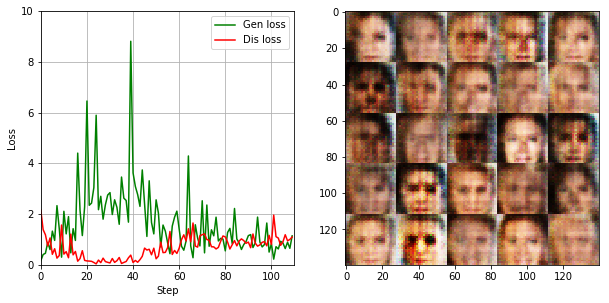

Epc: 1/1    Bat: 1110/12662    Dis Loss: 1.3949    Gen Loss: 0.5857    Time elaps: 00:01:28    Time remain: 00:15:20.
Epc: 1/1    Bat: 1120/12662    Dis Loss: 1.1296    Gen Loss: 0.5647    Time elaps: 00:01:29    Time remain: 00:15:19.
Epc: 1/1    Bat: 1130/12662    Dis Loss: 1.3082    Gen Loss: 0.5705    Time elaps: 00:01:29    Time remain: 00:15:18.
Epc: 1/1    Bat: 1140/12662    Dis Loss: 1.1332    Gen Loss: 0.5192    Time elaps: 00:01:30    Time remain: 00:15:17.
Epc: 1/1    Bat: 1150/12662    Dis Loss: 1.0412    Gen Loss: 0.6480    Time elaps: 00:01:31    Time remain: 00:15:16.
Epc: 1/1    Bat: 1160/12662    Dis Loss: 0.6280    Gen Loss: 1.1884    Time elaps: 00:01:32    Time remain: 00:15:14.
Epc: 1/1    Bat: 1170/12662    Dis Loss: 1.2518    Gen Loss: 0.5141    Time elaps: 00:01:33    Time remain: 00:15:13.
Epc: 1/1    Bat: 1180/12662    Dis Loss: 0.8853    Gen Loss: 0.7616    Time elaps: 00:01:33    Time remain: 00:15:12.
Epc: 1/1    Bat: 1190/12662    Dis Loss: 1.2940    Gen L

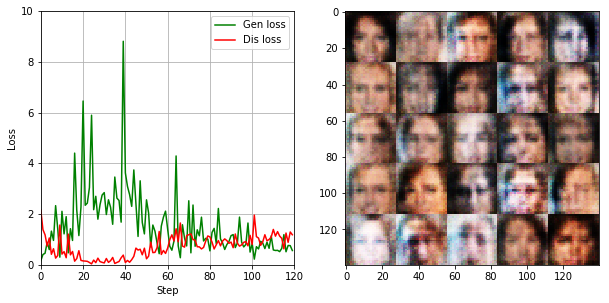

Epc: 1/1    Bat: 1210/12662    Dis Loss: 1.0035    Gen Loss: 0.7254    Time elaps: 00:01:36    Time remain: 00:15:11.
Epc: 1/1    Bat: 1220/12662    Dis Loss: 1.1628    Gen Loss: 0.5603    Time elaps: 00:01:37    Time remain: 00:15:10.
Epc: 1/1    Bat: 1230/12662    Dis Loss: 1.1064    Gen Loss: 1.2213    Time elaps: 00:01:37    Time remain: 00:15:09.
Epc: 1/1    Bat: 1240/12662    Dis Loss: 1.4104    Gen Loss: 0.3488    Time elaps: 00:01:38    Time remain: 00:15:08.
Epc: 1/1    Bat: 1250/12662    Dis Loss: 1.5432    Gen Loss: 0.3367    Time elaps: 00:01:39    Time remain: 00:15:06.
Epc: 1/1    Bat: 1260/12662    Dis Loss: 0.8446    Gen Loss: 0.8978    Time elaps: 00:01:40    Time remain: 00:15:05.
Epc: 1/1    Bat: 1270/12662    Dis Loss: 0.8462    Gen Loss: 0.9933    Time elaps: 00:01:40    Time remain: 00:15:04.
Epc: 1/1    Bat: 1280/12662    Dis Loss: 0.9752    Gen Loss: 1.0874    Time elaps: 00:01:41    Time remain: 00:15:03.
Epc: 1/1    Bat: 1290/12662    Dis Loss: 1.1663    Gen L

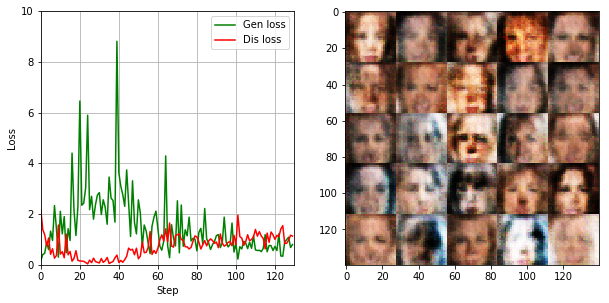

Epc: 1/1    Bat: 1310/12662    Dis Loss: 1.0049    Gen Loss: 0.8016    Time elaps: 00:01:44    Time remain: 00:15:03.
Epc: 1/1    Bat: 1320/12662    Dis Loss: 1.0249    Gen Loss: 0.6630    Time elaps: 00:01:44    Time remain: 00:15:01.
Epc: 1/1    Bat: 1330/12662    Dis Loss: 0.9722    Gen Loss: 0.7310    Time elaps: 00:01:45    Time remain: 00:15:00.
Epc: 1/1    Bat: 1340/12662    Dis Loss: 0.9462    Gen Loss: 1.0219    Time elaps: 00:01:46    Time remain: 00:14:59.
Epc: 1/1    Bat: 1350/12662    Dis Loss: 0.7660    Gen Loss: 0.9987    Time elaps: 00:01:47    Time remain: 00:14:58.
Epc: 1/1    Bat: 1360/12662    Dis Loss: 1.0855    Gen Loss: 0.5219    Time elaps: 00:01:47    Time remain: 00:14:57.
Epc: 1/1    Bat: 1370/12662    Dis Loss: 0.8651    Gen Loss: 0.7932    Time elaps: 00:01:48    Time remain: 00:14:55.
Epc: 1/1    Bat: 1380/12662    Dis Loss: 0.7756    Gen Loss: 1.2852    Time elaps: 00:01:49    Time remain: 00:14:54.
Epc: 1/1    Bat: 1390/12662    Dis Loss: 0.7828    Gen L

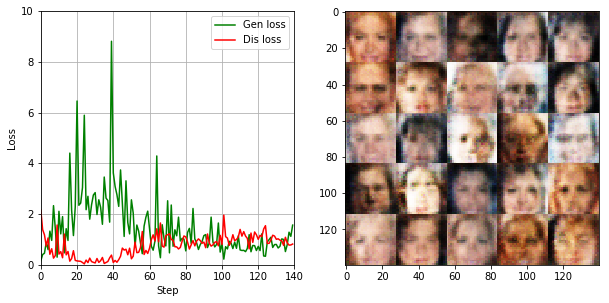

Epc: 1/1    Bat: 1410/12662    Dis Loss: 0.8248    Gen Loss: 1.0737    Time elaps: 00:01:52    Time remain: 00:14:54.
Epc: 1/1    Bat: 1420/12662    Dis Loss: 1.0735    Gen Loss: 0.8527    Time elaps: 00:01:52    Time remain: 00:14:53.
Epc: 1/1    Bat: 1430/12662    Dis Loss: 0.9812    Gen Loss: 1.2786    Time elaps: 00:01:53    Time remain: 00:14:51.
Epc: 1/1    Bat: 1440/12662    Dis Loss: 1.4870    Gen Loss: 1.1345    Time elaps: 00:01:54    Time remain: 00:14:50.
Epc: 1/1    Bat: 1450/12662    Dis Loss: 1.0255    Gen Loss: 0.7306    Time elaps: 00:01:55    Time remain: 00:14:49.
Epc: 1/1    Bat: 1460/12662    Dis Loss: 1.1941    Gen Loss: 0.6363    Time elaps: 00:01:55    Time remain: 00:14:48.
Epc: 1/1    Bat: 1470/12662    Dis Loss: 0.8943    Gen Loss: 1.2233    Time elaps: 00:01:56    Time remain: 00:14:47.
Epc: 1/1    Bat: 1480/12662    Dis Loss: 0.8787    Gen Loss: 1.1920    Time elaps: 00:01:57    Time remain: 00:14:46.
Epc: 1/1    Bat: 1490/12662    Dis Loss: 1.2606    Gen L

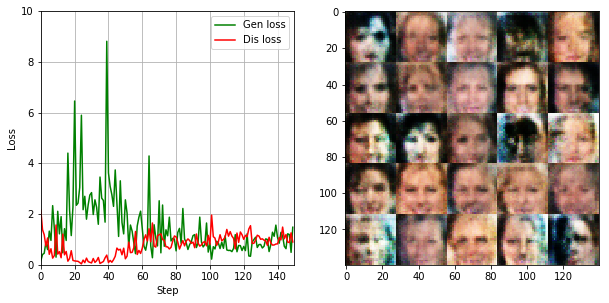

Epc: 1/1    Bat: 1510/12662    Dis Loss: 1.2515    Gen Loss: 0.4607    Time elaps: 00:02:00    Time remain: 00:14:46.
Epc: 1/1    Bat: 1520/12662    Dis Loss: 1.2422    Gen Loss: 0.7853    Time elaps: 00:02:00    Time remain: 00:14:45.
Epc: 1/1    Bat: 1530/12662    Dis Loss: 0.9658    Gen Loss: 0.8465    Time elaps: 00:02:01    Time remain: 00:14:44.
Epc: 1/1    Bat: 1540/12662    Dis Loss: 1.2687    Gen Loss: 0.4911    Time elaps: 00:02:02    Time remain: 00:14:43.
Epc: 1/1    Bat: 1550/12662    Dis Loss: 0.9050    Gen Loss: 1.0034    Time elaps: 00:02:03    Time remain: 00:14:42.
Epc: 1/1    Bat: 1560/12662    Dis Loss: 1.0736    Gen Loss: 1.0021    Time elaps: 00:02:03    Time remain: 00:14:42.
Epc: 1/1    Bat: 1570/12662    Dis Loss: 1.0983    Gen Loss: 0.6281    Time elaps: 00:02:04    Time remain: 00:14:40.
Epc: 1/1    Bat: 1580/12662    Dis Loss: 1.1010    Gen Loss: 0.6304    Time elaps: 00:02:05    Time remain: 00:14:39.
Epc: 1/1    Bat: 1590/12662    Dis Loss: 1.2001    Gen L

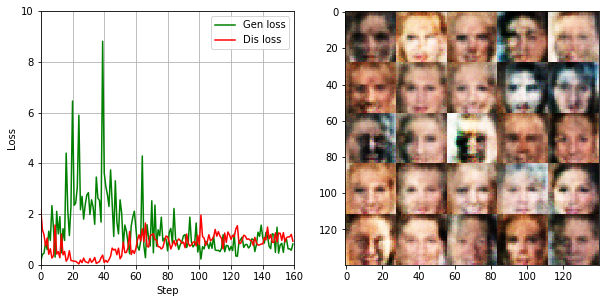

Epc: 1/1    Bat: 1610/12662    Dis Loss: 1.0149    Gen Loss: 1.5117    Time elaps: 00:02:08    Time remain: 00:14:39.
Epc: 1/1    Bat: 1620/12662    Dis Loss: 0.9494    Gen Loss: 0.8538    Time elaps: 00:02:08    Time remain: 00:14:38.
Epc: 1/1    Bat: 1630/12662    Dis Loss: 1.1450    Gen Loss: 0.6356    Time elaps: 00:02:09    Time remain: 00:14:36.
Epc: 1/1    Bat: 1640/12662    Dis Loss: 1.1097    Gen Loss: 0.5603    Time elaps: 00:02:10    Time remain: 00:14:35.
Epc: 1/1    Bat: 1650/12662    Dis Loss: 0.9830    Gen Loss: 0.7707    Time elaps: 00:02:11    Time remain: 00:14:34.
Epc: 1/1    Bat: 1660/12662    Dis Loss: 0.8866    Gen Loss: 0.8491    Time elaps: 00:02:11    Time remain: 00:14:33.
Epc: 1/1    Bat: 1670/12662    Dis Loss: 0.9972    Gen Loss: 0.8335    Time elaps: 00:02:12    Time remain: 00:14:32.
Epc: 1/1    Bat: 1680/12662    Dis Loss: 1.0838    Gen Loss: 0.7514    Time elaps: 00:02:13    Time remain: 00:14:31.
Epc: 1/1    Bat: 1690/12662    Dis Loss: 0.8277    Gen L

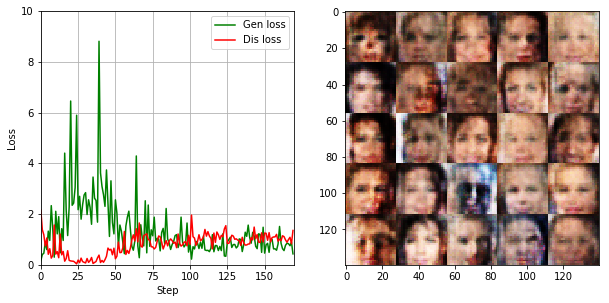

Epc: 1/1    Bat: 1710/12662    Dis Loss: 1.1747    Gen Loss: 0.5503    Time elaps: 00:02:15    Time remain: 00:14:30.
Epc: 1/1    Bat: 1720/12662    Dis Loss: 1.0113    Gen Loss: 0.8842    Time elaps: 00:02:16    Time remain: 00:14:29.
Epc: 1/1    Bat: 1730/12662    Dis Loss: 0.9178    Gen Loss: 1.0189    Time elaps: 00:02:17    Time remain: 00:14:28.
Epc: 1/1    Bat: 1740/12662    Dis Loss: 0.9458    Gen Loss: 1.0684    Time elaps: 00:02:18    Time remain: 00:14:27.
Epc: 1/1    Bat: 1750/12662    Dis Loss: 0.9839    Gen Loss: 1.0246    Time elaps: 00:02:19    Time remain: 00:14:27.
Epc: 1/1    Bat: 1760/12662    Dis Loss: 1.1644    Gen Loss: 0.5619    Time elaps: 00:02:19    Time remain: 00:14:26.
Epc: 1/1    Bat: 1770/12662    Dis Loss: 1.1100    Gen Loss: 0.5513    Time elaps: 00:02:20    Time remain: 00:14:25.
Epc: 1/1    Bat: 1780/12662    Dis Loss: 1.2422    Gen Loss: 0.4763    Time elaps: 00:02:21    Time remain: 00:14:24.
Epc: 1/1    Bat: 1790/12662    Dis Loss: 1.4965    Gen L

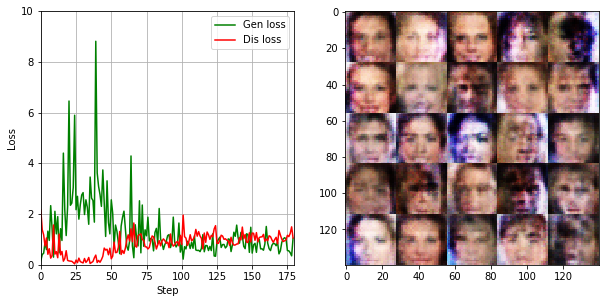

Epc: 1/1    Bat: 1810/12662    Dis Loss: 1.2733    Gen Loss: 1.0003    Time elaps: 00:02:24    Time remain: 00:14:24.
Epc: 1/1    Bat: 1820/12662    Dis Loss: 1.0186    Gen Loss: 1.3190    Time elaps: 00:02:24    Time remain: 00:14:22.
Epc: 1/1    Bat: 1830/12662    Dis Loss: 1.0081    Gen Loss: 0.7968    Time elaps: 00:02:25    Time remain: 00:14:21.
Epc: 1/1    Bat: 1840/12662    Dis Loss: 1.2597    Gen Loss: 0.6959    Time elaps: 00:02:26    Time remain: 00:14:20.
Epc: 1/1    Bat: 1850/12662    Dis Loss: 1.1703    Gen Loss: 0.8309    Time elaps: 00:02:27    Time remain: 00:14:19.
Epc: 1/1    Bat: 1860/12662    Dis Loss: 0.9979    Gen Loss: 1.0097    Time elaps: 00:02:27    Time remain: 00:14:18.
Epc: 1/1    Bat: 1870/12662    Dis Loss: 1.2286    Gen Loss: 0.7203    Time elaps: 00:02:28    Time remain: 00:14:17.
Epc: 1/1    Bat: 1880/12662    Dis Loss: 0.9470    Gen Loss: 0.7420    Time elaps: 00:02:29    Time remain: 00:14:16.
Epc: 1/1    Bat: 1890/12662    Dis Loss: 1.0462    Gen L

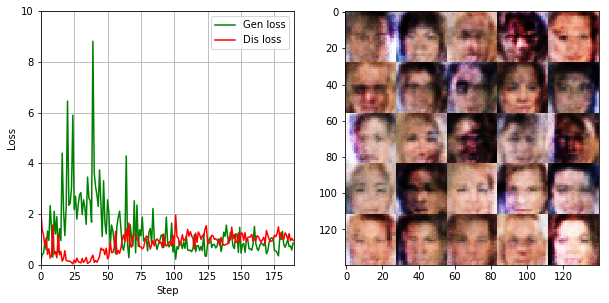

Epc: 1/1    Bat: 1910/12662    Dis Loss: 1.3690    Gen Loss: 0.4081    Time elaps: 00:02:32    Time remain: 00:14:16.
Epc: 1/1    Bat: 1920/12662    Dis Loss: 1.1979    Gen Loss: 0.5449    Time elaps: 00:02:32    Time remain: 00:14:15.
Epc: 1/1    Bat: 1930/12662    Dis Loss: 1.2143    Gen Loss: 0.7141    Time elaps: 00:02:33    Time remain: 00:14:13.
Epc: 1/1    Bat: 1940/12662    Dis Loss: 1.5404    Gen Loss: 0.3538    Time elaps: 00:02:34    Time remain: 00:14:12.
Epc: 1/1    Bat: 1950/12662    Dis Loss: 1.3371    Gen Loss: 0.4873    Time elaps: 00:02:35    Time remain: 00:14:12.
Epc: 1/1    Bat: 1960/12662    Dis Loss: 0.9856    Gen Loss: 1.0408    Time elaps: 00:02:35    Time remain: 00:14:10.
Epc: 1/1    Bat: 1970/12662    Dis Loss: 1.2667    Gen Loss: 0.5323    Time elaps: 00:02:36    Time remain: 00:14:09.
Epc: 1/1    Bat: 1980/12662    Dis Loss: 0.9886    Gen Loss: 0.7581    Time elaps: 00:02:37    Time remain: 00:14:08.
Epc: 1/1    Bat: 1990/12662    Dis Loss: 0.9577    Gen L

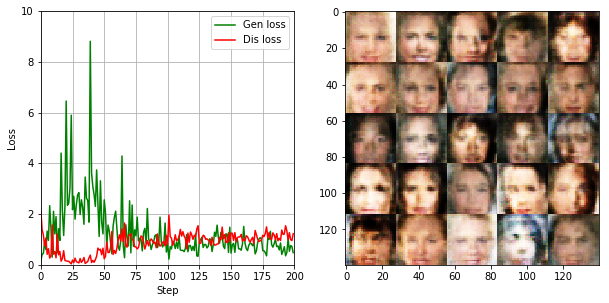

Epc: 1/1    Bat: 2010/12662    Dis Loss: 1.2457    Gen Loss: 0.5447    Time elaps: 00:02:39    Time remain: 00:14:07.
Epc: 1/1    Bat: 2020/12662    Dis Loss: 1.0958    Gen Loss: 0.6537    Time elaps: 00:02:40    Time remain: 00:14:06.
Epc: 1/1    Bat: 2030/12662    Dis Loss: 0.9809    Gen Loss: 0.8097    Time elaps: 00:02:41    Time remain: 00:14:05.
Epc: 1/1    Bat: 2040/12662    Dis Loss: 1.1811    Gen Loss: 0.6526    Time elaps: 00:02:42    Time remain: 00:14:04.
Epc: 1/1    Bat: 2050/12662    Dis Loss: 1.3154    Gen Loss: 0.7444    Time elaps: 00:02:42    Time remain: 00:14:03.
Epc: 1/1    Bat: 2060/12662    Dis Loss: 0.8945    Gen Loss: 1.0213    Time elaps: 00:02:43    Time remain: 00:14:02.
Epc: 1/1    Bat: 2070/12662    Dis Loss: 1.3143    Gen Loss: 0.4325    Time elaps: 00:02:44    Time remain: 00:14:01.
Epc: 1/1    Bat: 2080/12662    Dis Loss: 1.1721    Gen Loss: 0.7746    Time elaps: 00:02:45    Time remain: 00:14:00.
Epc: 1/1    Bat: 2090/12662    Dis Loss: 1.1290    Gen L

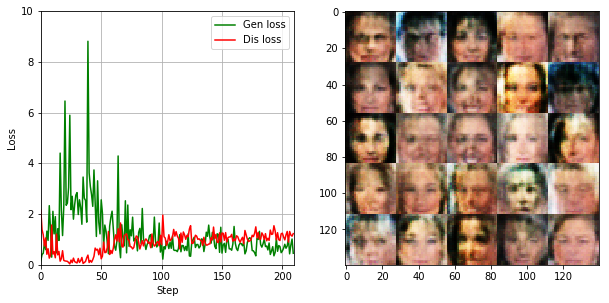

Epc: 1/1    Bat: 2110/12662    Dis Loss: 1.1719    Gen Loss: 0.6031    Time elaps: 00:02:47    Time remain: 00:13:59.
Epc: 1/1    Bat: 2120/12662    Dis Loss: 0.9058    Gen Loss: 0.9271    Time elaps: 00:02:48    Time remain: 00:13:59.
Epc: 1/1    Bat: 2130/12662    Dis Loss: 1.1028    Gen Loss: 0.7703    Time elaps: 00:02:49    Time remain: 00:13:57.
Epc: 1/1    Bat: 2140/12662    Dis Loss: 1.2929    Gen Loss: 0.4450    Time elaps: 00:02:50    Time remain: 00:13:56.
Epc: 1/1    Bat: 2150/12662    Dis Loss: 1.1889    Gen Loss: 0.9744    Time elaps: 00:02:50    Time remain: 00:13:55.
Epc: 1/1    Bat: 2160/12662    Dis Loss: 0.9853    Gen Loss: 0.9348    Time elaps: 00:02:51    Time remain: 00:13:54.
Epc: 1/1    Bat: 2170/12662    Dis Loss: 0.9959    Gen Loss: 1.2755    Time elaps: 00:02:52    Time remain: 00:13:53.
Epc: 1/1    Bat: 2180/12662    Dis Loss: 1.0956    Gen Loss: 0.6759    Time elaps: 00:02:53    Time remain: 00:13:52.
Epc: 1/1    Bat: 2190/12662    Dis Loss: 1.0043    Gen L

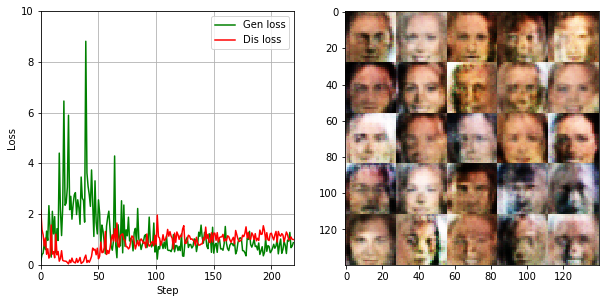

Epc: 1/1    Bat: 2210/12662    Dis Loss: 1.1889    Gen Loss: 0.6098    Time elaps: 00:02:55    Time remain: 00:13:51.
Epc: 1/1    Bat: 2220/12662    Dis Loss: 1.2720    Gen Loss: 1.2170    Time elaps: 00:02:56    Time remain: 00:13:50.
Epc: 1/1    Bat: 2230/12662    Dis Loss: 1.0303    Gen Loss: 0.6387    Time elaps: 00:02:57    Time remain: 00:13:49.
Epc: 1/1    Bat: 2240/12662    Dis Loss: 0.9817    Gen Loss: 0.7766    Time elaps: 00:02:58    Time remain: 00:13:48.
Epc: 1/1    Bat: 2250/12662    Dis Loss: 1.2069    Gen Loss: 0.7148    Time elaps: 00:02:58    Time remain: 00:13:47.
Epc: 1/1    Bat: 2260/12662    Dis Loss: 1.2863    Gen Loss: 0.5055    Time elaps: 00:02:59    Time remain: 00:13:46.
Epc: 1/1    Bat: 2270/12662    Dis Loss: 1.1266    Gen Loss: 0.5840    Time elaps: 00:03:00    Time remain: 00:13:45.
Epc: 1/1    Bat: 2280/12662    Dis Loss: 1.0589    Gen Loss: 1.0789    Time elaps: 00:03:01    Time remain: 00:13:44.
Epc: 1/1    Bat: 2290/12662    Dis Loss: 0.8666    Gen L

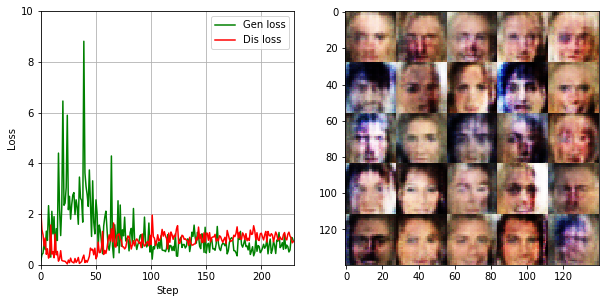

Epc: 1/1    Bat: 2310/12662    Dis Loss: 1.2804    Gen Loss: 0.5413    Time elaps: 00:03:03    Time remain: 00:13:43.
Epc: 1/1    Bat: 2320/12662    Dis Loss: 1.0181    Gen Loss: 0.7498    Time elaps: 00:03:04    Time remain: 00:13:42.
Epc: 1/1    Bat: 2330/12662    Dis Loss: 0.9318    Gen Loss: 0.8521    Time elaps: 00:03:05    Time remain: 00:13:41.
Epc: 1/1    Bat: 2340/12662    Dis Loss: 0.8978    Gen Loss: 0.9784    Time elaps: 00:03:05    Time remain: 00:13:40.
Epc: 1/1    Bat: 2350/12662    Dis Loss: 0.9884    Gen Loss: 0.9030    Time elaps: 00:03:06    Time remain: 00:13:39.
Epc: 1/1    Bat: 2360/12662    Dis Loss: 1.3782    Gen Loss: 0.4402    Time elaps: 00:03:07    Time remain: 00:13:38.
Epc: 1/1    Bat: 2370/12662    Dis Loss: 0.9175    Gen Loss: 0.9023    Time elaps: 00:03:08    Time remain: 00:13:37.
Epc: 1/1    Bat: 2380/12662    Dis Loss: 1.2153    Gen Loss: 0.7625    Time elaps: 00:03:09    Time remain: 00:13:36.
Epc: 1/1    Bat: 2390/12662    Dis Loss: 1.3076    Gen L

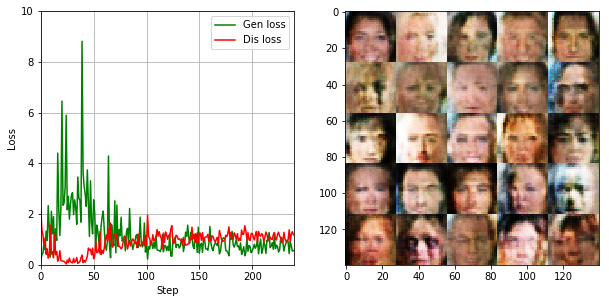

Epc: 1/1    Bat: 2410/12662    Dis Loss: 1.1811    Gen Loss: 1.0968    Time elaps: 00:03:11    Time remain: 00:13:35.
Epc: 1/1    Bat: 2420/12662    Dis Loss: 1.4204    Gen Loss: 0.3662    Time elaps: 00:03:12    Time remain: 00:13:34.
Epc: 1/1    Bat: 2430/12662    Dis Loss: 0.9034    Gen Loss: 0.9488    Time elaps: 00:03:13    Time remain: 00:13:33.
Epc: 1/1    Bat: 2440/12662    Dis Loss: 1.1087    Gen Loss: 0.7887    Time elaps: 00:03:13    Time remain: 00:13:32.
Epc: 1/1    Bat: 2450/12662    Dis Loss: 1.0533    Gen Loss: 0.7321    Time elaps: 00:03:14    Time remain: 00:13:31.
Epc: 1/1    Bat: 2460/12662    Dis Loss: 1.1608    Gen Loss: 0.9966    Time elaps: 00:03:15    Time remain: 00:13:30.
Epc: 1/1    Bat: 2470/12662    Dis Loss: 1.1055    Gen Loss: 0.7047    Time elaps: 00:03:16    Time remain: 00:13:29.
Epc: 1/1    Bat: 2480/12662    Dis Loss: 1.0300    Gen Loss: 0.6473    Time elaps: 00:03:16    Time remain: 00:13:28.
Epc: 1/1    Bat: 2490/12662    Dis Loss: 1.1414    Gen L

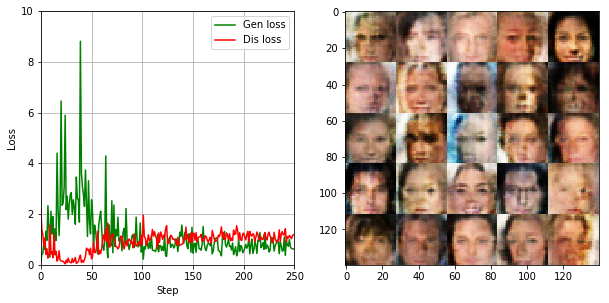

Epc: 1/1    Bat: 2510/12662    Dis Loss: 1.2064    Gen Loss: 0.5073    Time elaps: 00:03:19    Time remain: 00:13:27.
Epc: 1/1    Bat: 2520/12662    Dis Loss: 1.1530    Gen Loss: 0.5919    Time elaps: 00:03:20    Time remain: 00:13:26.
Epc: 1/1    Bat: 2530/12662    Dis Loss: 1.1822    Gen Loss: 0.6071    Time elaps: 00:03:21    Time remain: 00:13:25.
Epc: 1/1    Bat: 2540/12662    Dis Loss: 1.1868    Gen Loss: 0.6893    Time elaps: 00:03:21    Time remain: 00:13:24.
Epc: 1/1    Bat: 2550/12662    Dis Loss: 1.1943    Gen Loss: 0.4914    Time elaps: 00:03:22    Time remain: 00:13:23.
Epc: 1/1    Bat: 2560/12662    Dis Loss: 1.4435    Gen Loss: 0.5202    Time elaps: 00:03:23    Time remain: 00:13:22.
Epc: 1/1    Bat: 2570/12662    Dis Loss: 1.0674    Gen Loss: 0.6846    Time elaps: 00:03:24    Time remain: 00:13:21.
Epc: 1/1    Bat: 2580/12662    Dis Loss: 1.1740    Gen Loss: 0.8254    Time elaps: 00:03:24    Time remain: 00:13:20.
Epc: 1/1    Bat: 2590/12662    Dis Loss: 1.0323    Gen L

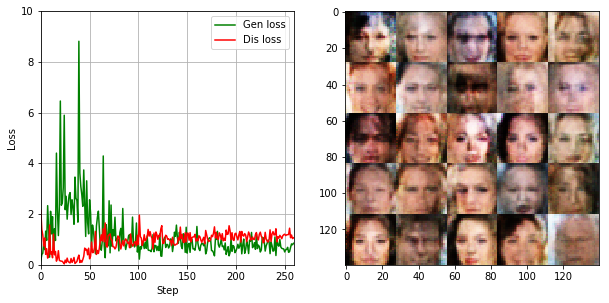

Epc: 1/1    Bat: 2610/12662    Dis Loss: 1.1650    Gen Loss: 0.9623    Time elaps: 00:03:27    Time remain: 00:13:19.
Epc: 1/1    Bat: 2620/12662    Dis Loss: 1.0980    Gen Loss: 0.5843    Time elaps: 00:03:28    Time remain: 00:13:18.
Epc: 1/1    Bat: 2630/12662    Dis Loss: 1.2068    Gen Loss: 0.7305    Time elaps: 00:03:28    Time remain: 00:13:17.
Epc: 1/1    Bat: 2640/12662    Dis Loss: 0.9334    Gen Loss: 0.8351    Time elaps: 00:03:29    Time remain: 00:13:16.
Epc: 1/1    Bat: 2650/12662    Dis Loss: 1.0211    Gen Loss: 0.9989    Time elaps: 00:03:30    Time remain: 00:13:15.
Epc: 1/1    Bat: 2660/12662    Dis Loss: 0.9162    Gen Loss: 0.9859    Time elaps: 00:03:31    Time remain: 00:13:14.
Epc: 1/1    Bat: 2670/12662    Dis Loss: 0.9203    Gen Loss: 0.8543    Time elaps: 00:03:31    Time remain: 00:13:13.
Epc: 1/1    Bat: 2680/12662    Dis Loss: 0.9190    Gen Loss: 0.9029    Time elaps: 00:03:32    Time remain: 00:13:12.
Epc: 1/1    Bat: 2690/12662    Dis Loss: 1.1407    Gen L

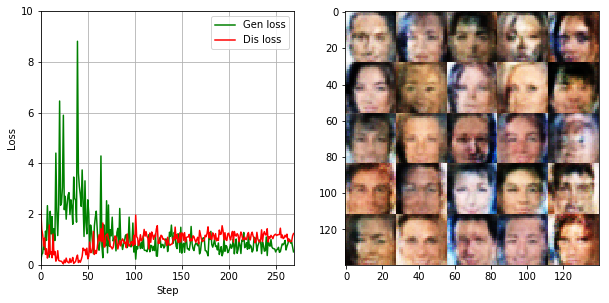

Epc: 1/1    Bat: 2710/12662    Dis Loss: 1.1058    Gen Loss: 0.7670    Time elaps: 00:03:35    Time remain: 00:13:10.
Epc: 1/1    Bat: 2720/12662    Dis Loss: 1.1857    Gen Loss: 0.5860    Time elaps: 00:03:36    Time remain: 00:13:09.
Epc: 1/1    Bat: 2730/12662    Dis Loss: 1.1099    Gen Loss: 0.9081    Time elaps: 00:03:36    Time remain: 00:13:08.
Epc: 1/1    Bat: 2740/12662    Dis Loss: 1.5432    Gen Loss: 0.4983    Time elaps: 00:03:37    Time remain: 00:13:07.
Epc: 1/1    Bat: 2750/12662    Dis Loss: 1.1726    Gen Loss: 0.5205    Time elaps: 00:03:38    Time remain: 00:13:06.
Epc: 1/1    Bat: 2760/12662    Dis Loss: 1.2475    Gen Loss: 0.5460    Time elaps: 00:03:39    Time remain: 00:13:05.
Epc: 1/1    Bat: 2770/12662    Dis Loss: 0.9619    Gen Loss: 0.8157    Time elaps: 00:03:39    Time remain: 00:13:05.
Epc: 1/1    Bat: 2780/12662    Dis Loss: 1.1621    Gen Loss: 0.5268    Time elaps: 00:03:40    Time remain: 00:13:04.
Epc: 1/1    Bat: 2790/12662    Dis Loss: 1.3253    Gen L

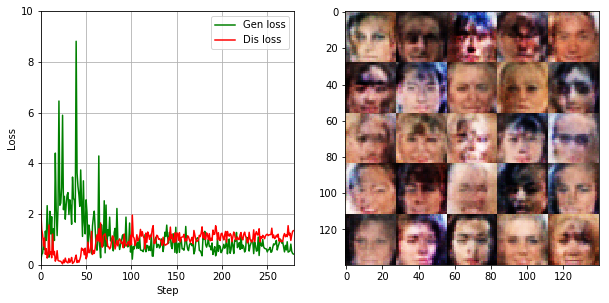

Epc: 1/1    Bat: 2810/12662    Dis Loss: 1.2134    Gen Loss: 0.5484    Time elaps: 00:03:43    Time remain: 00:13:03.
Epc: 1/1    Bat: 2820/12662    Dis Loss: 1.1445    Gen Loss: 0.6136    Time elaps: 00:03:44    Time remain: 00:13:02.
Epc: 1/1    Bat: 2830/12662    Dis Loss: 1.2581    Gen Loss: 0.4848    Time elaps: 00:03:44    Time remain: 00:13:01.
Epc: 1/1    Bat: 2840/12662    Dis Loss: 1.0357    Gen Loss: 0.8657    Time elaps: 00:03:45    Time remain: 00:13:00.
Epc: 1/1    Bat: 2850/12662    Dis Loss: 1.0298    Gen Loss: 0.6469    Time elaps: 00:03:46    Time remain: 00:12:59.
Epc: 1/1    Bat: 2860/12662    Dis Loss: 0.7881    Gen Loss: 1.0885    Time elaps: 00:03:47    Time remain: 00:12:58.
Epc: 1/1    Bat: 2870/12662    Dis Loss: 1.1564    Gen Loss: 0.7007    Time elaps: 00:03:47    Time remain: 00:12:57.
Epc: 1/1    Bat: 2880/12662    Dis Loss: 1.2607    Gen Loss: 0.6072    Time elaps: 00:03:48    Time remain: 00:12:56.
Epc: 1/1    Bat: 2890/12662    Dis Loss: 0.7758    Gen L

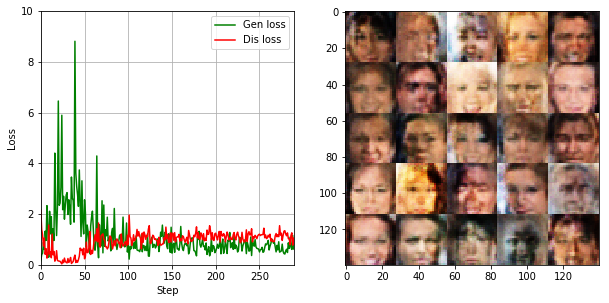

Epc: 1/1    Bat: 2910/12662    Dis Loss: 1.1631    Gen Loss: 0.6321    Time elaps: 00:03:51    Time remain: 00:12:55.
Epc: 1/1    Bat: 2920/12662    Dis Loss: 1.0617    Gen Loss: 0.8855    Time elaps: 00:03:52    Time remain: 00:12:54.
Epc: 1/1    Bat: 2930/12662    Dis Loss: 1.3418    Gen Loss: 0.4594    Time elaps: 00:03:52    Time remain: 00:12:53.
Epc: 1/1    Bat: 2940/12662    Dis Loss: 1.1357    Gen Loss: 0.7216    Time elaps: 00:03:53    Time remain: 00:12:52.
Epc: 1/1    Bat: 2950/12662    Dis Loss: 0.9783    Gen Loss: 0.8432    Time elaps: 00:03:54    Time remain: 00:12:51.
Epc: 1/1    Bat: 2960/12662    Dis Loss: 1.0512    Gen Loss: 0.8606    Time elaps: 00:03:55    Time remain: 00:12:50.
Epc: 1/1    Bat: 2970/12662    Dis Loss: 1.2858    Gen Loss: 0.5250    Time elaps: 00:03:55    Time remain: 00:12:49.
Epc: 1/1    Bat: 2980/12662    Dis Loss: 1.1494    Gen Loss: 0.5831    Time elaps: 00:03:56    Time remain: 00:12:48.
Epc: 1/1    Bat: 2990/12662    Dis Loss: 1.0131    Gen L

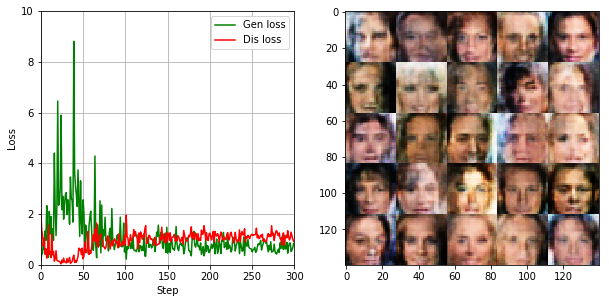

Epc: 1/1    Bat: 3010/12662    Dis Loss: 1.0545    Gen Loss: 0.6589    Time elaps: 00:03:59    Time remain: 00:12:47.
Epc: 1/1    Bat: 3020/12662    Dis Loss: 1.0942    Gen Loss: 0.7846    Time elaps: 00:04:00    Time remain: 00:12:46.
Epc: 1/1    Bat: 3030/12662    Dis Loss: 1.3689    Gen Loss: 0.5687    Time elaps: 00:04:00    Time remain: 00:12:45.
Epc: 1/1    Bat: 3040/12662    Dis Loss: 1.0535    Gen Loss: 0.7904    Time elaps: 00:04:01    Time remain: 00:12:44.
Epc: 1/1    Bat: 3050/12662    Dis Loss: 1.0973    Gen Loss: 0.7711    Time elaps: 00:04:02    Time remain: 00:12:43.
Epc: 1/1    Bat: 3060/12662    Dis Loss: 0.7618    Gen Loss: 1.1167    Time elaps: 00:04:03    Time remain: 00:12:42.
Epc: 1/1    Bat: 3070/12662    Dis Loss: 1.2113    Gen Loss: 0.5359    Time elaps: 00:04:03    Time remain: 00:12:41.
Epc: 1/1    Bat: 3080/12662    Dis Loss: 1.2540    Gen Loss: 0.4721    Time elaps: 00:04:04    Time remain: 00:12:40.
Epc: 1/1    Bat: 3090/12662    Dis Loss: 1.1770    Gen L

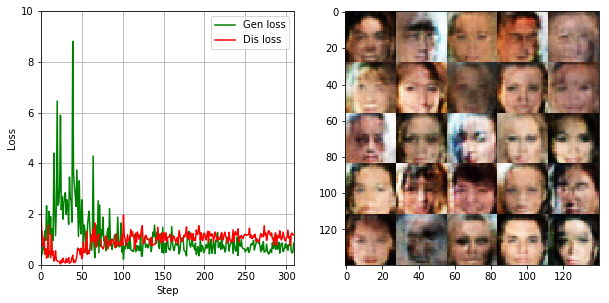

Epc: 1/1    Bat: 3110/12662    Dis Loss: 1.0511    Gen Loss: 0.6461    Time elaps: 00:04:07    Time remain: 00:12:39.
Epc: 1/1    Bat: 3120/12662    Dis Loss: 1.0332    Gen Loss: 0.6469    Time elaps: 00:04:07    Time remain: 00:12:38.
Epc: 1/1    Bat: 3130/12662    Dis Loss: 0.9822    Gen Loss: 0.7756    Time elaps: 00:04:08    Time remain: 00:12:37.
Epc: 1/1    Bat: 3140/12662    Dis Loss: 1.2430    Gen Loss: 0.6148    Time elaps: 00:04:09    Time remain: 00:12:36.
Epc: 1/1    Bat: 3150/12662    Dis Loss: 0.8640    Gen Loss: 0.8717    Time elaps: 00:04:10    Time remain: 00:12:35.
Epc: 1/1    Bat: 3160/12662    Dis Loss: 1.3040    Gen Loss: 0.4874    Time elaps: 00:04:10    Time remain: 00:12:34.
Epc: 1/1    Bat: 3170/12662    Dis Loss: 1.3920    Gen Loss: 0.4246    Time elaps: 00:04:11    Time remain: 00:12:33.
Epc: 1/1    Bat: 3180/12662    Dis Loss: 0.6561    Gen Loss: 1.2102    Time elaps: 00:04:12    Time remain: 00:12:32.
Epc: 1/1    Bat: 3190/12662    Dis Loss: 1.1052    Gen L

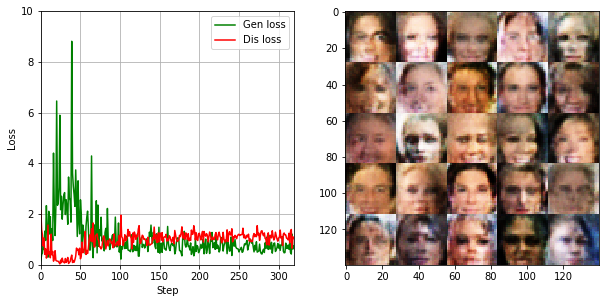

Epc: 1/1    Bat: 3210/12662    Dis Loss: 1.1251    Gen Loss: 0.7448    Time elaps: 00:04:14    Time remain: 00:12:30.
Epc: 1/1    Bat: 3220/12662    Dis Loss: 1.1258    Gen Loss: 0.5556    Time elaps: 00:04:15    Time remain: 00:12:29.
Epc: 1/1    Bat: 3230/12662    Dis Loss: 1.5321    Gen Loss: 0.3277    Time elaps: 00:04:16    Time remain: 00:12:28.
Epc: 1/1    Bat: 3240/12662    Dis Loss: 1.2289    Gen Loss: 0.4575    Time elaps: 00:04:17    Time remain: 00:12:28.
Epc: 1/1    Bat: 3250/12662    Dis Loss: 1.0664    Gen Loss: 0.8722    Time elaps: 00:04:17    Time remain: 00:12:27.
Epc: 1/1    Bat: 3260/12662    Dis Loss: 0.9694    Gen Loss: 0.9721    Time elaps: 00:04:18    Time remain: 00:12:26.
Epc: 1/1    Bat: 3270/12662    Dis Loss: 0.9643    Gen Loss: 1.0479    Time elaps: 00:04:19    Time remain: 00:12:25.
Epc: 1/1    Bat: 3280/12662    Dis Loss: 1.1371    Gen Loss: 0.5840    Time elaps: 00:04:20    Time remain: 00:12:24.
Epc: 1/1    Bat: 3290/12662    Dis Loss: 0.8358    Gen L

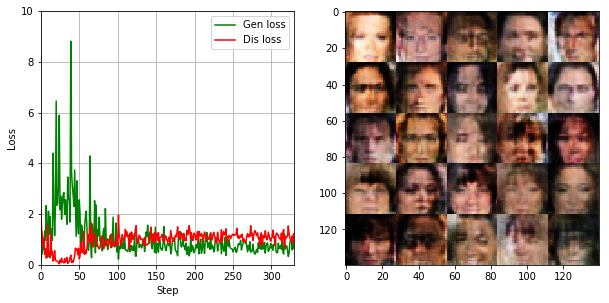

Epc: 1/1    Bat: 3310/12662    Dis Loss: 1.0006    Gen Loss: 0.9630    Time elaps: 00:04:22    Time remain: 00:12:22.
Epc: 1/1    Bat: 3320/12662    Dis Loss: 0.8780    Gen Loss: 1.0521    Time elaps: 00:04:23    Time remain: 00:12:21.
Epc: 1/1    Bat: 3330/12662    Dis Loss: 1.1547    Gen Loss: 0.8038    Time elaps: 00:04:24    Time remain: 00:12:20.
Epc: 1/1    Bat: 3340/12662    Dis Loss: 0.9588    Gen Loss: 1.1784    Time elaps: 00:04:25    Time remain: 00:12:19.
Epc: 1/1    Bat: 3350/12662    Dis Loss: 1.1755    Gen Loss: 0.5551    Time elaps: 00:04:25    Time remain: 00:12:18.
Epc: 1/1    Bat: 3360/12662    Dis Loss: 1.3036    Gen Loss: 0.4507    Time elaps: 00:04:26    Time remain: 00:12:17.
Epc: 1/1    Bat: 3370/12662    Dis Loss: 1.4718    Gen Loss: 0.4105    Time elaps: 00:04:27    Time remain: 00:12:17.
Epc: 1/1    Bat: 3380/12662    Dis Loss: 0.9703    Gen Loss: 0.8241    Time elaps: 00:04:28    Time remain: 00:12:16.
Epc: 1/1    Bat: 3390/12662    Dis Loss: 1.2754    Gen L

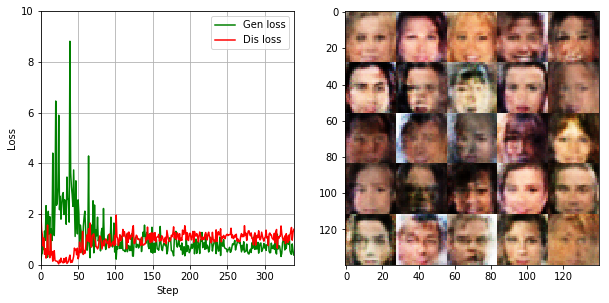

Epc: 1/1    Bat: 3410/12662    Dis Loss: 1.3239    Gen Loss: 0.4067    Time elaps: 00:04:30    Time remain: 00:12:14.
Epc: 1/1    Bat: 3420/12662    Dis Loss: 1.1005    Gen Loss: 0.6987    Time elaps: 00:04:31    Time remain: 00:12:13.
Epc: 1/1    Bat: 3430/12662    Dis Loss: 1.3299    Gen Loss: 0.5758    Time elaps: 00:04:32    Time remain: 00:12:12.
Epc: 1/1    Bat: 3440/12662    Dis Loss: 1.2648    Gen Loss: 0.6230    Time elaps: 00:04:32    Time remain: 00:12:11.
Epc: 1/1    Bat: 3450/12662    Dis Loss: 0.9989    Gen Loss: 0.7920    Time elaps: 00:04:33    Time remain: 00:12:10.
Epc: 1/1    Bat: 3460/12662    Dis Loss: 1.1487    Gen Loss: 0.5699    Time elaps: 00:04:34    Time remain: 00:12:09.
Epc: 1/1    Bat: 3470/12662    Dis Loss: 1.0355    Gen Loss: 0.6558    Time elaps: 00:04:35    Time remain: 00:12:08.
Epc: 1/1    Bat: 3480/12662    Dis Loss: 1.1209    Gen Loss: 0.6505    Time elaps: 00:04:35    Time remain: 00:12:07.
Epc: 1/1    Bat: 3490/12662    Dis Loss: 1.2083    Gen L

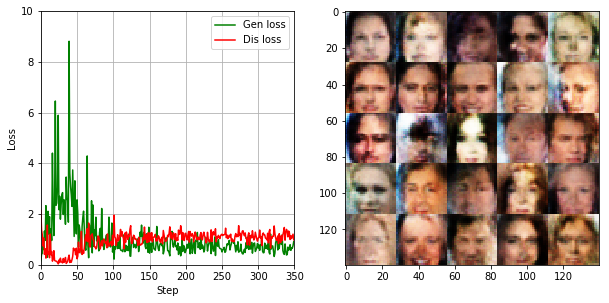

Epc: 1/1    Bat: 3510/12662    Dis Loss: 1.3302    Gen Loss: 0.5626    Time elaps: 00:04:38    Time remain: 00:12:06.
Epc: 1/1    Bat: 3520/12662    Dis Loss: 1.0223    Gen Loss: 0.6692    Time elaps: 00:04:39    Time remain: 00:12:05.
Epc: 1/1    Bat: 3530/12662    Dis Loss: 1.3060    Gen Loss: 0.4748    Time elaps: 00:04:40    Time remain: 00:12:04.
Epc: 1/1    Bat: 3540/12662    Dis Loss: 1.0389    Gen Loss: 0.8094    Time elaps: 00:04:40    Time remain: 00:12:03.
Epc: 1/1    Bat: 3550/12662    Dis Loss: 1.1174    Gen Loss: 0.5876    Time elaps: 00:04:41    Time remain: 00:12:02.
Epc: 1/1    Bat: 3560/12662    Dis Loss: 0.7532    Gen Loss: 1.0137    Time elaps: 00:04:42    Time remain: 00:12:01.
Epc: 1/1    Bat: 3570/12662    Dis Loss: 1.6972    Gen Loss: 0.3969    Time elaps: 00:04:42    Time remain: 00:12:00.
Epc: 1/1    Bat: 3580/12662    Dis Loss: 1.3452    Gen Loss: 0.4592    Time elaps: 00:04:43    Time remain: 00:11:59.
Epc: 1/1    Bat: 3590/12662    Dis Loss: 1.1555    Gen L

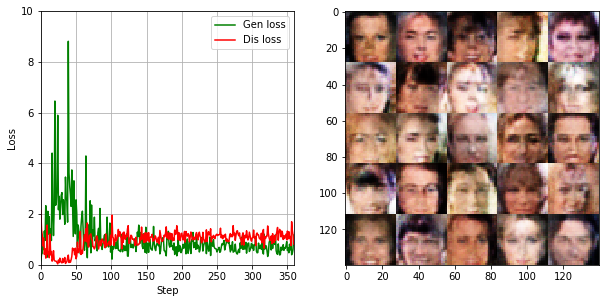

Epc: 1/1    Bat: 3610/12662    Dis Loss: 1.4210    Gen Loss: 0.3733    Time elaps: 00:04:46    Time remain: 00:11:58.
Epc: 1/1    Bat: 3620/12662    Dis Loss: 1.4953    Gen Loss: 0.3558    Time elaps: 00:04:47    Time remain: 00:11:57.
Epc: 1/1    Bat: 3630/12662    Dis Loss: 1.1023    Gen Loss: 0.9923    Time elaps: 00:04:48    Time remain: 00:11:56.
Epc: 1/1    Bat: 3640/12662    Dis Loss: 1.1809    Gen Loss: 0.7024    Time elaps: 00:04:48    Time remain: 00:11:55.
Epc: 1/1    Bat: 3650/12662    Dis Loss: 0.9280    Gen Loss: 1.1190    Time elaps: 00:04:49    Time remain: 00:11:54.
Epc: 1/1    Bat: 3660/12662    Dis Loss: 1.0068    Gen Loss: 0.6277    Time elaps: 00:04:50    Time remain: 00:11:53.
Epc: 1/1    Bat: 3670/12662    Dis Loss: 0.9018    Gen Loss: 0.8581    Time elaps: 00:04:51    Time remain: 00:11:53.
Epc: 1/1    Bat: 3680/12662    Dis Loss: 1.0341    Gen Loss: 0.8174    Time elaps: 00:04:51    Time remain: 00:11:52.
Epc: 1/1    Bat: 3690/12662    Dis Loss: 1.1633    Gen L

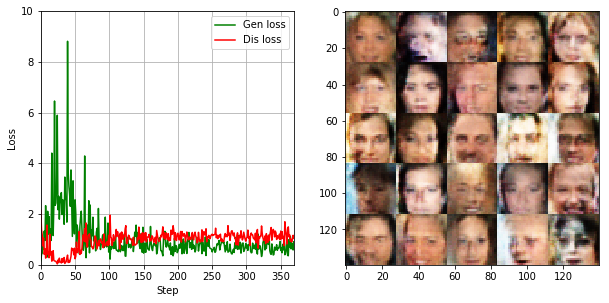

Epc: 1/1    Bat: 3710/12662    Dis Loss: 0.9321    Gen Loss: 0.8144    Time elaps: 00:04:54    Time remain: 00:11:50.
Epc: 1/1    Bat: 3720/12662    Dis Loss: 1.0047    Gen Loss: 0.9048    Time elaps: 00:04:55    Time remain: 00:11:49.
Epc: 1/1    Bat: 3730/12662    Dis Loss: 1.5918    Gen Loss: 0.3197    Time elaps: 00:04:55    Time remain: 00:11:48.
Epc: 1/1    Bat: 3740/12662    Dis Loss: 0.9494    Gen Loss: 0.8307    Time elaps: 00:04:56    Time remain: 00:11:47.
Epc: 1/1    Bat: 3750/12662    Dis Loss: 1.1081    Gen Loss: 0.5857    Time elaps: 00:04:57    Time remain: 00:11:46.
Epc: 1/1    Bat: 3760/12662    Dis Loss: 1.0560    Gen Loss: 0.6800    Time elaps: 00:04:58    Time remain: 00:11:45.
Epc: 1/1    Bat: 3770/12662    Dis Loss: 1.2299    Gen Loss: 0.5170    Time elaps: 00:04:58    Time remain: 00:11:44.
Epc: 1/1    Bat: 3780/12662    Dis Loss: 1.1184    Gen Loss: 0.5484    Time elaps: 00:04:59    Time remain: 00:11:44.
Epc: 1/1    Bat: 3790/12662    Dis Loss: 1.2529    Gen L

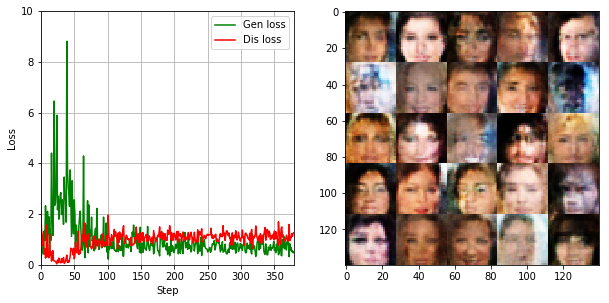

Epc: 1/1    Bat: 3810/12662    Dis Loss: 1.2636    Gen Loss: 0.5252    Time elaps: 00:05:02    Time remain: 00:11:42.
Epc: 1/1    Bat: 3820/12662    Dis Loss: 1.0696    Gen Loss: 0.6875    Time elaps: 00:05:03    Time remain: 00:11:41.
Epc: 1/1    Bat: 3830/12662    Dis Loss: 1.1452    Gen Loss: 0.7361    Time elaps: 00:05:03    Time remain: 00:11:40.
Epc: 1/1    Bat: 3840/12662    Dis Loss: 1.3443    Gen Loss: 0.4475    Time elaps: 00:05:04    Time remain: 00:11:39.
Epc: 1/1    Bat: 3850/12662    Dis Loss: 1.4249    Gen Loss: 0.4129    Time elaps: 00:05:05    Time remain: 00:11:38.
Epc: 1/1    Bat: 3860/12662    Dis Loss: 1.1022    Gen Loss: 0.6574    Time elaps: 00:05:05    Time remain: 00:11:37.
Epc: 1/1    Bat: 3870/12662    Dis Loss: 0.8695    Gen Loss: 0.8055    Time elaps: 00:05:06    Time remain: 00:11:36.
Epc: 1/1    Bat: 3880/12662    Dis Loss: 1.1471    Gen Loss: 0.5470    Time elaps: 00:05:07    Time remain: 00:11:35.
Epc: 1/1    Bat: 3890/12662    Dis Loss: 1.3379    Gen L

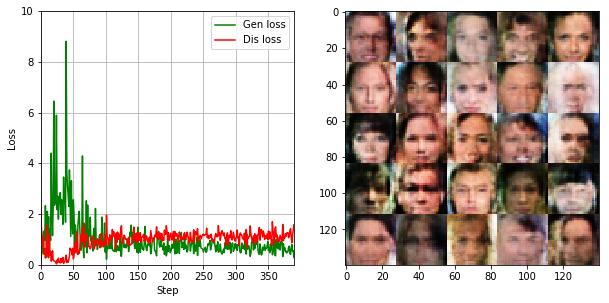

Epc: 1/1    Bat: 3910/12662    Dis Loss: 1.3880    Gen Loss: 0.3693    Time elaps: 00:05:10    Time remain: 00:11:34.
Epc: 1/1    Bat: 3920/12662    Dis Loss: 0.9725    Gen Loss: 0.8181    Time elaps: 00:05:10    Time remain: 00:11:33.
Epc: 1/1    Bat: 3930/12662    Dis Loss: 1.9214    Gen Loss: 0.3017    Time elaps: 00:05:11    Time remain: 00:11:32.
Epc: 1/1    Bat: 3940/12662    Dis Loss: 1.0261    Gen Loss: 0.7761    Time elaps: 00:05:12    Time remain: 00:11:31.
Epc: 1/1    Bat: 3950/12662    Dis Loss: 1.1798    Gen Loss: 0.5380    Time elaps: 00:05:13    Time remain: 00:11:30.
Epc: 1/1    Bat: 3960/12662    Dis Loss: 1.1025    Gen Loss: 0.6000    Time elaps: 00:05:13    Time remain: 00:11:29.
Epc: 1/1    Bat: 3970/12662    Dis Loss: 1.2260    Gen Loss: 0.4338    Time elaps: 00:05:14    Time remain: 00:11:28.
Epc: 1/1    Bat: 3980/12662    Dis Loss: 1.1444    Gen Loss: 0.8867    Time elaps: 00:05:15    Time remain: 00:11:27.
Epc: 1/1    Bat: 3990/12662    Dis Loss: 0.7702    Gen L

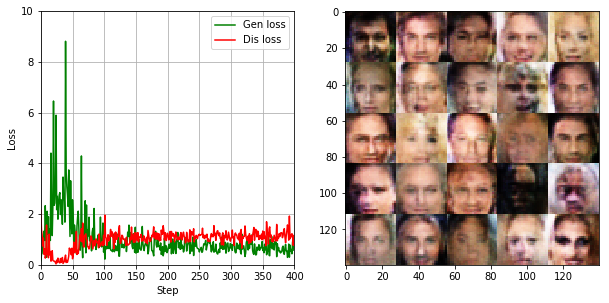

Epc: 1/1    Bat: 4010/12662    Dis Loss: 0.7522    Gen Loss: 1.0642    Time elaps: 00:05:17    Time remain: 00:11:26.
Epc: 1/1    Bat: 4020/12662    Dis Loss: 1.0299    Gen Loss: 0.8032    Time elaps: 00:05:18    Time remain: 00:11:25.
Epc: 1/1    Bat: 4030/12662    Dis Loss: 0.8854    Gen Loss: 0.8291    Time elaps: 00:05:19    Time remain: 00:11:24.
Epc: 1/1    Bat: 4040/12662    Dis Loss: 1.3292    Gen Loss: 0.7521    Time elaps: 00:05:20    Time remain: 00:11:23.
Epc: 1/1    Bat: 4050/12662    Dis Loss: 0.9385    Gen Loss: 0.8044    Time elaps: 00:05:20    Time remain: 00:11:22.
Epc: 1/1    Bat: 4060/12662    Dis Loss: 1.6471    Gen Loss: 0.3984    Time elaps: 00:05:21    Time remain: 00:11:21.
Epc: 1/1    Bat: 4070/12662    Dis Loss: 1.1608    Gen Loss: 0.5631    Time elaps: 00:05:22    Time remain: 00:11:20.
Epc: 1/1    Bat: 4080/12662    Dis Loss: 0.8523    Gen Loss: 0.9499    Time elaps: 00:05:23    Time remain: 00:11:19.
Epc: 1/1    Bat: 4090/12662    Dis Loss: 1.0741    Gen L

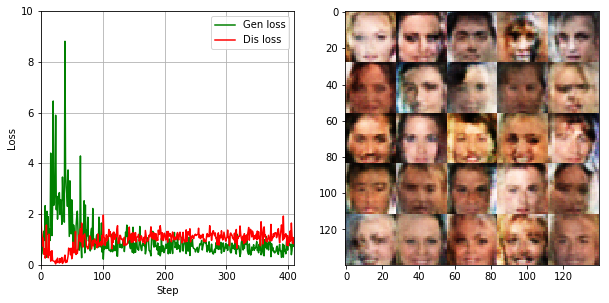

Epc: 1/1    Bat: 4110/12662    Dis Loss: 1.0069    Gen Loss: 0.7722    Time elaps: 00:05:25    Time remain: 00:11:18.
Epc: 1/1    Bat: 4120/12662    Dis Loss: 1.3102    Gen Loss: 0.5750    Time elaps: 00:05:26    Time remain: 00:11:17.
Epc: 1/1    Bat: 4130/12662    Dis Loss: 1.0595    Gen Loss: 0.7805    Time elaps: 00:05:27    Time remain: 00:11:16.
Epc: 1/1    Bat: 4140/12662    Dis Loss: 1.0345    Gen Loss: 0.6562    Time elaps: 00:05:28    Time remain: 00:11:15.
Epc: 1/1    Bat: 4150/12662    Dis Loss: 1.0204    Gen Loss: 0.6783    Time elaps: 00:05:28    Time remain: 00:11:14.
Epc: 1/1    Bat: 4160/12662    Dis Loss: 1.3574    Gen Loss: 0.5404    Time elaps: 00:05:29    Time remain: 00:11:13.
Epc: 1/1    Bat: 4170/12662    Dis Loss: 1.0005    Gen Loss: 0.6226    Time elaps: 00:05:30    Time remain: 00:11:12.
Epc: 1/1    Bat: 4180/12662    Dis Loss: 1.3601    Gen Loss: 0.5410    Time elaps: 00:05:31    Time remain: 00:11:11.
Epc: 1/1    Bat: 4190/12662    Dis Loss: 1.0908    Gen L

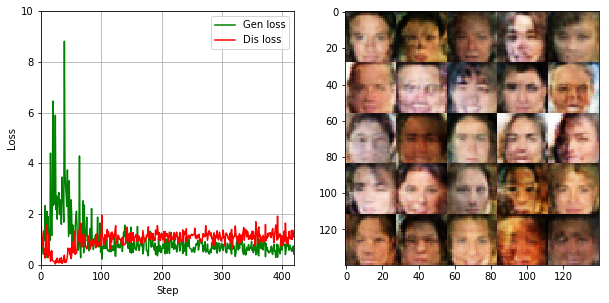

Epc: 1/1    Bat: 4210/12662    Dis Loss: 1.2078    Gen Loss: 0.5418    Time elaps: 00:05:33    Time remain: 00:11:09.
Epc: 1/1    Bat: 4220/12662    Dis Loss: 1.1913    Gen Loss: 0.5963    Time elaps: 00:05:34    Time remain: 00:11:09.
Epc: 1/1    Bat: 4230/12662    Dis Loss: 1.1857    Gen Loss: 0.5026    Time elaps: 00:05:35    Time remain: 00:11:08.
Epc: 1/1    Bat: 4240/12662    Dis Loss: 1.0061    Gen Loss: 0.7160    Time elaps: 00:05:35    Time remain: 00:11:07.
Epc: 1/1    Bat: 4250/12662    Dis Loss: 0.9299    Gen Loss: 0.9492    Time elaps: 00:05:36    Time remain: 00:11:06.
Epc: 1/1    Bat: 4260/12662    Dis Loss: 1.4803    Gen Loss: 0.4541    Time elaps: 00:05:37    Time remain: 00:11:05.
Epc: 1/1    Bat: 4270/12662    Dis Loss: 1.2349    Gen Loss: 0.6998    Time elaps: 00:05:38    Time remain: 00:11:04.
Epc: 1/1    Bat: 4280/12662    Dis Loss: 1.1081    Gen Loss: 0.5874    Time elaps: 00:05:38    Time remain: 00:11:03.
Epc: 1/1    Bat: 4290/12662    Dis Loss: 1.3846    Gen L

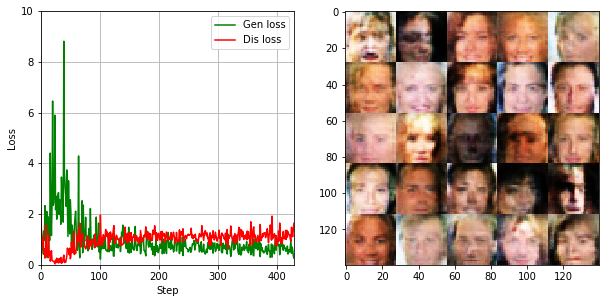

Epc: 1/1    Bat: 4310/12662    Dis Loss: 1.2245    Gen Loss: 0.5756    Time elaps: 00:05:41    Time remain: 00:11:01.
Epc: 1/1    Bat: 4320/12662    Dis Loss: 1.3033    Gen Loss: 0.5128    Time elaps: 00:05:42    Time remain: 00:11:00.
Epc: 1/1    Bat: 4330/12662    Dis Loss: 1.0000    Gen Loss: 1.1463    Time elaps: 00:05:43    Time remain: 00:11:00.
Epc: 1/1    Bat: 4340/12662    Dis Loss: 1.0536    Gen Loss: 1.0450    Time elaps: 00:05:43    Time remain: 00:10:59.
Epc: 1/1    Bat: 4350/12662    Dis Loss: 1.0205    Gen Loss: 0.7562    Time elaps: 00:05:44    Time remain: 00:10:58.
Epc: 1/1    Bat: 4360/12662    Dis Loss: 1.1944    Gen Loss: 0.4624    Time elaps: 00:05:45    Time remain: 00:10:57.
Epc: 1/1    Bat: 4370/12662    Dis Loss: 0.4831    Gen Loss: 1.2321    Time elaps: 00:05:46    Time remain: 00:10:56.
Epc: 1/1    Bat: 4380/12662    Dis Loss: 1.2271    Gen Loss: 0.5144    Time elaps: 00:05:46    Time remain: 00:10:55.
Epc: 1/1    Bat: 4390/12662    Dis Loss: 1.0914    Gen L

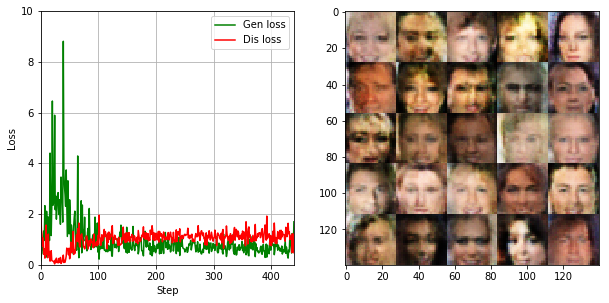

Epc: 1/1    Bat: 4410/12662    Dis Loss: 1.2669    Gen Loss: 0.4738    Time elaps: 00:05:49    Time remain: 00:10:54.
Epc: 1/1    Bat: 4420/12662    Dis Loss: 1.0917    Gen Loss: 0.5854    Time elaps: 00:05:50    Time remain: 00:10:53.
Epc: 1/1    Bat: 4430/12662    Dis Loss: 1.0531    Gen Loss: 0.6340    Time elaps: 00:05:51    Time remain: 00:10:52.
Epc: 1/1    Bat: 4440/12662    Dis Loss: 1.0499    Gen Loss: 0.6386    Time elaps: 00:05:51    Time remain: 00:10:51.
Epc: 1/1    Bat: 4450/12662    Dis Loss: 1.2303    Gen Loss: 0.4990    Time elaps: 00:05:52    Time remain: 00:10:50.
Epc: 1/1    Bat: 4460/12662    Dis Loss: 1.4498    Gen Loss: 0.3424    Time elaps: 00:05:53    Time remain: 00:10:50.
Epc: 1/1    Bat: 4470/12662    Dis Loss: 0.8514    Gen Loss: 0.9472    Time elaps: 00:05:54    Time remain: 00:10:49.
Epc: 1/1    Bat: 4480/12662    Dis Loss: 1.3036    Gen Loss: 0.4082    Time elaps: 00:05:54    Time remain: 00:10:48.
Epc: 1/1    Bat: 4490/12662    Dis Loss: 1.3356    Gen L

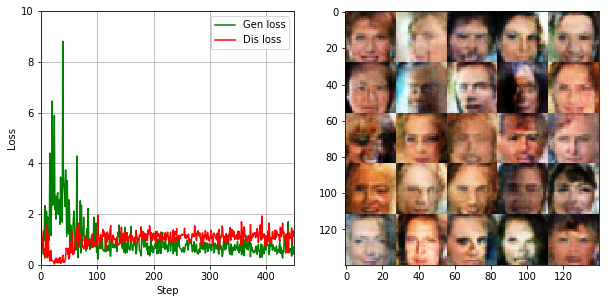

Epc: 1/1    Bat: 4510/12662    Dis Loss: 0.8675    Gen Loss: 0.8850    Time elaps: 00:05:57    Time remain: 00:10:46.
Epc: 1/1    Bat: 4520/12662    Dis Loss: 1.0675    Gen Loss: 0.5759    Time elaps: 00:05:58    Time remain: 00:10:45.
Epc: 1/1    Bat: 4530/12662    Dis Loss: 1.2191    Gen Loss: 0.4582    Time elaps: 00:05:59    Time remain: 00:10:44.
Epc: 1/1    Bat: 4540/12662    Dis Loss: 1.9267    Gen Loss: 0.2485    Time elaps: 00:05:59    Time remain: 00:10:43.
Epc: 1/1    Bat: 4550/12662    Dis Loss: 0.9445    Gen Loss: 0.6966    Time elaps: 00:06:00    Time remain: 00:10:42.
Epc: 1/1    Bat: 4560/12662    Dis Loss: 0.9251    Gen Loss: 0.7685    Time elaps: 00:06:01    Time remain: 00:10:42.
Epc: 1/1    Bat: 4570/12662    Dis Loss: 1.0109    Gen Loss: 0.6908    Time elaps: 00:06:02    Time remain: 00:10:41.
Epc: 1/1    Bat: 4580/12662    Dis Loss: 1.3751    Gen Loss: 0.5019    Time elaps: 00:06:02    Time remain: 00:10:40.
Epc: 1/1    Bat: 4590/12662    Dis Loss: 1.3245    Gen L

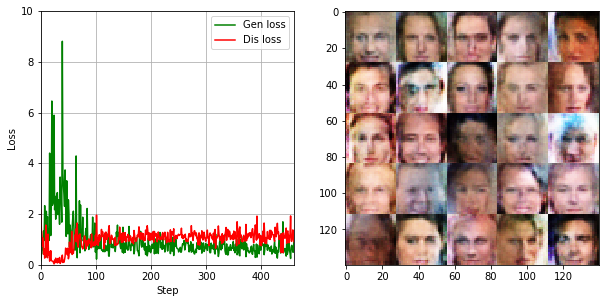

Epc: 1/1    Bat: 4610/12662    Dis Loss: 1.0445    Gen Loss: 0.8172    Time elaps: 00:06:05    Time remain: 00:10:38.
Epc: 1/1    Bat: 4620/12662    Dis Loss: 0.8887    Gen Loss: 0.7709    Time elaps: 00:06:06    Time remain: 00:10:37.
Epc: 1/1    Bat: 4630/12662    Dis Loss: 1.0565    Gen Loss: 0.5532    Time elaps: 00:06:06    Time remain: 00:10:36.
Epc: 1/1    Bat: 4640/12662    Dis Loss: 1.2875    Gen Loss: 0.6022    Time elaps: 00:06:07    Time remain: 00:10:35.
Epc: 1/1    Bat: 4650/12662    Dis Loss: 1.4231    Gen Loss: 0.3837    Time elaps: 00:06:08    Time remain: 00:10:34.
Epc: 1/1    Bat: 4660/12662    Dis Loss: 0.7070    Gen Loss: 1.0333    Time elaps: 00:06:09    Time remain: 00:10:34.
Epc: 1/1    Bat: 4670/12662    Dis Loss: 1.1441    Gen Loss: 0.8415    Time elaps: 00:06:09    Time remain: 00:10:33.
Epc: 1/1    Bat: 4680/12662    Dis Loss: 1.1287    Gen Loss: 0.6489    Time elaps: 00:06:10    Time remain: 00:10:32.
Epc: 1/1    Bat: 4690/12662    Dis Loss: 1.2643    Gen L

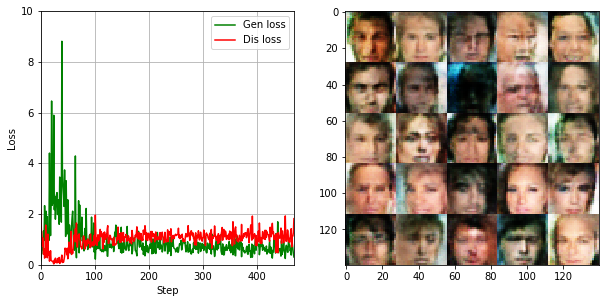

Epc: 1/1    Bat: 4710/12662    Dis Loss: 0.8983    Gen Loss: 1.1249    Time elaps: 00:06:13    Time remain: 00:10:30.
Epc: 1/1    Bat: 4720/12662    Dis Loss: 1.1758    Gen Loss: 1.0326    Time elaps: 00:06:14    Time remain: 00:10:29.
Epc: 1/1    Bat: 4730/12662    Dis Loss: 1.1692    Gen Loss: 0.5770    Time elaps: 00:06:14    Time remain: 00:10:28.
Epc: 1/1    Bat: 4740/12662    Dis Loss: 0.9020    Gen Loss: 0.8948    Time elaps: 00:06:15    Time remain: 00:10:27.
Epc: 1/1    Bat: 4750/12662    Dis Loss: 1.1961    Gen Loss: 0.5194    Time elaps: 00:06:16    Time remain: 00:10:26.
Epc: 1/1    Bat: 4760/12662    Dis Loss: 0.8539    Gen Loss: 0.9646    Time elaps: 00:06:17    Time remain: 00:10:26.
Epc: 1/1    Bat: 4770/12662    Dis Loss: 1.1503    Gen Loss: 1.1894    Time elaps: 00:06:17    Time remain: 00:10:25.
Epc: 1/1    Bat: 4780/12662    Dis Loss: 1.0470    Gen Loss: 0.7272    Time elaps: 00:06:18    Time remain: 00:10:24.
Epc: 1/1    Bat: 4790/12662    Dis Loss: 0.8529    Gen L

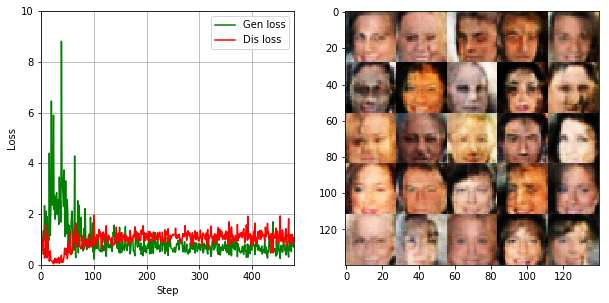

Epc: 1/1    Bat: 4810/12662    Dis Loss: 1.1977    Gen Loss: 0.6924    Time elaps: 00:06:21    Time remain: 00:10:22.
Epc: 1/1    Bat: 4820/12662    Dis Loss: 1.4741    Gen Loss: 0.5659    Time elaps: 00:06:22    Time remain: 00:10:21.
Epc: 1/1    Bat: 4830/12662    Dis Loss: 1.2302    Gen Loss: 0.5539    Time elaps: 00:06:22    Time remain: 00:10:20.
Epc: 1/1    Bat: 4840/12662    Dis Loss: 0.9823    Gen Loss: 0.7075    Time elaps: 00:06:23    Time remain: 00:10:19.
Epc: 1/1    Bat: 4850/12662    Dis Loss: 1.1987    Gen Loss: 0.5790    Time elaps: 00:06:24    Time remain: 00:10:18.
Epc: 1/1    Bat: 4860/12662    Dis Loss: 1.4384    Gen Loss: 0.3710    Time elaps: 00:06:25    Time remain: 00:10:18.
Epc: 1/1    Bat: 4870/12662    Dis Loss: 1.2331    Gen Loss: 0.4807    Time elaps: 00:06:25    Time remain: 00:10:17.
Epc: 1/1    Bat: 4880/12662    Dis Loss: 0.8555    Gen Loss: 0.8591    Time elaps: 00:06:26    Time remain: 00:10:16.
Epc: 1/1    Bat: 4890/12662    Dis Loss: 1.4560    Gen L

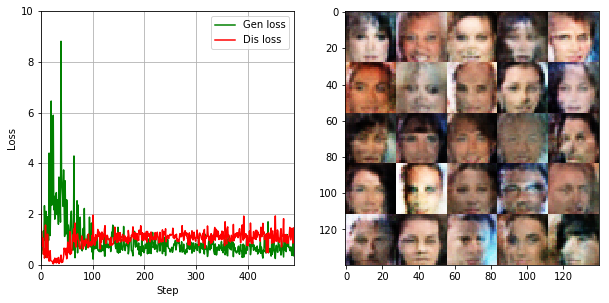

Epc: 1/1    Bat: 4910/12662    Dis Loss: 1.1473    Gen Loss: 0.7580    Time elaps: 00:06:29    Time remain: 00:10:14.
Epc: 1/1    Bat: 4920/12662    Dis Loss: 1.4627    Gen Loss: 0.3441    Time elaps: 00:06:29    Time remain: 00:10:13.
Epc: 1/1    Bat: 4930/12662    Dis Loss: 1.0856    Gen Loss: 0.7231    Time elaps: 00:06:30    Time remain: 00:10:12.
Epc: 1/1    Bat: 4940/12662    Dis Loss: 1.2750    Gen Loss: 0.7379    Time elaps: 00:06:31    Time remain: 00:10:11.
Epc: 1/1    Bat: 4950/12662    Dis Loss: 1.5725    Gen Loss: 0.3424    Time elaps: 00:06:32    Time remain: 00:10:10.
Epc: 1/1    Bat: 4960/12662    Dis Loss: 1.0291    Gen Loss: 0.9167    Time elaps: 00:06:32    Time remain: 00:10:10.
Epc: 1/1    Bat: 4970/12662    Dis Loss: 1.0859    Gen Loss: 0.6092    Time elaps: 00:06:33    Time remain: 00:10:09.
Epc: 1/1    Bat: 4980/12662    Dis Loss: 0.7057    Gen Loss: 0.9394    Time elaps: 00:06:34    Time remain: 00:10:08.
Epc: 1/1    Bat: 4990/12662    Dis Loss: 1.1063    Gen L

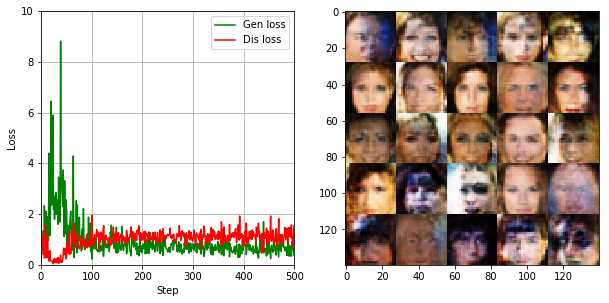

Epc: 1/1    Bat: 5010/12662    Dis Loss: 1.3844    Gen Loss: 0.6978    Time elaps: 00:06:37    Time remain: 00:10:06.
Epc: 1/1    Bat: 5020/12662    Dis Loss: 0.9092    Gen Loss: 0.8167    Time elaps: 00:06:37    Time remain: 00:10:05.
Epc: 1/1    Bat: 5030/12662    Dis Loss: 1.2533    Gen Loss: 0.5571    Time elaps: 00:06:38    Time remain: 00:10:04.
Epc: 1/1    Bat: 5040/12662    Dis Loss: 1.2840    Gen Loss: 0.4995    Time elaps: 00:06:39    Time remain: 00:10:03.
Epc: 1/1    Bat: 5050/12662    Dis Loss: 1.1510    Gen Loss: 0.6789    Time elaps: 00:06:40    Time remain: 00:10:02.
Epc: 1/1    Bat: 5060/12662    Dis Loss: 0.9250    Gen Loss: 0.6780    Time elaps: 00:06:40    Time remain: 00:10:02.
Epc: 1/1    Bat: 5070/12662    Dis Loss: 1.0130    Gen Loss: 0.7901    Time elaps: 00:06:41    Time remain: 00:10:01.
Epc: 1/1    Bat: 5080/12662    Dis Loss: 0.9369    Gen Loss: 0.7849    Time elaps: 00:06:42    Time remain: 00:10:00.
Epc: 1/1    Bat: 5090/12662    Dis Loss: 1.7548    Gen L

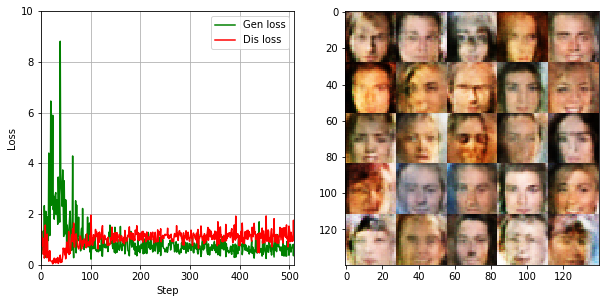

Epc: 1/1    Bat: 5110/12662    Dis Loss: 0.9215    Gen Loss: 0.8501    Time elaps: 00:06:44    Time remain: 00:09:58.
Epc: 1/1    Bat: 5120/12662    Dis Loss: 0.9221    Gen Loss: 0.8140    Time elaps: 00:06:45    Time remain: 00:09:57.
Epc: 1/1    Bat: 5130/12662    Dis Loss: 1.1299    Gen Loss: 0.7282    Time elaps: 00:06:46    Time remain: 00:09:56.
Epc: 1/1    Bat: 5140/12662    Dis Loss: 1.2075    Gen Loss: 0.4740    Time elaps: 00:06:47    Time remain: 00:09:55.
Epc: 1/1    Bat: 5150/12662    Dis Loss: 1.1141    Gen Loss: 0.7898    Time elaps: 00:06:47    Time remain: 00:09:55.
Epc: 1/1    Bat: 5160/12662    Dis Loss: 0.8882    Gen Loss: 0.9477    Time elaps: 00:06:48    Time remain: 00:09:54.
Epc: 1/1    Bat: 5170/12662    Dis Loss: 0.8342    Gen Loss: 0.9418    Time elaps: 00:06:49    Time remain: 00:09:53.
Epc: 1/1    Bat: 5180/12662    Dis Loss: 1.0865    Gen Loss: 0.7209    Time elaps: 00:06:50    Time remain: 00:09:52.
Epc: 1/1    Bat: 5190/12662    Dis Loss: 1.0286    Gen L

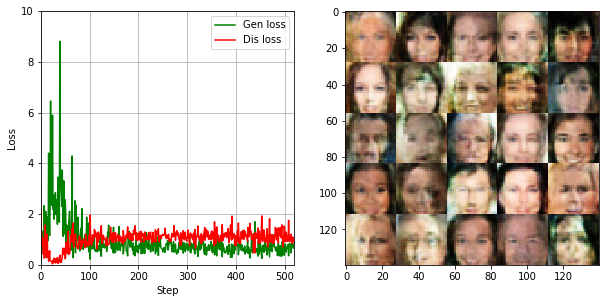

Epc: 1/1    Bat: 5210/12662    Dis Loss: 0.9590    Gen Loss: 0.6982    Time elaps: 00:06:52    Time remain: 00:09:50.
Epc: 1/1    Bat: 5220/12662    Dis Loss: 0.9401    Gen Loss: 0.8876    Time elaps: 00:06:53    Time remain: 00:09:49.
Epc: 1/1    Bat: 5230/12662    Dis Loss: 1.3115    Gen Loss: 0.4573    Time elaps: 00:06:54    Time remain: 00:09:48.
Epc: 1/1    Bat: 5240/12662    Dis Loss: 1.2582    Gen Loss: 0.6283    Time elaps: 00:06:55    Time remain: 00:09:47.
Epc: 1/1    Bat: 5250/12662    Dis Loss: 1.3367    Gen Loss: 0.4321    Time elaps: 00:06:55    Time remain: 00:09:47.
Epc: 1/1    Bat: 5260/12662    Dis Loss: 1.5106    Gen Loss: 0.3253    Time elaps: 00:06:56    Time remain: 00:09:46.
Epc: 1/1    Bat: 5270/12662    Dis Loss: 1.2471    Gen Loss: 0.5003    Time elaps: 00:06:57    Time remain: 00:09:45.
Epc: 1/1    Bat: 5280/12662    Dis Loss: 1.1008    Gen Loss: 0.6707    Time elaps: 00:06:58    Time remain: 00:09:44.
Epc: 1/1    Bat: 5290/12662    Dis Loss: 1.2287    Gen L

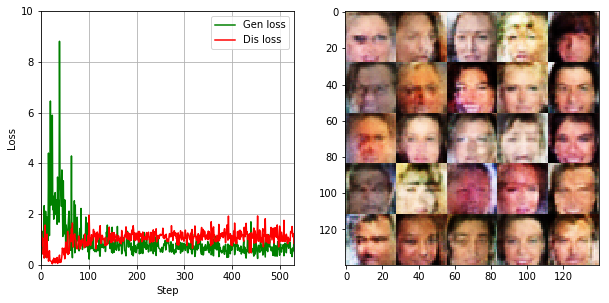

Epc: 1/1    Bat: 5310/12662    Dis Loss: 1.5206    Gen Loss: 0.3531    Time elaps: 00:07:00    Time remain: 00:09:42.
Epc: 1/1    Bat: 5320/12662    Dis Loss: 0.7500    Gen Loss: 1.0869    Time elaps: 00:07:01    Time remain: 00:09:41.
Epc: 1/1    Bat: 5330/12662    Dis Loss: 1.4510    Gen Loss: 0.3465    Time elaps: 00:07:02    Time remain: 00:09:41.
Epc: 1/1    Bat: 5340/12662    Dis Loss: 1.5452    Gen Loss: 0.3641    Time elaps: 00:07:03    Time remain: 00:09:40.
Epc: 1/1    Bat: 5350/12662    Dis Loss: 0.5831    Gen Loss: 1.3675    Time elaps: 00:07:03    Time remain: 00:09:39.
Epc: 1/1    Bat: 5360/12662    Dis Loss: 1.0230    Gen Loss: 0.6502    Time elaps: 00:07:04    Time remain: 00:09:38.
Epc: 1/1    Bat: 5370/12662    Dis Loss: 1.3187    Gen Loss: 0.5126    Time elaps: 00:07:05    Time remain: 00:09:37.
Epc: 1/1    Bat: 5380/12662    Dis Loss: 1.3507    Gen Loss: 0.4359    Time elaps: 00:07:06    Time remain: 00:09:36.
Epc: 1/1    Bat: 5390/12662    Dis Loss: 1.2748    Gen L

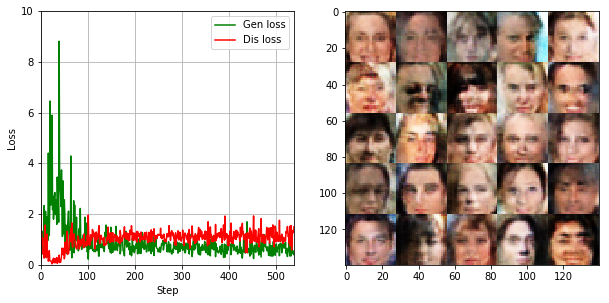

Epc: 1/1    Bat: 5410/12662    Dis Loss: 1.3027    Gen Loss: 0.4678    Time elaps: 00:07:08    Time remain: 00:09:34.
Epc: 1/1    Bat: 5420/12662    Dis Loss: 1.4325    Gen Loss: 0.3874    Time elaps: 00:07:09    Time remain: 00:09:34.
Epc: 1/1    Bat: 5430/12662    Dis Loss: 0.7543    Gen Loss: 0.8838    Time elaps: 00:07:10    Time remain: 00:09:33.
Epc: 1/1    Bat: 5440/12662    Dis Loss: 1.3064    Gen Loss: 0.5208    Time elaps: 00:07:11    Time remain: 00:09:32.
Epc: 1/1    Bat: 5450/12662    Dis Loss: 0.9582    Gen Loss: 0.9709    Time elaps: 00:07:11    Time remain: 00:09:31.
Epc: 1/1    Bat: 5460/12662    Dis Loss: 1.1764    Gen Loss: 0.6938    Time elaps: 00:07:12    Time remain: 00:09:30.
Epc: 1/1    Bat: 5470/12662    Dis Loss: 1.1176    Gen Loss: 0.6480    Time elaps: 00:07:13    Time remain: 00:09:29.
Epc: 1/1    Bat: 5480/12662    Dis Loss: 1.0798    Gen Loss: 0.6919    Time elaps: 00:07:14    Time remain: 00:09:28.
Epc: 1/1    Bat: 5490/12662    Dis Loss: 1.3844    Gen L

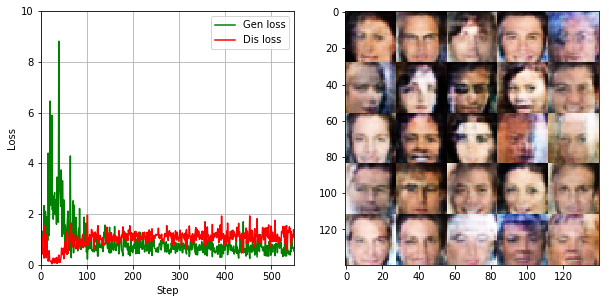

Epc: 1/1    Bat: 5510/12662    Dis Loss: 1.1231    Gen Loss: 0.6062    Time elaps: 00:07:16    Time remain: 00:09:26.
Epc: 1/1    Bat: 5520/12662    Dis Loss: 1.0870    Gen Loss: 0.9080    Time elaps: 00:07:17    Time remain: 00:09:26.
Epc: 1/1    Bat: 5530/12662    Dis Loss: 1.0157    Gen Loss: 0.6328    Time elaps: 00:07:18    Time remain: 00:09:25.
Epc: 1/1    Bat: 5540/12662    Dis Loss: 1.4065    Gen Loss: 0.3878    Time elaps: 00:07:19    Time remain: 00:09:24.
Epc: 1/1    Bat: 5550/12662    Dis Loss: 1.4093    Gen Loss: 0.5290    Time elaps: 00:07:19    Time remain: 00:09:23.
Epc: 1/1    Bat: 5560/12662    Dis Loss: 1.2368    Gen Loss: 0.4361    Time elaps: 00:07:20    Time remain: 00:09:22.
Epc: 1/1    Bat: 5570/12662    Dis Loss: 1.1001    Gen Loss: 0.7038    Time elaps: 00:07:21    Time remain: 00:09:21.
Epc: 1/1    Bat: 5580/12662    Dis Loss: 1.0574    Gen Loss: 0.7271    Time elaps: 00:07:22    Time remain: 00:09:21.
Epc: 1/1    Bat: 5590/12662    Dis Loss: 0.9486    Gen L

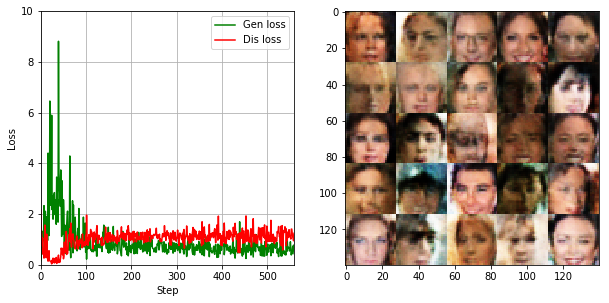

Epc: 1/1    Bat: 5610/12662    Dis Loss: 1.0451    Gen Loss: 0.5189    Time elaps: 00:07:24    Time remain: 00:09:19.
Epc: 1/1    Bat: 5620/12662    Dis Loss: 1.5974    Gen Loss: 0.4733    Time elaps: 00:07:25    Time remain: 00:09:18.
Epc: 1/1    Bat: 5630/12662    Dis Loss: 0.7336    Gen Loss: 1.0452    Time elaps: 00:07:26    Time remain: 00:09:17.
Epc: 1/1    Bat: 5640/12662    Dis Loss: 1.0833    Gen Loss: 0.5983    Time elaps: 00:07:27    Time remain: 00:09:16.
Epc: 1/1    Bat: 5650/12662    Dis Loss: 1.0281    Gen Loss: 0.7526    Time elaps: 00:07:28    Time remain: 00:09:16.
Epc: 1/1    Bat: 5660/12662    Dis Loss: 1.1390    Gen Loss: 0.6233    Time elaps: 00:07:28    Time remain: 00:09:15.
Epc: 1/1    Bat: 5670/12662    Dis Loss: 1.1143    Gen Loss: 0.8301    Time elaps: 00:07:29    Time remain: 00:09:14.
Epc: 1/1    Bat: 5680/12662    Dis Loss: 1.1076    Gen Loss: 0.6853    Time elaps: 00:07:30    Time remain: 00:09:13.
Epc: 1/1    Bat: 5690/12662    Dis Loss: 1.3675    Gen L

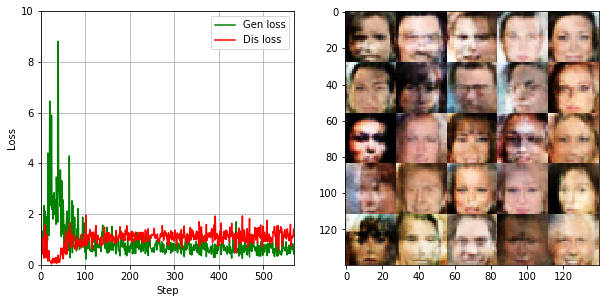

Epc: 1/1    Bat: 5710/12662    Dis Loss: 1.3423    Gen Loss: 0.4783    Time elaps: 00:07:33    Time remain: 00:09:11.
Epc: 1/1    Bat: 5720/12662    Dis Loss: 1.4981    Gen Loss: 0.3518    Time elaps: 00:07:33    Time remain: 00:09:10.
Epc: 1/1    Bat: 5730/12662    Dis Loss: 1.1583    Gen Loss: 0.6795    Time elaps: 00:07:34    Time remain: 00:09:09.
Epc: 1/1    Bat: 5740/12662    Dis Loss: 1.0775    Gen Loss: 0.7833    Time elaps: 00:07:35    Time remain: 00:09:09.
Epc: 1/1    Bat: 5750/12662    Dis Loss: 1.3250    Gen Loss: 0.5374    Time elaps: 00:07:36    Time remain: 00:09:08.
Epc: 1/1    Bat: 5760/12662    Dis Loss: 1.5938    Gen Loss: 0.2944    Time elaps: 00:07:36    Time remain: 00:09:07.
Epc: 1/1    Bat: 5770/12662    Dis Loss: 0.9899    Gen Loss: 0.7295    Time elaps: 00:07:37    Time remain: 00:09:06.
Epc: 1/1    Bat: 5780/12662    Dis Loss: 1.0219    Gen Loss: 0.6926    Time elaps: 00:07:38    Time remain: 00:09:05.
Epc: 1/1    Bat: 5790/12662    Dis Loss: 0.8958    Gen L

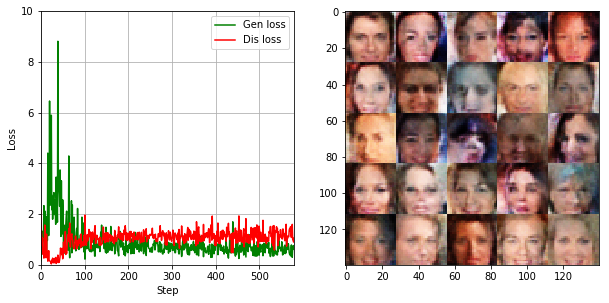

Epc: 1/1    Bat: 5810/12662    Dis Loss: 1.0969    Gen Loss: 0.5689    Time elaps: 00:07:41    Time remain: 00:09:03.
Epc: 1/1    Bat: 5820/12662    Dis Loss: 0.9408    Gen Loss: 0.8285    Time elaps: 00:07:41    Time remain: 00:09:02.
Epc: 1/1    Bat: 5830/12662    Dis Loss: 1.0011    Gen Loss: 0.6896    Time elaps: 00:07:42    Time remain: 00:09:02.
Epc: 1/1    Bat: 5840/12662    Dis Loss: 1.2354    Gen Loss: 0.4953    Time elaps: 00:07:43    Time remain: 00:09:01.
Epc: 1/1    Bat: 5850/12662    Dis Loss: 1.5270    Gen Loss: 0.3593    Time elaps: 00:07:44    Time remain: 00:09:00.
Epc: 1/1    Bat: 5860/12662    Dis Loss: 0.9323    Gen Loss: 0.9606    Time elaps: 00:07:44    Time remain: 00:08:59.
Epc: 1/1    Bat: 5870/12662    Dis Loss: 1.1066    Gen Loss: 0.5250    Time elaps: 00:07:45    Time remain: 00:08:58.
Epc: 1/1    Bat: 5880/12662    Dis Loss: 1.2095    Gen Loss: 0.5353    Time elaps: 00:07:46    Time remain: 00:08:57.
Epc: 1/1    Bat: 5890/12662    Dis Loss: 1.2242    Gen L

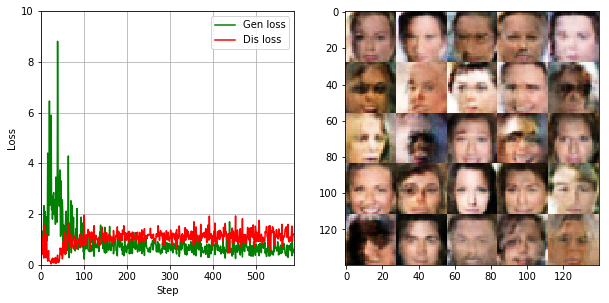

Epc: 1/1    Bat: 5910/12662    Dis Loss: 1.3793    Gen Loss: 0.4276    Time elaps: 00:07:49    Time remain: 00:08:56.
Epc: 1/1    Bat: 5920/12662    Dis Loss: 0.7155    Gen Loss: 1.1821    Time elaps: 00:07:49    Time remain: 00:08:55.
Epc: 1/1    Bat: 5930/12662    Dis Loss: 1.0258    Gen Loss: 0.7587    Time elaps: 00:07:50    Time remain: 00:08:54.
Epc: 1/1    Bat: 5940/12662    Dis Loss: 0.8671    Gen Loss: 0.8043    Time elaps: 00:07:51    Time remain: 00:08:53.
Epc: 1/1    Bat: 5950/12662    Dis Loss: 1.2778    Gen Loss: 0.4518    Time elaps: 00:07:52    Time remain: 00:08:52.
Epc: 1/1    Bat: 5960/12662    Dis Loss: 1.3846    Gen Loss: 0.5119    Time elaps: 00:07:53    Time remain: 00:08:52.
Epc: 1/1    Bat: 5970/12662    Dis Loss: 0.9221    Gen Loss: 0.8594    Time elaps: 00:07:54    Time remain: 00:08:51.
Epc: 1/1    Bat: 5980/12662    Dis Loss: 1.2113    Gen Loss: 0.5332    Time elaps: 00:07:54    Time remain: 00:08:50.
Epc: 1/1    Bat: 5990/12662    Dis Loss: 1.3111    Gen L

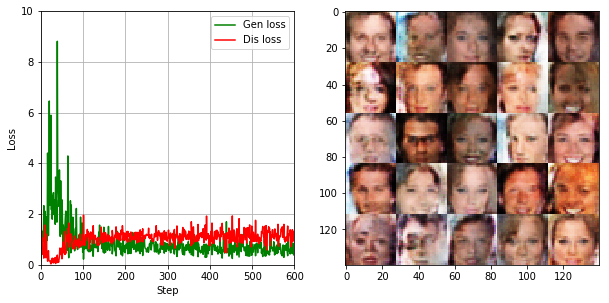

Epc: 1/1    Bat: 6010/12662    Dis Loss: 0.7480    Gen Loss: 1.0796    Time elaps: 00:07:57    Time remain: 00:08:48.
Epc: 1/1    Bat: 6020/12662    Dis Loss: 1.2172    Gen Loss: 0.5439    Time elaps: 00:07:58    Time remain: 00:08:48.
Epc: 1/1    Bat: 6030/12662    Dis Loss: 1.4161    Gen Loss: 0.4165    Time elaps: 00:07:59    Time remain: 00:08:47.
Epc: 1/1    Bat: 6040/12662    Dis Loss: 1.8547    Gen Loss: 0.2697    Time elaps: 00:08:00    Time remain: 00:08:46.
Epc: 1/1    Bat: 6050/12662    Dis Loss: 1.2122    Gen Loss: 1.0571    Time elaps: 00:08:01    Time remain: 00:08:45.
Epc: 1/1    Bat: 6060/12662    Dis Loss: 0.8524    Gen Loss: 0.8121    Time elaps: 00:08:01    Time remain: 00:08:44.
Epc: 1/1    Bat: 6070/12662    Dis Loss: 1.3752    Gen Loss: 0.5121    Time elaps: 00:08:02    Time remain: 00:08:44.
Epc: 1/1    Bat: 6080/12662    Dis Loss: 0.7588    Gen Loss: 0.9789    Time elaps: 00:08:03    Time remain: 00:08:43.
Epc: 1/1    Bat: 6090/12662    Dis Loss: 1.2069    Gen L

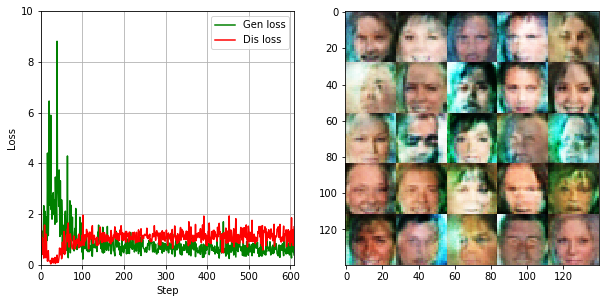

Epc: 1/1    Bat: 6110/12662    Dis Loss: 1.3449    Gen Loss: 0.4350    Time elaps: 00:08:06    Time remain: 00:08:41.
Epc: 1/1    Bat: 6120/12662    Dis Loss: 1.2233    Gen Loss: 0.5510    Time elaps: 00:08:07    Time remain: 00:08:40.
Epc: 1/1    Bat: 6130/12662    Dis Loss: 0.9821    Gen Loss: 1.0543    Time elaps: 00:08:07    Time remain: 00:08:40.
Epc: 1/1    Bat: 6140/12662    Dis Loss: 1.2546    Gen Loss: 0.4742    Time elaps: 00:08:08    Time remain: 00:08:39.
Epc: 1/1    Bat: 6150/12662    Dis Loss: 0.9287    Gen Loss: 1.2494    Time elaps: 00:08:09    Time remain: 00:08:38.
Epc: 1/1    Bat: 6160/12662    Dis Loss: 1.5662    Gen Loss: 0.3238    Time elaps: 00:08:10    Time remain: 00:08:37.
Epc: 1/1    Bat: 6170/12662    Dis Loss: 1.3323    Gen Loss: 0.6679    Time elaps: 00:08:11    Time remain: 00:08:36.
Epc: 1/1    Bat: 6180/12662    Dis Loss: 1.3295    Gen Loss: 0.4076    Time elaps: 00:08:12    Time remain: 00:08:36.
Epc: 1/1    Bat: 6190/12662    Dis Loss: 1.2950    Gen L

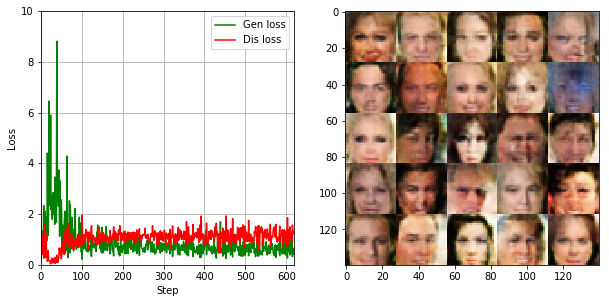

Epc: 1/1    Bat: 6210/12662    Dis Loss: 1.3004    Gen Loss: 0.5978    Time elaps: 00:08:14    Time remain: 00:08:34.
Epc: 1/1    Bat: 6220/12662    Dis Loss: 1.2333    Gen Loss: 0.4928    Time elaps: 00:08:15    Time remain: 00:08:33.
Epc: 1/1    Bat: 6230/12662    Dis Loss: 1.0736    Gen Loss: 0.6775    Time elaps: 00:08:16    Time remain: 00:08:32.
Epc: 1/1    Bat: 6240/12662    Dis Loss: 1.3373    Gen Loss: 0.3872    Time elaps: 00:08:17    Time remain: 00:08:31.
Epc: 1/1    Bat: 6250/12662    Dis Loss: 1.4295    Gen Loss: 0.4204    Time elaps: 00:08:18    Time remain: 00:08:31.
Epc: 1/1    Bat: 6260/12662    Dis Loss: 0.8772    Gen Loss: 0.8149    Time elaps: 00:08:19    Time remain: 00:08:30.
Epc: 1/1    Bat: 6270/12662    Dis Loss: 1.1547    Gen Loss: 0.8867    Time elaps: 00:08:19    Time remain: 00:08:29.
Epc: 1/1    Bat: 6280/12662    Dis Loss: 0.8306    Gen Loss: 0.9029    Time elaps: 00:08:20    Time remain: 00:08:28.
Epc: 1/1    Bat: 6290/12662    Dis Loss: 1.2975    Gen L

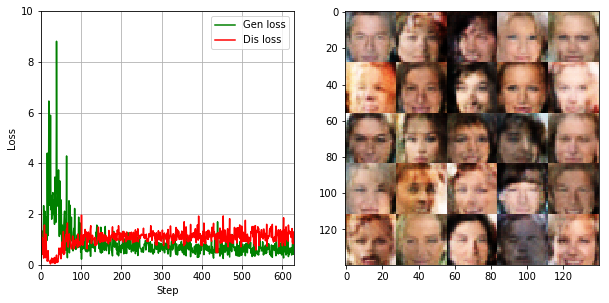

Epc: 1/1    Bat: 6310/12662    Dis Loss: 1.3314    Gen Loss: 0.4308    Time elaps: 00:08:23    Time remain: 00:08:27.
Epc: 1/1    Bat: 6320/12662    Dis Loss: 1.3320    Gen Loss: 0.5423    Time elaps: 00:08:24    Time remain: 00:08:26.
Epc: 1/1    Bat: 6330/12662    Dis Loss: 1.4304    Gen Loss: 0.3520    Time elaps: 00:08:25    Time remain: 00:08:25.
Epc: 1/1    Bat: 6340/12662    Dis Loss: 1.4336    Gen Loss: 0.3536    Time elaps: 00:08:26    Time remain: 00:08:24.
Epc: 1/1    Bat: 6350/12662    Dis Loss: 1.2480    Gen Loss: 0.5132    Time elaps: 00:08:26    Time remain: 00:08:23.
Epc: 1/1    Bat: 6360/12662    Dis Loss: 1.3734    Gen Loss: 0.5251    Time elaps: 00:08:27    Time remain: 00:08:23.
Epc: 1/1    Bat: 6370/12662    Dis Loss: 0.8798    Gen Loss: 0.7954    Time elaps: 00:08:28    Time remain: 00:08:22.
Epc: 1/1    Bat: 6380/12662    Dis Loss: 1.0974    Gen Loss: 0.6363    Time elaps: 00:08:29    Time remain: 00:08:21.
Epc: 1/1    Bat: 6390/12662    Dis Loss: 0.9871    Gen L

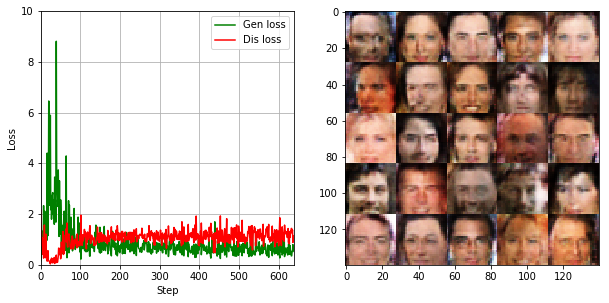

Epc: 1/1    Bat: 6410/12662    Dis Loss: 1.3260    Gen Loss: 0.5092    Time elaps: 00:08:32    Time remain: 00:08:19.
Epc: 1/1    Bat: 6420/12662    Dis Loss: 1.2021    Gen Loss: 0.5258    Time elaps: 00:08:33    Time remain: 00:08:18.
Epc: 1/1    Bat: 6430/12662    Dis Loss: 1.2080    Gen Loss: 0.4955    Time elaps: 00:08:33    Time remain: 00:08:18.
Epc: 1/1    Bat: 6440/12662    Dis Loss: 0.7025    Gen Loss: 1.0566    Time elaps: 00:08:34    Time remain: 00:08:17.
Epc: 1/1    Bat: 6450/12662    Dis Loss: 1.3994    Gen Loss: 0.3845    Time elaps: 00:08:35    Time remain: 00:08:16.
Epc: 1/1    Bat: 6460/12662    Dis Loss: 1.7102    Gen Loss: 0.2921    Time elaps: 00:08:36    Time remain: 00:08:15.
Epc: 1/1    Bat: 6470/12662    Dis Loss: 1.0826    Gen Loss: 0.6163    Time elaps: 00:08:37    Time remain: 00:08:14.
Epc: 1/1    Bat: 6480/12662    Dis Loss: 1.3874    Gen Loss: 0.3911    Time elaps: 00:08:37    Time remain: 00:08:14.
Epc: 1/1    Bat: 6490/12662    Dis Loss: 1.1458    Gen L

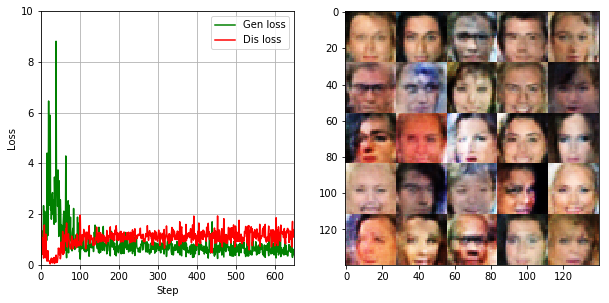

Epc: 1/1    Bat: 6510/12662    Dis Loss: 1.0280    Gen Loss: 0.6067    Time elaps: 00:08:40    Time remain: 00:08:12.
Epc: 1/1    Bat: 6520/12662    Dis Loss: 1.3065    Gen Loss: 0.4314    Time elaps: 00:08:41    Time remain: 00:08:11.
Epc: 1/1    Bat: 6530/12662    Dis Loss: 0.8973    Gen Loss: 0.8453    Time elaps: 00:08:42    Time remain: 00:08:10.
Epc: 1/1    Bat: 6540/12662    Dis Loss: 1.0157    Gen Loss: 0.7058    Time elaps: 00:08:43    Time remain: 00:08:09.
Epc: 1/1    Bat: 6550/12662    Dis Loss: 0.8419    Gen Loss: 0.9465    Time elaps: 00:08:43    Time remain: 00:08:08.
Epc: 1/1    Bat: 6560/12662    Dis Loss: 1.2034    Gen Loss: 0.4618    Time elaps: 00:08:44    Time remain: 00:08:08.
Epc: 1/1    Bat: 6570/12662    Dis Loss: 0.8237    Gen Loss: 0.8722    Time elaps: 00:08:45    Time remain: 00:08:07.
Epc: 1/1    Bat: 6580/12662    Dis Loss: 1.5047    Gen Loss: 0.3508    Time elaps: 00:08:46    Time remain: 00:08:06.
Epc: 1/1    Bat: 6590/12662    Dis Loss: 1.3105    Gen L

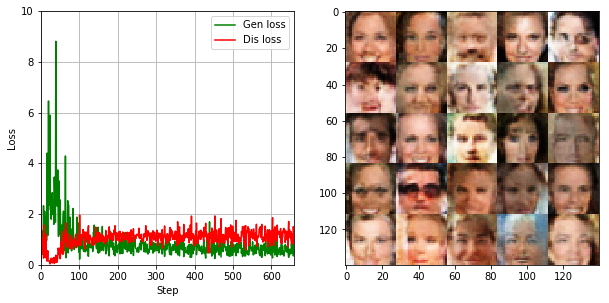

Epc: 1/1    Bat: 6610/12662    Dis Loss: 1.4805    Gen Loss: 0.3424    Time elaps: 00:08:49    Time remain: 00:08:04.
Epc: 1/1    Bat: 6620/12662    Dis Loss: 1.3710    Gen Loss: 0.3973    Time elaps: 00:08:50    Time remain: 00:08:03.
Epc: 1/1    Bat: 6630/12662    Dis Loss: 1.2445    Gen Loss: 0.5440    Time elaps: 00:08:50    Time remain: 00:08:03.
Epc: 1/1    Bat: 6640/12662    Dis Loss: 1.0069    Gen Loss: 1.2206    Time elaps: 00:08:51    Time remain: 00:08:02.
Epc: 1/1    Bat: 6650/12662    Dis Loss: 1.7221    Gen Loss: 0.2745    Time elaps: 00:08:52    Time remain: 00:08:01.
Epc: 1/1    Bat: 6660/12662    Dis Loss: 1.5130    Gen Loss: 0.3485    Time elaps: 00:08:53    Time remain: 00:08:00.
Epc: 1/1    Bat: 6670/12662    Dis Loss: 1.3547    Gen Loss: 0.3752    Time elaps: 00:08:54    Time remain: 00:07:59.
Epc: 1/1    Bat: 6680/12662    Dis Loss: 1.7254    Gen Loss: 0.2713    Time elaps: 00:08:55    Time remain: 00:07:59.
Epc: 1/1    Bat: 6690/12662    Dis Loss: 0.6440    Gen L

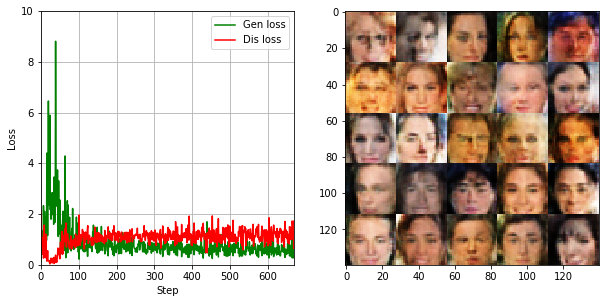

Epc: 1/1    Bat: 6710/12662    Dis Loss: 1.0169    Gen Loss: 0.9761    Time elaps: 00:08:57    Time remain: 00:07:57.
Epc: 1/1    Bat: 6720/12662    Dis Loss: 1.4064    Gen Loss: 0.4300    Time elaps: 00:08:58    Time remain: 00:07:56.
Epc: 1/1    Bat: 6730/12662    Dis Loss: 0.9210    Gen Loss: 0.9245    Time elaps: 00:08:59    Time remain: 00:07:55.
Epc: 1/1    Bat: 6740/12662    Dis Loss: 1.5168    Gen Loss: 0.3296    Time elaps: 00:09:00    Time remain: 00:07:54.
Epc: 1/1    Bat: 6750/12662    Dis Loss: 1.0558    Gen Loss: 0.7445    Time elaps: 00:09:01    Time remain: 00:07:54.
Epc: 1/1    Bat: 6760/12662    Dis Loss: 1.3594    Gen Loss: 0.6196    Time elaps: 00:09:02    Time remain: 00:07:53.
Epc: 1/1    Bat: 6770/12662    Dis Loss: 1.0888    Gen Loss: 0.6791    Time elaps: 00:09:02    Time remain: 00:07:52.
Epc: 1/1    Bat: 6780/12662    Dis Loss: 1.2721    Gen Loss: 0.4490    Time elaps: 00:09:03    Time remain: 00:07:51.
Epc: 1/1    Bat: 6790/12662    Dis Loss: 1.0673    Gen L

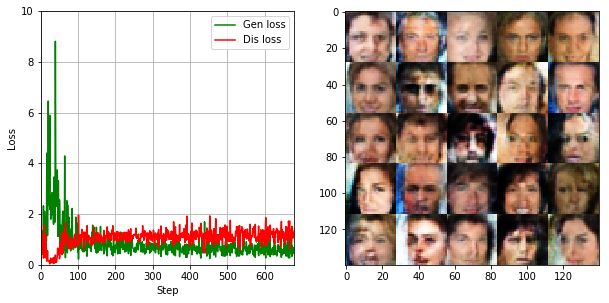

Epc: 1/1    Bat: 6810/12662    Dis Loss: 1.0486    Gen Loss: 0.5499    Time elaps: 00:09:06    Time remain: 00:07:49.
Epc: 1/1    Bat: 6820/12662    Dis Loss: 1.6444    Gen Loss: 0.3164    Time elaps: 00:09:07    Time remain: 00:07:48.
Epc: 1/1    Bat: 6830/12662    Dis Loss: 1.0072    Gen Loss: 0.6720    Time elaps: 00:09:08    Time remain: 00:07:48.
Epc: 1/1    Bat: 6840/12662    Dis Loss: 0.9616    Gen Loss: 0.6656    Time elaps: 00:09:09    Time remain: 00:07:47.
Epc: 1/1    Bat: 6850/12662    Dis Loss: 1.0408    Gen Loss: 0.6141    Time elaps: 00:09:09    Time remain: 00:07:46.
Epc: 1/1    Bat: 6860/12662    Dis Loss: 1.1388    Gen Loss: 0.5148    Time elaps: 00:09:10    Time remain: 00:07:45.
Epc: 1/1    Bat: 6870/12662    Dis Loss: 1.1185    Gen Loss: 0.6141    Time elaps: 00:09:11    Time remain: 00:07:44.
Epc: 1/1    Bat: 6880/12662    Dis Loss: 1.0823    Gen Loss: 0.6859    Time elaps: 00:09:12    Time remain: 00:07:44.
Epc: 1/1    Bat: 6890/12662    Dis Loss: 0.7498    Gen L

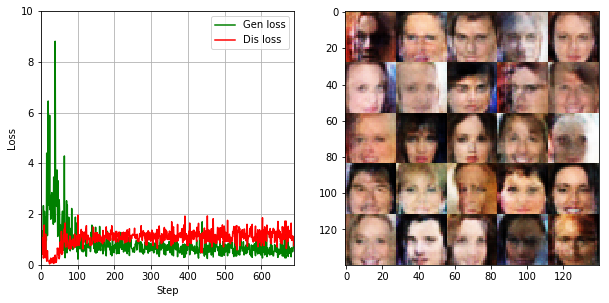

Epc: 1/1    Bat: 6910/12662    Dis Loss: 1.0871    Gen Loss: 0.9012    Time elaps: 00:09:15    Time remain: 00:07:42.
Epc: 1/1    Bat: 6920/12662    Dis Loss: 1.7241    Gen Loss: 0.2744    Time elaps: 00:09:16    Time remain: 00:07:41.
Epc: 1/1    Bat: 6930/12662    Dis Loss: 1.4473    Gen Loss: 0.3486    Time elaps: 00:09:16    Time remain: 00:07:40.
Epc: 1/1    Bat: 6940/12662    Dis Loss: 1.2806    Gen Loss: 0.4969    Time elaps: 00:09:17    Time remain: 00:07:39.
Epc: 1/1    Bat: 6950/12662    Dis Loss: 1.2460    Gen Loss: 0.5563    Time elaps: 00:09:18    Time remain: 00:07:39.
Epc: 1/1    Bat: 6960/12662    Dis Loss: 0.6638    Gen Loss: 0.9549    Time elaps: 00:09:19    Time remain: 00:07:38.
Epc: 1/1    Bat: 6970/12662    Dis Loss: 1.8241    Gen Loss: 0.2643    Time elaps: 00:09:20    Time remain: 00:07:37.
Epc: 1/1    Bat: 6980/12662    Dis Loss: 1.0527    Gen Loss: 0.5905    Time elaps: 00:09:20    Time remain: 00:07:36.
Epc: 1/1    Bat: 6990/12662    Dis Loss: 1.0146    Gen L

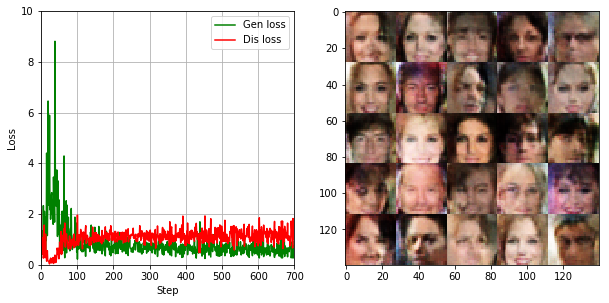

Epc: 1/1    Bat: 7010/12662    Dis Loss: 0.9687    Gen Loss: 0.8430    Time elaps: 00:09:23    Time remain: 00:07:34.
Epc: 1/1    Bat: 7020/12662    Dis Loss: 0.8574    Gen Loss: 0.8832    Time elaps: 00:09:24    Time remain: 00:07:33.
Epc: 1/1    Bat: 7030/12662    Dis Loss: 1.0213    Gen Loss: 0.6640    Time elaps: 00:09:25    Time remain: 00:07:33.
Epc: 1/1    Bat: 7040/12662    Dis Loss: 1.2132    Gen Loss: 0.5689    Time elaps: 00:09:26    Time remain: 00:07:32.
Epc: 1/1    Bat: 7050/12662    Dis Loss: 1.3702    Gen Loss: 0.3764    Time elaps: 00:09:27    Time remain: 00:07:31.
Epc: 1/1    Bat: 7060/12662    Dis Loss: 1.1035    Gen Loss: 0.6691    Time elaps: 00:09:27    Time remain: 00:07:30.
Epc: 1/1    Bat: 7070/12662    Dis Loss: 1.2482    Gen Loss: 0.8308    Time elaps: 00:09:28    Time remain: 00:07:29.
Epc: 1/1    Bat: 7080/12662    Dis Loss: 1.2099    Gen Loss: 0.4632    Time elaps: 00:09:29    Time remain: 00:07:29.
Epc: 1/1    Bat: 7090/12662    Dis Loss: 1.1939    Gen L

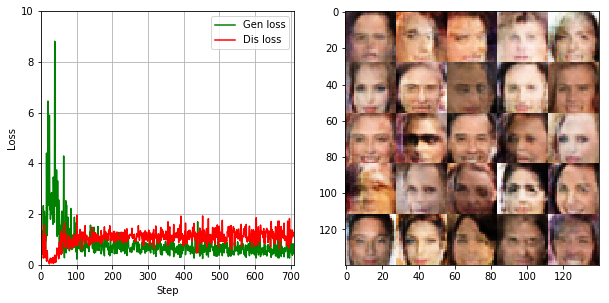

Epc: 1/1    Bat: 7110/12662    Dis Loss: 0.9233    Gen Loss: 0.7632    Time elaps: 00:09:32    Time remain: 00:07:27.
Epc: 1/1    Bat: 7120/12662    Dis Loss: 1.1670    Gen Loss: 0.5521    Time elaps: 00:09:33    Time remain: 00:07:26.
Epc: 1/1    Bat: 7130/12662    Dis Loss: 0.7219    Gen Loss: 0.8919    Time elaps: 00:09:34    Time remain: 00:07:25.
Epc: 1/1    Bat: 7140/12662    Dis Loss: 0.9853    Gen Loss: 0.5964    Time elaps: 00:09:34    Time remain: 00:07:24.
Epc: 1/1    Bat: 7150/12662    Dis Loss: 1.5171    Gen Loss: 0.3150    Time elaps: 00:09:35    Time remain: 00:07:23.
Epc: 1/1    Bat: 7160/12662    Dis Loss: 1.1708    Gen Loss: 0.7668    Time elaps: 00:09:36    Time remain: 00:07:23.
Epc: 1/1    Bat: 7170/12662    Dis Loss: 0.9029    Gen Loss: 1.0033    Time elaps: 00:09:37    Time remain: 00:07:22.
Epc: 1/1    Bat: 7180/12662    Dis Loss: 0.7247    Gen Loss: 0.9311    Time elaps: 00:09:38    Time remain: 00:07:21.
Epc: 1/1    Bat: 7190/12662    Dis Loss: 0.9650    Gen L

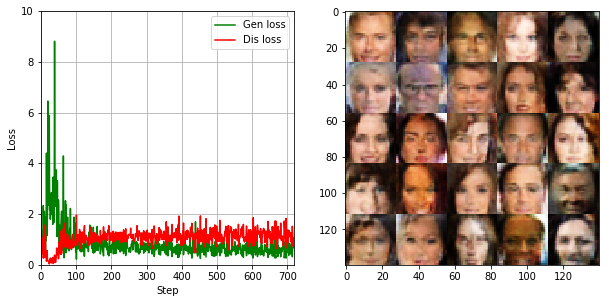

Epc: 1/1    Bat: 7210/12662    Dis Loss: 1.1565    Gen Loss: 0.7714    Time elaps: 00:09:41    Time remain: 00:07:19.
Epc: 1/1    Bat: 7220/12662    Dis Loss: 0.8919    Gen Loss: 0.7316    Time elaps: 00:09:41    Time remain: 00:07:18.
Epc: 1/1    Bat: 7230/12662    Dis Loss: 1.7001    Gen Loss: 0.2703    Time elaps: 00:09:42    Time remain: 00:07:17.
Epc: 1/1    Bat: 7240/12662    Dis Loss: 1.3683    Gen Loss: 0.5096    Time elaps: 00:09:43    Time remain: 00:07:16.
Epc: 1/1    Bat: 7250/12662    Dis Loss: 1.0618    Gen Loss: 0.6564    Time elaps: 00:09:44    Time remain: 00:07:16.
Epc: 1/1    Bat: 7260/12662    Dis Loss: 1.2271    Gen Loss: 0.5893    Time elaps: 00:09:45    Time remain: 00:07:15.
Epc: 1/1    Bat: 7270/12662    Dis Loss: 1.8200    Gen Loss: 0.2678    Time elaps: 00:09:45    Time remain: 00:07:14.
Epc: 1/1    Bat: 7280/12662    Dis Loss: 1.4032    Gen Loss: 0.3544    Time elaps: 00:09:46    Time remain: 00:07:13.
Epc: 1/1    Bat: 7290/12662    Dis Loss: 1.3106    Gen L

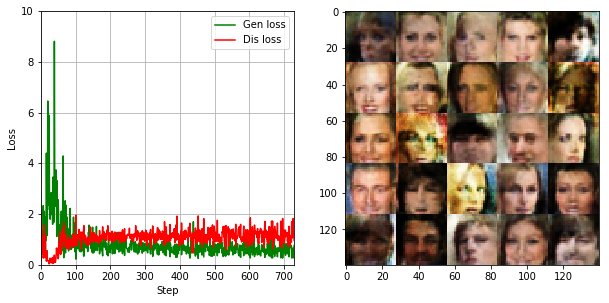

Epc: 1/1    Bat: 7310/12662    Dis Loss: 1.4745    Gen Loss: 0.3443    Time elaps: 00:09:49    Time remain: 00:07:11.
Epc: 1/1    Bat: 7320/12662    Dis Loss: 1.2319    Gen Loss: 0.4826    Time elaps: 00:09:50    Time remain: 00:07:11.
Epc: 1/1    Bat: 7330/12662    Dis Loss: 1.4183    Gen Loss: 0.4270    Time elaps: 00:09:51    Time remain: 00:07:10.
Epc: 1/1    Bat: 7340/12662    Dis Loss: 1.0926    Gen Loss: 0.6851    Time elaps: 00:09:52    Time remain: 00:07:09.
Epc: 1/1    Bat: 7350/12662    Dis Loss: 0.8898    Gen Loss: 0.9042    Time elaps: 00:09:53    Time remain: 00:07:08.
Epc: 1/1    Bat: 7360/12662    Dis Loss: 1.6032    Gen Loss: 0.2983    Time elaps: 00:09:53    Time remain: 00:07:07.
Epc: 1/1    Bat: 7370/12662    Dis Loss: 0.9793    Gen Loss: 0.6345    Time elaps: 00:09:54    Time remain: 00:07:07.
Epc: 1/1    Bat: 7380/12662    Dis Loss: 1.0178    Gen Loss: 0.6939    Time elaps: 00:09:55    Time remain: 00:07:06.
Epc: 1/1    Bat: 7390/12662    Dis Loss: 1.1631    Gen L

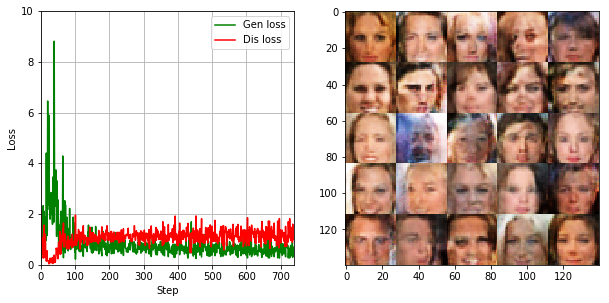

Epc: 1/1    Bat: 7410/12662    Dis Loss: 1.0025    Gen Loss: 0.6978    Time elaps: 00:09:58    Time remain: 00:07:04.
Epc: 1/1    Bat: 7420/12662    Dis Loss: 1.3426    Gen Loss: 0.3774    Time elaps: 00:09:59    Time remain: 00:07:03.
Epc: 1/1    Bat: 7430/12662    Dis Loss: 1.5023    Gen Loss: 0.3577    Time elaps: 00:10:00    Time remain: 00:07:02.
Epc: 1/1    Bat: 7440/12662    Dis Loss: 1.5803    Gen Loss: 0.3540    Time elaps: 00:10:00    Time remain: 00:07:01.
Epc: 1/1    Bat: 7450/12662    Dis Loss: 1.0657    Gen Loss: 0.7065    Time elaps: 00:10:01    Time remain: 00:07:00.
Epc: 1/1    Bat: 7460/12662    Dis Loss: 0.9960    Gen Loss: 0.6494    Time elaps: 00:10:02    Time remain: 00:07:00.
Epc: 1/1    Bat: 7470/12662    Dis Loss: 1.1761    Gen Loss: 0.6981    Time elaps: 00:10:03    Time remain: 00:06:59.
Epc: 1/1    Bat: 7480/12662    Dis Loss: 1.1846    Gen Loss: 0.5026    Time elaps: 00:10:04    Time remain: 00:06:58.
Epc: 1/1    Bat: 7490/12662    Dis Loss: 1.3242    Gen L

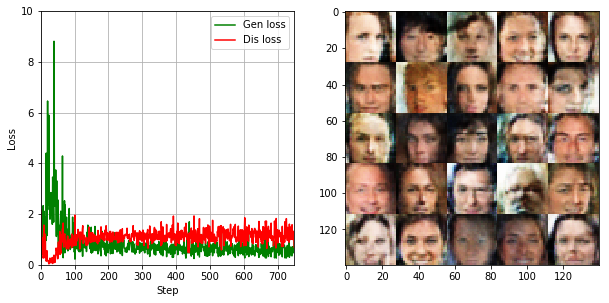

Epc: 1/1    Bat: 7510/12662    Dis Loss: 1.3275    Gen Loss: 0.4373    Time elaps: 00:10:07    Time remain: 00:06:56.
Epc: 1/1    Bat: 7520/12662    Dis Loss: 1.2406    Gen Loss: 0.7102    Time elaps: 00:10:07    Time remain: 00:06:55.
Epc: 1/1    Bat: 7530/12662    Dis Loss: 0.9636    Gen Loss: 0.7488    Time elaps: 00:10:08    Time remain: 00:06:54.
Epc: 1/1    Bat: 7540/12662    Dis Loss: 0.9796    Gen Loss: 0.7136    Time elaps: 00:10:09    Time remain: 00:06:54.
Epc: 1/1    Bat: 7550/12662    Dis Loss: 1.2351    Gen Loss: 0.6069    Time elaps: 00:10:10    Time remain: 00:06:53.
Epc: 1/1    Bat: 7560/12662    Dis Loss: 1.1006    Gen Loss: 0.5112    Time elaps: 00:10:11    Time remain: 00:06:52.
Epc: 1/1    Bat: 7570/12662    Dis Loss: 1.3765    Gen Loss: 0.3942    Time elaps: 00:10:11    Time remain: 00:06:51.
Epc: 1/1    Bat: 7580/12662    Dis Loss: 1.0432    Gen Loss: 0.6025    Time elaps: 00:10:12    Time remain: 00:06:50.
Epc: 1/1    Bat: 7590/12662    Dis Loss: 1.2155    Gen L

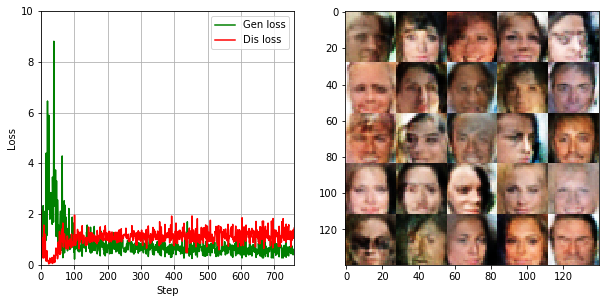

Epc: 1/1    Bat: 7610/12662    Dis Loss: 1.2949    Gen Loss: 0.4829    Time elaps: 00:10:15    Time remain: 00:06:48.
Epc: 1/1    Bat: 7620/12662    Dis Loss: 1.3353    Gen Loss: 0.4286    Time elaps: 00:10:16    Time remain: 00:06:47.
Epc: 1/1    Bat: 7630/12662    Dis Loss: 1.0031    Gen Loss: 0.6722    Time elaps: 00:10:17    Time remain: 00:06:47.
Epc: 1/1    Bat: 7640/12662    Dis Loss: 1.1394    Gen Loss: 0.6065    Time elaps: 00:10:18    Time remain: 00:06:46.
Epc: 1/1    Bat: 7650/12662    Dis Loss: 1.1571    Gen Loss: 0.6370    Time elaps: 00:10:18    Time remain: 00:06:45.
Epc: 1/1    Bat: 7660/12662    Dis Loss: 1.2479    Gen Loss: 0.4850    Time elaps: 00:10:19    Time remain: 00:06:44.
Epc: 1/1    Bat: 7670/12662    Dis Loss: 0.6960    Gen Loss: 1.2059    Time elaps: 00:10:20    Time remain: 00:06:43.
Epc: 1/1    Bat: 7680/12662    Dis Loss: 1.4798    Gen Loss: 0.4608    Time elaps: 00:10:21    Time remain: 00:06:43.
Epc: 1/1    Bat: 7690/12662    Dis Loss: 0.9334    Gen L

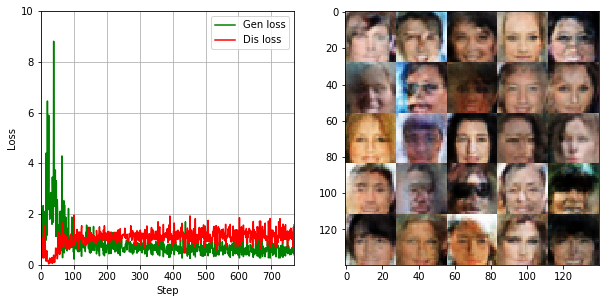

Epc: 1/1    Bat: 7710/12662    Dis Loss: 0.9689    Gen Loss: 0.7891    Time elaps: 00:10:24    Time remain: 00:06:41.
Epc: 1/1    Bat: 7720/12662    Dis Loss: 1.1329    Gen Loss: 0.6075    Time elaps: 00:10:25    Time remain: 00:06:40.
Epc: 1/1    Bat: 7730/12662    Dis Loss: 1.2637    Gen Loss: 0.4966    Time elaps: 00:10:26    Time remain: 00:06:39.
Epc: 1/1    Bat: 7740/12662    Dis Loss: 0.6157    Gen Loss: 1.1486    Time elaps: 00:10:26    Time remain: 00:06:38.
Epc: 1/1    Bat: 7750/12662    Dis Loss: 0.8560    Gen Loss: 0.7942    Time elaps: 00:10:27    Time remain: 00:06:37.
Epc: 1/1    Bat: 7760/12662    Dis Loss: 1.5066    Gen Loss: 0.3322    Time elaps: 00:10:28    Time remain: 00:06:36.
Epc: 1/1    Bat: 7770/12662    Dis Loss: 1.5311    Gen Loss: 0.3237    Time elaps: 00:10:29    Time remain: 00:06:36.
Epc: 1/1    Bat: 7780/12662    Dis Loss: 1.1266    Gen Loss: 0.6070    Time elaps: 00:10:29    Time remain: 00:06:35.
Epc: 1/1    Bat: 7790/12662    Dis Loss: 1.0675    Gen L

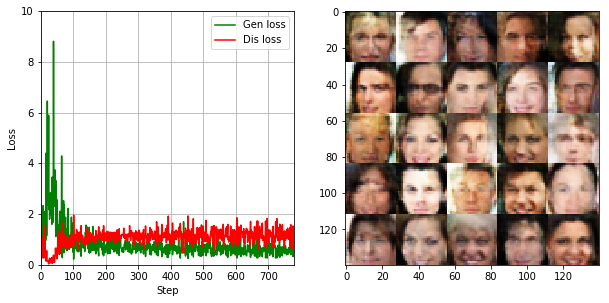

Epc: 1/1    Bat: 7810/12662    Dis Loss: 1.1353    Gen Loss: 0.5833    Time elaps: 00:10:32    Time remain: 00:06:33.
Epc: 1/1    Bat: 7820/12662    Dis Loss: 0.8286    Gen Loss: 0.8713    Time elaps: 00:10:33    Time remain: 00:06:32.
Epc: 1/1    Bat: 7830/12662    Dis Loss: 1.3884    Gen Loss: 0.4260    Time elaps: 00:10:34    Time remain: 00:06:31.
Epc: 1/1    Bat: 7840/12662    Dis Loss: 1.1609    Gen Loss: 0.6118    Time elaps: 00:10:34    Time remain: 00:06:30.
Epc: 1/1    Bat: 7850/12662    Dis Loss: 1.3009    Gen Loss: 0.5027    Time elaps: 00:10:35    Time remain: 00:06:29.
Epc: 1/1    Bat: 7860/12662    Dis Loss: 1.1795    Gen Loss: 0.6974    Time elaps: 00:10:36    Time remain: 00:06:28.
Epc: 1/1    Bat: 7870/12662    Dis Loss: 1.7353    Gen Loss: 0.3122    Time elaps: 00:10:37    Time remain: 00:06:28.
Epc: 1/1    Bat: 7880/12662    Dis Loss: 0.8790    Gen Loss: 0.7729    Time elaps: 00:10:38    Time remain: 00:06:27.
Epc: 1/1    Bat: 7890/12662    Dis Loss: 1.1526    Gen L

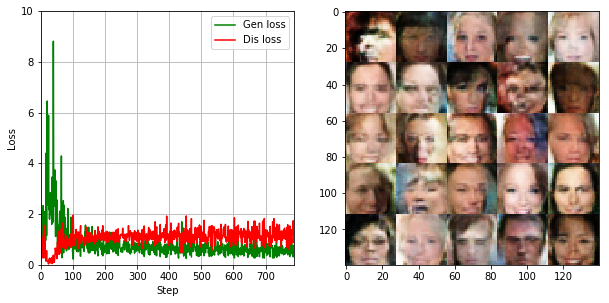

Epc: 1/1    Bat: 7910/12662    Dis Loss: 0.7509    Gen Loss: 0.9190    Time elaps: 00:10:40    Time remain: 00:06:25.
Epc: 1/1    Bat: 7920/12662    Dis Loss: 1.1031    Gen Loss: 0.5809    Time elaps: 00:10:41    Time remain: 00:06:24.
Epc: 1/1    Bat: 7930/12662    Dis Loss: 0.8221    Gen Loss: 1.1618    Time elaps: 00:10:42    Time remain: 00:06:23.
Epc: 1/1    Bat: 7940/12662    Dis Loss: 0.8026    Gen Loss: 0.8834    Time elaps: 00:10:43    Time remain: 00:06:22.
Epc: 1/1    Bat: 7950/12662    Dis Loss: 1.1579    Gen Loss: 0.5411    Time elaps: 00:10:43    Time remain: 00:06:21.
Epc: 1/1    Bat: 7960/12662    Dis Loss: 1.1654    Gen Loss: 0.7674    Time elaps: 00:10:44    Time remain: 00:06:20.
Epc: 1/1    Bat: 7970/12662    Dis Loss: 0.7476    Gen Loss: 0.9909    Time elaps: 00:10:45    Time remain: 00:06:20.
Epc: 1/1    Bat: 7980/12662    Dis Loss: 0.7080    Gen Loss: 1.1844    Time elaps: 00:10:46    Time remain: 00:06:19.
Epc: 1/1    Bat: 7990/12662    Dis Loss: 0.6655    Gen L

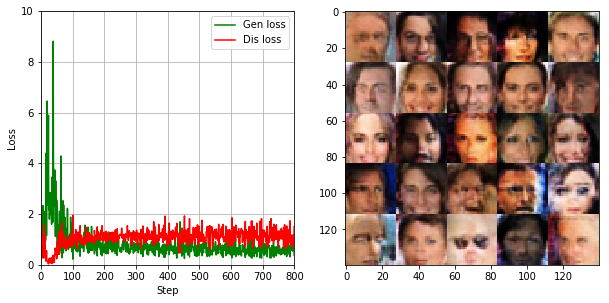

Epc: 1/1    Bat: 8010/12662    Dis Loss: 0.8862    Gen Loss: 0.9182    Time elaps: 00:10:49    Time remain: 00:06:16.
Epc: 1/1    Bat: 8020/12662    Dis Loss: 1.0121    Gen Loss: 0.8114    Time elaps: 00:10:49    Time remain: 00:06:16.
Epc: 1/1    Bat: 8030/12662    Dis Loss: 1.0889    Gen Loss: 0.6444    Time elaps: 00:10:50    Time remain: 00:06:15.
Epc: 1/1    Bat: 8040/12662    Dis Loss: 1.1588    Gen Loss: 0.4968    Time elaps: 00:10:51    Time remain: 00:06:14.
Epc: 1/1    Bat: 8050/12662    Dis Loss: 1.1043    Gen Loss: 0.6554    Time elaps: 00:10:52    Time remain: 00:06:13.
Epc: 1/1    Bat: 8060/12662    Dis Loss: 1.1357    Gen Loss: 0.5764    Time elaps: 00:10:52    Time remain: 00:06:12.
Epc: 1/1    Bat: 8070/12662    Dis Loss: 1.2341    Gen Loss: 0.5214    Time elaps: 00:10:53    Time remain: 00:06:11.
Epc: 1/1    Bat: 8080/12662    Dis Loss: 0.7425    Gen Loss: 0.9611    Time elaps: 00:10:54    Time remain: 00:06:11.
Epc: 1/1    Bat: 8090/12662    Dis Loss: 0.8243    Gen L

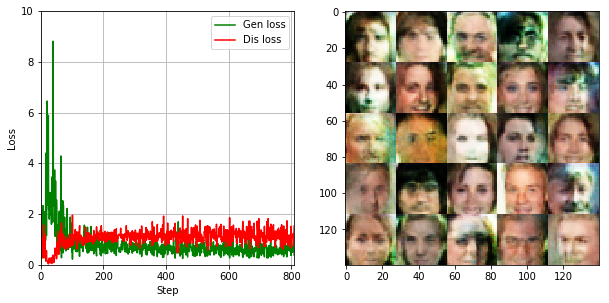

Epc: 1/1    Bat: 8110/12662    Dis Loss: 1.3124    Gen Loss: 0.6356    Time elaps: 00:10:57    Time remain: 00:06:08.
Epc: 1/1    Bat: 8120/12662    Dis Loss: 1.2909    Gen Loss: 0.4444    Time elaps: 00:10:57    Time remain: 00:06:08.
Epc: 1/1    Bat: 8130/12662    Dis Loss: 0.9979    Gen Loss: 0.9713    Time elaps: 00:10:58    Time remain: 00:06:07.
Epc: 1/1    Bat: 8140/12662    Dis Loss: 1.4236    Gen Loss: 0.3845    Time elaps: 00:10:59    Time remain: 00:06:06.
Epc: 1/1    Bat: 8150/12662    Dis Loss: 1.0050    Gen Loss: 0.7295    Time elaps: 00:11:00    Time remain: 00:06:05.
Epc: 1/1    Bat: 8160/12662    Dis Loss: 1.2942    Gen Loss: 0.4362    Time elaps: 00:11:00    Time remain: 00:06:04.
Epc: 1/1    Bat: 8170/12662    Dis Loss: 1.4330    Gen Loss: 0.3407    Time elaps: 00:11:01    Time remain: 00:06:03.
Epc: 1/1    Bat: 8180/12662    Dis Loss: 1.5057    Gen Loss: 0.3218    Time elaps: 00:11:02    Time remain: 00:06:03.
Epc: 1/1    Bat: 8190/12662    Dis Loss: 1.2047    Gen L

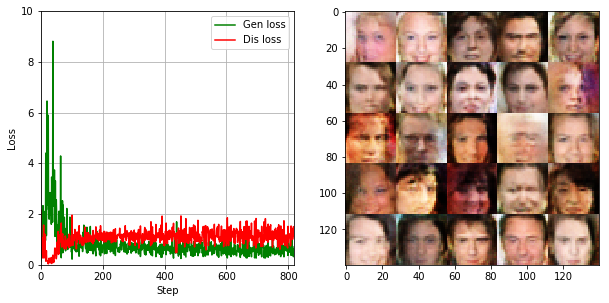

Epc: 1/1    Bat: 8210/12662    Dis Loss: 1.0404    Gen Loss: 0.6501    Time elaps: 00:11:05    Time remain: 00:06:00.
Epc: 1/1    Bat: 8220/12662    Dis Loss: 1.3375    Gen Loss: 0.4136    Time elaps: 00:11:06    Time remain: 00:05:59.
Epc: 1/1    Bat: 8230/12662    Dis Loss: 1.0818    Gen Loss: 0.6075    Time elaps: 00:11:06    Time remain: 00:05:59.
Epc: 1/1    Bat: 8240/12662    Dis Loss: 0.9162    Gen Loss: 0.7671    Time elaps: 00:11:07    Time remain: 00:05:58.
Epc: 1/1    Bat: 8250/12662    Dis Loss: 0.8823    Gen Loss: 0.9816    Time elaps: 00:11:08    Time remain: 00:05:57.
Epc: 1/1    Bat: 8260/12662    Dis Loss: 1.3870    Gen Loss: 0.3887    Time elaps: 00:11:09    Time remain: 00:05:56.
Epc: 1/1    Bat: 8270/12662    Dis Loss: 1.1794    Gen Loss: 0.5204    Time elaps: 00:11:09    Time remain: 00:05:55.
Epc: 1/1    Bat: 8280/12662    Dis Loss: 1.2743    Gen Loss: 0.4883    Time elaps: 00:11:10    Time remain: 00:05:54.
Epc: 1/1    Bat: 8290/12662    Dis Loss: 1.2831    Gen L

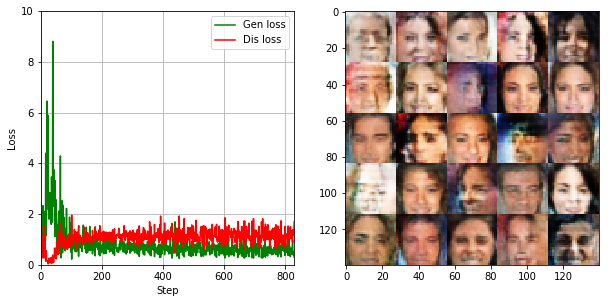

Epc: 1/1    Bat: 8310/12662    Dis Loss: 1.2556    Gen Loss: 0.4460    Time elaps: 00:11:13    Time remain: 00:05:52.
Epc: 1/1    Bat: 8320/12662    Dis Loss: 1.0471    Gen Loss: 0.6777    Time elaps: 00:11:14    Time remain: 00:05:51.
Epc: 1/1    Bat: 8330/12662    Dis Loss: 1.0405    Gen Loss: 0.6704    Time elaps: 00:11:14    Time remain: 00:05:51.
Epc: 1/1    Bat: 8340/12662    Dis Loss: 0.9077    Gen Loss: 0.9821    Time elaps: 00:11:15    Time remain: 00:05:50.
Epc: 1/1    Bat: 8350/12662    Dis Loss: 0.8694    Gen Loss: 0.9618    Time elaps: 00:11:16    Time remain: 00:05:49.
Epc: 1/1    Bat: 8360/12662    Dis Loss: 1.2709    Gen Loss: 0.4742    Time elaps: 00:11:17    Time remain: 00:05:48.
Epc: 1/1    Bat: 8370/12662    Dis Loss: 0.9871    Gen Loss: 0.6349    Time elaps: 00:11:17    Time remain: 00:05:47.
Epc: 1/1    Bat: 8380/12662    Dis Loss: 1.0142    Gen Loss: 0.8361    Time elaps: 00:11:18    Time remain: 00:05:46.
Epc: 1/1    Bat: 8390/12662    Dis Loss: 0.8407    Gen L

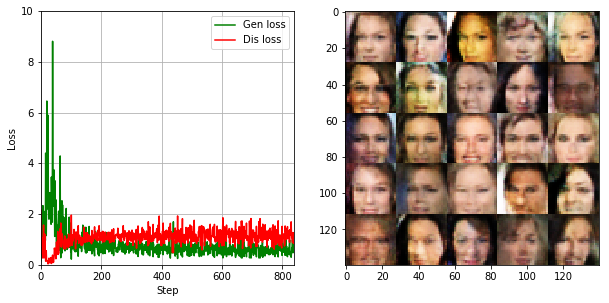

Epc: 1/1    Bat: 8410/12662    Dis Loss: 0.9459    Gen Loss: 0.7552    Time elaps: 00:11:21    Time remain: 00:05:44.
Epc: 1/1    Bat: 8420/12662    Dis Loss: 1.1550    Gen Loss: 0.5374    Time elaps: 00:11:22    Time remain: 00:05:43.
Epc: 1/1    Bat: 8430/12662    Dis Loss: 1.0834    Gen Loss: 0.6099    Time elaps: 00:11:23    Time remain: 00:05:43.
Epc: 1/1    Bat: 8440/12662    Dis Loss: 0.8347    Gen Loss: 0.8665    Time elaps: 00:11:23    Time remain: 00:05:42.
Epc: 1/1    Bat: 8450/12662    Dis Loss: 1.2098    Gen Loss: 0.5416    Time elaps: 00:11:24    Time remain: 00:05:41.
Epc: 1/1    Bat: 8460/12662    Dis Loss: 1.3111    Gen Loss: 0.4633    Time elaps: 00:11:25    Time remain: 00:05:40.
Epc: 1/1    Bat: 8470/12662    Dis Loss: 0.9111    Gen Loss: 0.7912    Time elaps: 00:11:26    Time remain: 00:05:39.
Epc: 1/1    Bat: 8480/12662    Dis Loss: 1.5571    Gen Loss: 0.2934    Time elaps: 00:11:26    Time remain: 00:05:38.
Epc: 1/1    Bat: 8490/12662    Dis Loss: 1.3547    Gen L

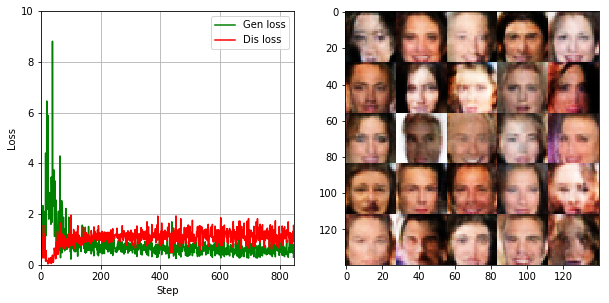

Epc: 1/1    Bat: 8510/12662    Dis Loss: 1.2894    Gen Loss: 0.6084    Time elaps: 00:11:29    Time remain: 00:05:36.
Epc: 1/1    Bat: 8520/12662    Dis Loss: 1.4868    Gen Loss: 0.4199    Time elaps: 00:11:30    Time remain: 00:05:35.
Epc: 1/1    Bat: 8530/12662    Dis Loss: 1.0551    Gen Loss: 0.5779    Time elaps: 00:11:31    Time remain: 00:05:34.
Epc: 1/1    Bat: 8540/12662    Dis Loss: 0.9214    Gen Loss: 1.1183    Time elaps: 00:11:32    Time remain: 00:05:34.
Epc: 1/1    Bat: 8550/12662    Dis Loss: 0.9729    Gen Loss: 0.8721    Time elaps: 00:11:32    Time remain: 00:05:33.
Epc: 1/1    Bat: 8560/12662    Dis Loss: 1.4381    Gen Loss: 0.3495    Time elaps: 00:11:33    Time remain: 00:05:32.
Epc: 1/1    Bat: 8570/12662    Dis Loss: 1.2918    Gen Loss: 0.5038    Time elaps: 00:11:34    Time remain: 00:05:31.
Epc: 1/1    Bat: 8580/12662    Dis Loss: 1.1150    Gen Loss: 0.7236    Time elaps: 00:11:35    Time remain: 00:05:30.
Epc: 1/1    Bat: 8590/12662    Dis Loss: 0.9363    Gen L

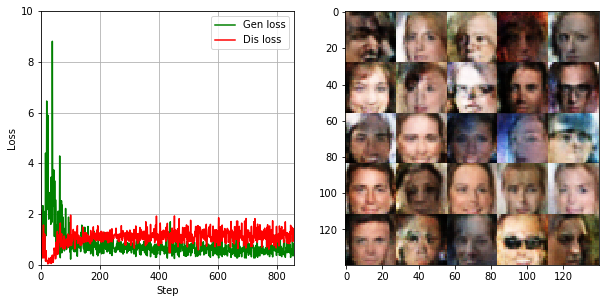

Epc: 1/1    Bat: 8610/12662    Dis Loss: 1.2430    Gen Loss: 0.5470    Time elaps: 00:11:37    Time remain: 00:05:28.
Epc: 1/1    Bat: 8620/12662    Dis Loss: 1.1791    Gen Loss: 0.5423    Time elaps: 00:11:38    Time remain: 00:05:27.
Epc: 1/1    Bat: 8630/12662    Dis Loss: 1.2440    Gen Loss: 0.4584    Time elaps: 00:11:39    Time remain: 00:05:26.
Epc: 1/1    Bat: 8640/12662    Dis Loss: 0.9568    Gen Loss: 0.7409    Time elaps: 00:11:40    Time remain: 00:05:25.
Epc: 1/1    Bat: 8650/12662    Dis Loss: 0.9848    Gen Loss: 0.8532    Time elaps: 00:11:40    Time remain: 00:05:25.
Epc: 1/1    Bat: 8660/12662    Dis Loss: 0.8349    Gen Loss: 0.7259    Time elaps: 00:11:41    Time remain: 00:05:24.
Epc: 1/1    Bat: 8670/12662    Dis Loss: 0.9987    Gen Loss: 0.8277    Time elaps: 00:11:42    Time remain: 00:05:23.
Epc: 1/1    Bat: 8680/12662    Dis Loss: 1.3782    Gen Loss: 0.3953    Time elaps: 00:11:43    Time remain: 00:05:22.
Epc: 1/1    Bat: 8690/12662    Dis Loss: 1.1883    Gen L

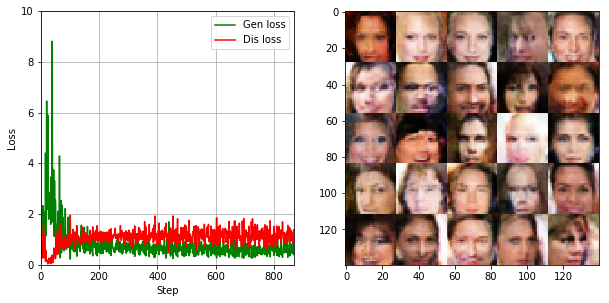

Epc: 1/1    Bat: 8710/12662    Dis Loss: 0.8836    Gen Loss: 0.6322    Time elaps: 00:11:46    Time remain: 00:05:20.
Epc: 1/1    Bat: 8720/12662    Dis Loss: 1.4167    Gen Loss: 0.4226    Time elaps: 00:11:46    Time remain: 00:05:19.
Epc: 1/1    Bat: 8730/12662    Dis Loss: 1.1544    Gen Loss: 0.5043    Time elaps: 00:11:47    Time remain: 00:05:18.
Epc: 1/1    Bat: 8740/12662    Dis Loss: 0.8869    Gen Loss: 0.9700    Time elaps: 00:11:48    Time remain: 00:05:17.
Epc: 1/1    Bat: 8750/12662    Dis Loss: 0.7395    Gen Loss: 1.0112    Time elaps: 00:11:49    Time remain: 00:05:17.
Epc: 1/1    Bat: 8760/12662    Dis Loss: 1.3060    Gen Loss: 0.5133    Time elaps: 00:11:49    Time remain: 00:05:16.
Epc: 1/1    Bat: 8770/12662    Dis Loss: 1.0090    Gen Loss: 0.8837    Time elaps: 00:11:50    Time remain: 00:05:15.
Epc: 1/1    Bat: 8780/12662    Dis Loss: 0.8435    Gen Loss: 0.8584    Time elaps: 00:11:51    Time remain: 00:05:14.
Epc: 1/1    Bat: 8790/12662    Dis Loss: 0.8431    Gen L

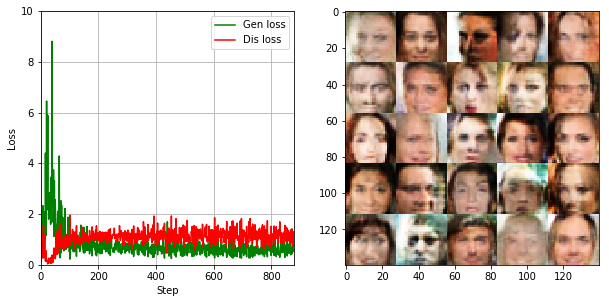

Epc: 1/1    Bat: 8810/12662    Dis Loss: 1.2033    Gen Loss: 0.4802    Time elaps: 00:11:54    Time remain: 00:05:12.
Epc: 1/1    Bat: 8820/12662    Dis Loss: 1.4647    Gen Loss: 0.4035    Time elaps: 00:11:54    Time remain: 00:05:11.
Epc: 1/1    Bat: 8830/12662    Dis Loss: 0.9948    Gen Loss: 0.9596    Time elaps: 00:11:55    Time remain: 00:05:10.
Epc: 1/1    Bat: 8840/12662    Dis Loss: 0.9532    Gen Loss: 0.6943    Time elaps: 00:11:56    Time remain: 00:05:09.
Epc: 1/1    Bat: 8850/12662    Dis Loss: 0.9738    Gen Loss: 0.6593    Time elaps: 00:11:57    Time remain: 00:05:08.
Epc: 1/1    Bat: 8860/12662    Dis Loss: 1.0160    Gen Loss: 0.6647    Time elaps: 00:11:58    Time remain: 00:05:08.
Epc: 1/1    Bat: 8870/12662    Dis Loss: 0.8862    Gen Loss: 0.7671    Time elaps: 00:11:58    Time remain: 00:05:07.
Epc: 1/1    Bat: 8880/12662    Dis Loss: 0.9847    Gen Loss: 0.6779    Time elaps: 00:11:59    Time remain: 00:05:06.
Epc: 1/1    Bat: 8890/12662    Dis Loss: 1.0925    Gen L

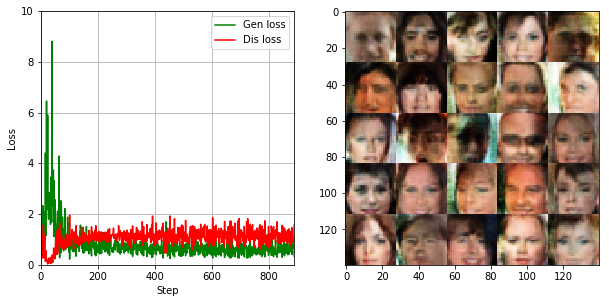

Epc: 1/1    Bat: 8910/12662    Dis Loss: 1.2132    Gen Loss: 0.4660    Time elaps: 00:12:02    Time remain: 00:05:04.
Epc: 1/1    Bat: 8920/12662    Dis Loss: 0.7960    Gen Loss: 0.9227    Time elaps: 00:12:03    Time remain: 00:05:03.
Epc: 1/1    Bat: 8930/12662    Dis Loss: 0.9762    Gen Loss: 0.6141    Time elaps: 00:12:03    Time remain: 00:05:02.
Epc: 1/1    Bat: 8940/12662    Dis Loss: 1.3318    Gen Loss: 0.4502    Time elaps: 00:12:04    Time remain: 00:05:01.
Epc: 1/1    Bat: 8950/12662    Dis Loss: 1.5636    Gen Loss: 0.2920    Time elaps: 00:12:05    Time remain: 00:05:00.
Epc: 1/1    Bat: 8960/12662    Dis Loss: 0.9450    Gen Loss: 0.8378    Time elaps: 00:12:06    Time remain: 00:05:00.
Epc: 1/1    Bat: 8970/12662    Dis Loss: 1.2558    Gen Loss: 0.4767    Time elaps: 00:12:06    Time remain: 00:04:59.
Epc: 1/1    Bat: 8980/12662    Dis Loss: 1.2306    Gen Loss: 0.4403    Time elaps: 00:12:07    Time remain: 00:04:58.
Epc: 1/1    Bat: 8990/12662    Dis Loss: 1.2894    Gen L

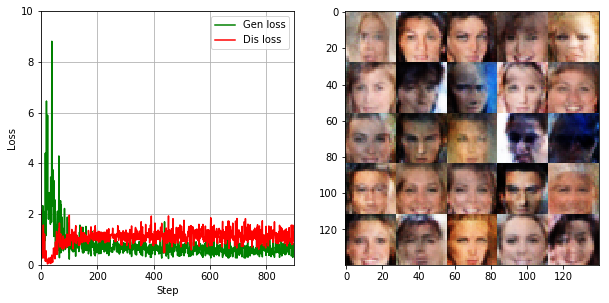

Epc: 1/1    Bat: 9010/12662    Dis Loss: 1.3988    Gen Loss: 0.5343    Time elaps: 00:12:10    Time remain: 00:04:56.
Epc: 1/1    Bat: 9020/12662    Dis Loss: 0.8804    Gen Loss: 0.9095    Time elaps: 00:12:11    Time remain: 00:04:55.
Epc: 1/1    Bat: 9030/12662    Dis Loss: 1.5230    Gen Loss: 0.3110    Time elaps: 00:12:11    Time remain: 00:04:54.
Epc: 1/1    Bat: 9040/12662    Dis Loss: 0.8258    Gen Loss: 0.8550    Time elaps: 00:12:12    Time remain: 00:04:53.
Epc: 1/1    Bat: 9050/12662    Dis Loss: 1.2035    Gen Loss: 0.7252    Time elaps: 00:12:13    Time remain: 00:04:52.
Epc: 1/1    Bat: 9060/12662    Dis Loss: 0.8975    Gen Loss: 0.8463    Time elaps: 00:12:14    Time remain: 00:04:51.
Epc: 1/1    Bat: 9070/12662    Dis Loss: 1.2154    Gen Loss: 0.6301    Time elaps: 00:12:15    Time remain: 00:04:51.
Epc: 1/1    Bat: 9080/12662    Dis Loss: 1.1518    Gen Loss: 0.6136    Time elaps: 00:12:15    Time remain: 00:04:50.
Epc: 1/1    Bat: 9090/12662    Dis Loss: 0.9241    Gen L

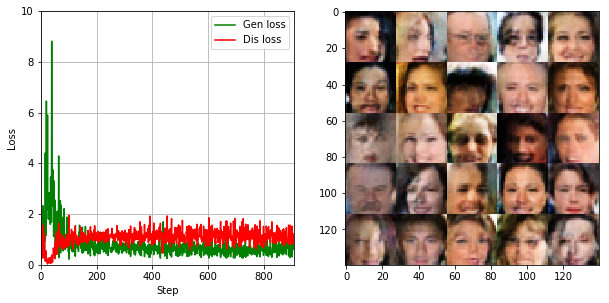

Epc: 1/1    Bat: 9110/12662    Dis Loss: 1.3102    Gen Loss: 0.5252    Time elaps: 00:12:18    Time remain: 00:04:48.
Epc: 1/1    Bat: 9120/12662    Dis Loss: 1.1911    Gen Loss: 0.6382    Time elaps: 00:12:19    Time remain: 00:04:47.
Epc: 1/1    Bat: 9130/12662    Dis Loss: 1.0867    Gen Loss: 0.6848    Time elaps: 00:12:20    Time remain: 00:04:46.
Epc: 1/1    Bat: 9140/12662    Dis Loss: 0.9988    Gen Loss: 0.7064    Time elaps: 00:12:20    Time remain: 00:04:45.
Epc: 1/1    Bat: 9150/12662    Dis Loss: 1.0095    Gen Loss: 0.8143    Time elaps: 00:12:21    Time remain: 00:04:44.
Epc: 1/1    Bat: 9160/12662    Dis Loss: 0.9851    Gen Loss: 0.6844    Time elaps: 00:12:22    Time remain: 00:04:43.
Epc: 1/1    Bat: 9170/12662    Dis Loss: 1.2053    Gen Loss: 0.4507    Time elaps: 00:12:23    Time remain: 00:04:43.
Epc: 1/1    Bat: 9180/12662    Dis Loss: 1.1368    Gen Loss: 0.8816    Time elaps: 00:12:23    Time remain: 00:04:42.
Epc: 1/1    Bat: 9190/12662    Dis Loss: 1.0891    Gen L

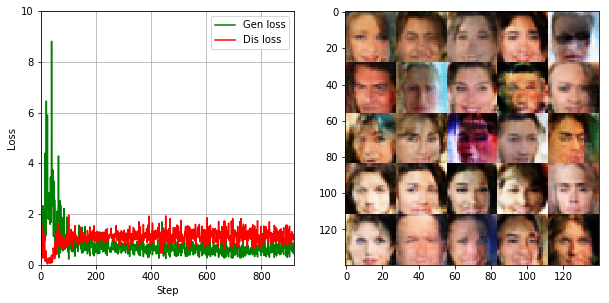

Epc: 1/1    Bat: 9210/12662    Dis Loss: 1.2475    Gen Loss: 0.4894    Time elaps: 00:12:26    Time remain: 00:04:39.
Epc: 1/1    Bat: 9220/12662    Dis Loss: 1.1978    Gen Loss: 0.5483    Time elaps: 00:12:27    Time remain: 00:04:39.
Epc: 1/1    Bat: 9230/12662    Dis Loss: 1.0830    Gen Loss: 0.5649    Time elaps: 00:12:28    Time remain: 00:04:38.
Epc: 1/1    Bat: 9240/12662    Dis Loss: 0.8936    Gen Loss: 0.8675    Time elaps: 00:12:29    Time remain: 00:04:37.
Epc: 1/1    Bat: 9250/12662    Dis Loss: 1.5234    Gen Loss: 0.3592    Time elaps: 00:12:29    Time remain: 00:04:36.
Epc: 1/1    Bat: 9260/12662    Dis Loss: 1.5990    Gen Loss: 0.3922    Time elaps: 00:12:30    Time remain: 00:04:35.
Epc: 1/1    Bat: 9270/12662    Dis Loss: 0.9733    Gen Loss: 0.9624    Time elaps: 00:12:31    Time remain: 00:04:34.
Epc: 1/1    Bat: 9280/12662    Dis Loss: 1.1932    Gen Loss: 0.5234    Time elaps: 00:12:32    Time remain: 00:04:34.
Epc: 1/1    Bat: 9290/12662    Dis Loss: 1.5170    Gen L

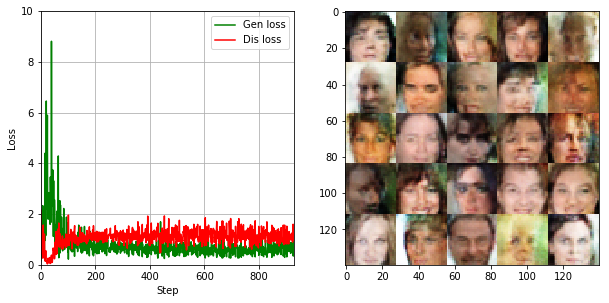

Epc: 1/1    Bat: 9310/12662    Dis Loss: 1.0486    Gen Loss: 0.7285    Time elaps: 00:12:34    Time remain: 00:04:31.
Epc: 1/1    Bat: 9320/12662    Dis Loss: 1.1083    Gen Loss: 0.7084    Time elaps: 00:12:35    Time remain: 00:04:30.
Epc: 1/1    Bat: 9330/12662    Dis Loss: 1.2580    Gen Loss: 0.4975    Time elaps: 00:12:36    Time remain: 00:04:30.
Epc: 1/1    Bat: 9340/12662    Dis Loss: 1.7289    Gen Loss: 0.2887    Time elaps: 00:12:37    Time remain: 00:04:29.
Epc: 1/1    Bat: 9350/12662    Dis Loss: 1.0935    Gen Loss: 0.6176    Time elaps: 00:12:37    Time remain: 00:04:28.
Epc: 1/1    Bat: 9360/12662    Dis Loss: 0.7647    Gen Loss: 0.9326    Time elaps: 00:12:38    Time remain: 00:04:27.
Epc: 1/1    Bat: 9370/12662    Dis Loss: 1.1633    Gen Loss: 0.8495    Time elaps: 00:12:39    Time remain: 00:04:26.
Epc: 1/1    Bat: 9380/12662    Dis Loss: 1.0252    Gen Loss: 0.7294    Time elaps: 00:12:40    Time remain: 00:04:25.
Epc: 1/1    Bat: 9390/12662    Dis Loss: 1.1258    Gen L

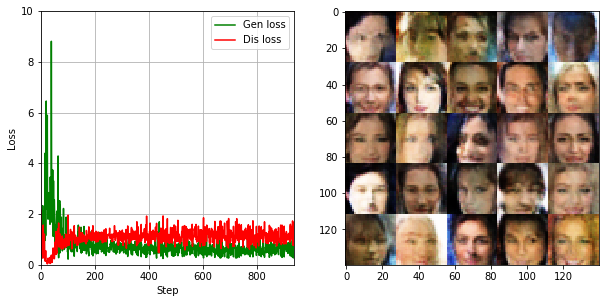

Epc: 1/1    Bat: 9410/12662    Dis Loss: 1.1789    Gen Loss: 0.7278    Time elaps: 00:12:42    Time remain: 00:04:23.
Epc: 1/1    Bat: 9420/12662    Dis Loss: 1.3088    Gen Loss: 0.4676    Time elaps: 00:12:43    Time remain: 00:04:22.
Epc: 1/1    Bat: 9430/12662    Dis Loss: 1.6817    Gen Loss: 0.3013    Time elaps: 00:12:44    Time remain: 00:04:22.
Epc: 1/1    Bat: 9440/12662    Dis Loss: 0.8005    Gen Loss: 1.1100    Time elaps: 00:12:45    Time remain: 00:04:21.
Epc: 1/1    Bat: 9450/12662    Dis Loss: 0.6871    Gen Loss: 1.1111    Time elaps: 00:12:45    Time remain: 00:04:20.
Epc: 1/1    Bat: 9460/12662    Dis Loss: 1.2300    Gen Loss: 0.5228    Time elaps: 00:12:46    Time remain: 00:04:19.
Epc: 1/1    Bat: 9470/12662    Dis Loss: 1.1072    Gen Loss: 0.6476    Time elaps: 00:12:47    Time remain: 00:04:18.
Epc: 1/1    Bat: 9480/12662    Dis Loss: 1.1584    Gen Loss: 0.5735    Time elaps: 00:12:48    Time remain: 00:04:17.
Epc: 1/1    Bat: 9490/12662    Dis Loss: 0.9069    Gen L

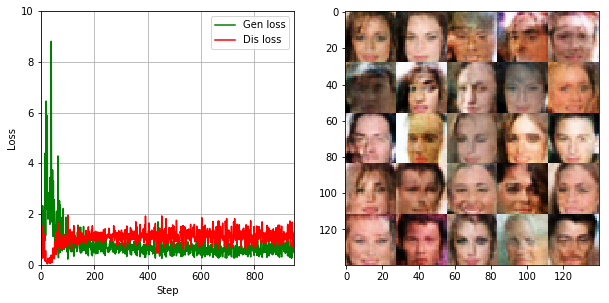

Epc: 1/1    Bat: 9510/12662    Dis Loss: 0.9737    Gen Loss: 0.7862    Time elaps: 00:12:51    Time remain: 00:04:15.
Epc: 1/1    Bat: 9520/12662    Dis Loss: 1.0507    Gen Loss: 0.8212    Time elaps: 00:12:51    Time remain: 00:04:14.
Epc: 1/1    Bat: 9530/12662    Dis Loss: 1.1064    Gen Loss: 0.5380    Time elaps: 00:12:52    Time remain: 00:04:13.
Epc: 1/1    Bat: 9540/12662    Dis Loss: 1.8892    Gen Loss: 0.2729    Time elaps: 00:12:53    Time remain: 00:04:13.
Epc: 1/1    Bat: 9550/12662    Dis Loss: 1.1350    Gen Loss: 0.4994    Time elaps: 00:12:54    Time remain: 00:04:12.
Epc: 1/1    Bat: 9560/12662    Dis Loss: 1.4480    Gen Loss: 0.3507    Time elaps: 00:12:54    Time remain: 00:04:11.
Epc: 1/1    Bat: 9570/12662    Dis Loss: 1.7532    Gen Loss: 0.2679    Time elaps: 00:12:55    Time remain: 00:04:10.
Epc: 1/1    Bat: 9580/12662    Dis Loss: 1.0869    Gen Loss: 0.6626    Time elaps: 00:12:56    Time remain: 00:04:09.
Epc: 1/1    Bat: 9590/12662    Dis Loss: 0.9053    Gen L

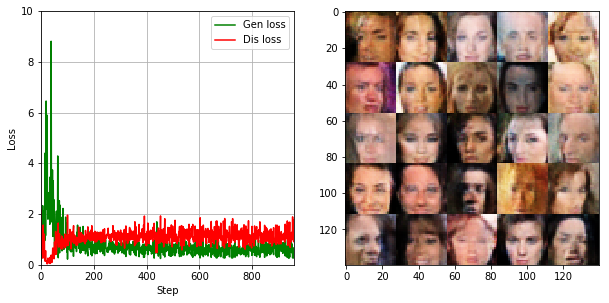

Epc: 1/1    Bat: 9610/12662    Dis Loss: 0.9230    Gen Loss: 0.8728    Time elaps: 00:12:59    Time remain: 00:04:07.
Epc: 1/1    Bat: 9620/12662    Dis Loss: 1.2675    Gen Loss: 0.4685    Time elaps: 00:12:59    Time remain: 00:04:06.
Epc: 1/1    Bat: 9630/12662    Dis Loss: 1.0092    Gen Loss: 0.7172    Time elaps: 00:13:00    Time remain: 00:04:05.
Epc: 1/1    Bat: 9640/12662    Dis Loss: 1.0528    Gen Loss: 0.5508    Time elaps: 00:13:01    Time remain: 00:04:05.
Epc: 1/1    Bat: 9650/12662    Dis Loss: 0.9422    Gen Loss: 0.8277    Time elaps: 00:13:02    Time remain: 00:04:04.
Epc: 1/1    Bat: 9660/12662    Dis Loss: 1.2422    Gen Loss: 0.4951    Time elaps: 00:13:02    Time remain: 00:04:03.
Epc: 1/1    Bat: 9670/12662    Dis Loss: 1.3741    Gen Loss: 0.4003    Time elaps: 00:13:03    Time remain: 00:04:02.
Epc: 1/1    Bat: 9680/12662    Dis Loss: 1.3449    Gen Loss: 0.4367    Time elaps: 00:13:04    Time remain: 00:04:01.
Epc: 1/1    Bat: 9690/12662    Dis Loss: 1.2052    Gen L

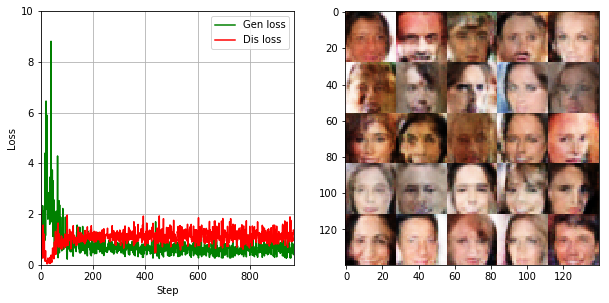

Epc: 1/1    Bat: 9710/12662    Dis Loss: 0.7681    Gen Loss: 0.7906    Time elaps: 00:13:07    Time remain: 00:03:59.
Epc: 1/1    Bat: 9720/12662    Dis Loss: 1.0501    Gen Loss: 0.7234    Time elaps: 00:13:08    Time remain: 00:03:58.
Epc: 1/1    Bat: 9730/12662    Dis Loss: 0.7775    Gen Loss: 0.9136    Time elaps: 00:13:09    Time remain: 00:03:57.
Epc: 1/1    Bat: 9740/12662    Dis Loss: 1.1730    Gen Loss: 0.4634    Time elaps: 00:13:09    Time remain: 00:03:56.
Epc: 1/1    Bat: 9750/12662    Dis Loss: 1.0647    Gen Loss: 0.6684    Time elaps: 00:13:10    Time remain: 00:03:56.
Epc: 1/1    Bat: 9760/12662    Dis Loss: 1.6990    Gen Loss: 0.2778    Time elaps: 00:13:11    Time remain: 00:03:55.
Epc: 1/1    Bat: 9770/12662    Dis Loss: 0.9750    Gen Loss: 0.9528    Time elaps: 00:13:12    Time remain: 00:03:54.
Epc: 1/1    Bat: 9780/12662    Dis Loss: 1.1151    Gen Loss: 0.5900    Time elaps: 00:13:12    Time remain: 00:03:53.
Epc: 1/1    Bat: 9790/12662    Dis Loss: 0.9065    Gen L

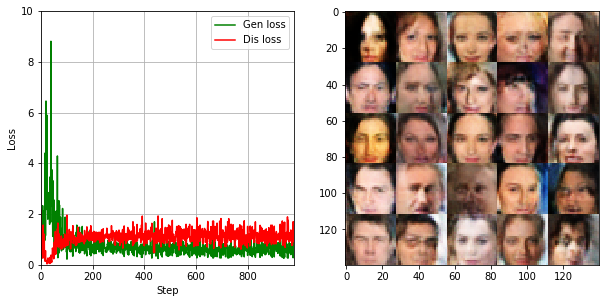

Epc: 1/1    Bat: 9810/12662    Dis Loss: 1.1061    Gen Loss: 0.6520    Time elaps: 00:13:15    Time remain: 00:03:51.
Epc: 1/1    Bat: 9820/12662    Dis Loss: 0.8769    Gen Loss: 0.7695    Time elaps: 00:13:16    Time remain: 00:03:50.
Epc: 1/1    Bat: 9830/12662    Dis Loss: 0.8334    Gen Loss: 0.9176    Time elaps: 00:13:17    Time remain: 00:03:49.
Epc: 1/1    Bat: 9840/12662    Dis Loss: 0.9260    Gen Loss: 0.8236    Time elaps: 00:13:17    Time remain: 00:03:48.
Epc: 1/1    Bat: 9850/12662    Dis Loss: 1.3435    Gen Loss: 0.4288    Time elaps: 00:13:18    Time remain: 00:03:48.
Epc: 1/1    Bat: 9860/12662    Dis Loss: 1.3416    Gen Loss: 0.6027    Time elaps: 00:13:19    Time remain: 00:03:47.
Epc: 1/1    Bat: 9870/12662    Dis Loss: 1.2036    Gen Loss: 0.5096    Time elaps: 00:13:20    Time remain: 00:03:46.
Epc: 1/1    Bat: 9880/12662    Dis Loss: 0.9614    Gen Loss: 0.7067    Time elaps: 00:13:20    Time remain: 00:03:45.
Epc: 1/1    Bat: 9890/12662    Dis Loss: 1.0612    Gen L

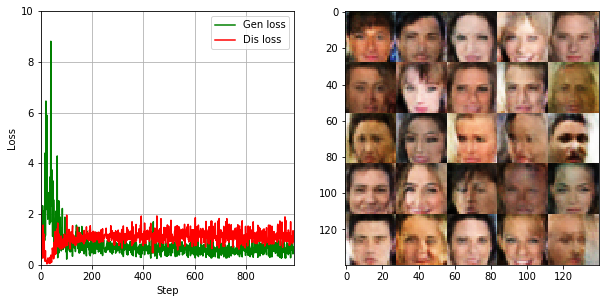

Epc: 1/1    Bat: 9910/12662    Dis Loss: 0.5848    Gen Loss: 1.1962    Time elaps: 00:13:23    Time remain: 00:03:43.
Epc: 1/1    Bat: 9920/12662    Dis Loss: 0.5965    Gen Loss: 1.1530    Time elaps: 00:13:24    Time remain: 00:03:42.
Epc: 1/1    Bat: 9930/12662    Dis Loss: 1.0831    Gen Loss: 0.8352    Time elaps: 00:13:25    Time remain: 00:03:41.
Epc: 1/1    Bat: 9940/12662    Dis Loss: 1.1693    Gen Loss: 0.5065    Time elaps: 00:13:26    Time remain: 00:03:40.
Epc: 1/1    Bat: 9950/12662    Dis Loss: 1.0452    Gen Loss: 0.7596    Time elaps: 00:13:26    Time remain: 00:03:39.
Epc: 1/1    Bat: 9960/12662    Dis Loss: 1.1894    Gen Loss: 0.4415    Time elaps: 00:13:27    Time remain: 00:03:39.
Epc: 1/1    Bat: 9970/12662    Dis Loss: 1.1182    Gen Loss: 0.7341    Time elaps: 00:13:28    Time remain: 00:03:38.
Epc: 1/1    Bat: 9980/12662    Dis Loss: 0.9043    Gen Loss: 0.7353    Time elaps: 00:13:29    Time remain: 00:03:37.
Epc: 1/1    Bat: 9990/12662    Dis Loss: 1.1508    Gen L

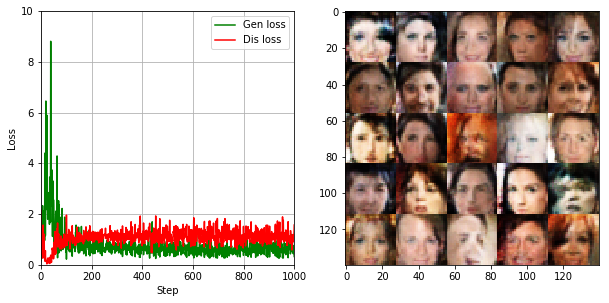

Epc: 1/1    Bat: 10010/12662    Dis Loss: 1.0801    Gen Loss: 0.7833    Time elaps: 00:13:32    Time remain: 00:03:35.
Epc: 1/1    Bat: 10020/12662    Dis Loss: 0.9623    Gen Loss: 0.6130    Time elaps: 00:13:32    Time remain: 00:03:34.
Epc: 1/1    Bat: 10030/12662    Dis Loss: 1.0491    Gen Loss: 0.5863    Time elaps: 00:13:33    Time remain: 00:03:33.
Epc: 1/1    Bat: 10040/12662    Dis Loss: 1.0439    Gen Loss: 0.7946    Time elaps: 00:13:34    Time remain: 00:03:32.
Epc: 1/1    Bat: 10050/12662    Dis Loss: 1.3074    Gen Loss: 0.4621    Time elaps: 00:13:35    Time remain: 00:03:31.
Epc: 1/1    Bat: 10060/12662    Dis Loss: 1.3130    Gen Loss: 0.4550    Time elaps: 00:13:35    Time remain: 00:03:31.
Epc: 1/1    Bat: 10070/12662    Dis Loss: 1.1348    Gen Loss: 0.6302    Time elaps: 00:13:36    Time remain: 00:03:30.
Epc: 1/1    Bat: 10080/12662    Dis Loss: 1.6422    Gen Loss: 0.2983    Time elaps: 00:13:37    Time remain: 00:03:29.
Epc: 1/1    Bat: 10090/12662    Dis Loss: 1.3214

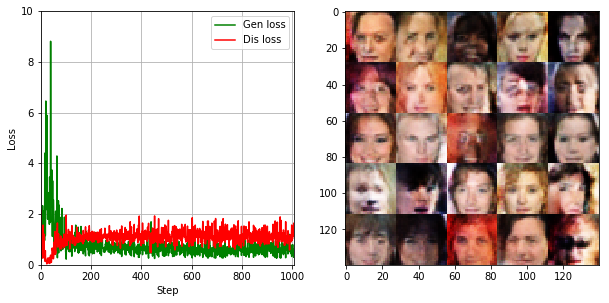

Epc: 1/1    Bat: 10110/12662    Dis Loss: 1.4455    Gen Loss: 0.3681    Time elaps: 00:13:40    Time remain: 00:03:27.
Epc: 1/1    Bat: 10120/12662    Dis Loss: 1.2888    Gen Loss: 0.4398    Time elaps: 00:13:41    Time remain: 00:03:26.
Epc: 1/1    Bat: 10130/12662    Dis Loss: 1.2090    Gen Loss: 0.5116    Time elaps: 00:13:42    Time remain: 00:03:25.
Epc: 1/1    Bat: 10140/12662    Dis Loss: 1.4935    Gen Loss: 0.3422    Time elaps: 00:13:42    Time remain: 00:03:24.
Epc: 1/1    Bat: 10150/12662    Dis Loss: 1.0715    Gen Loss: 0.7348    Time elaps: 00:13:43    Time remain: 00:03:23.
Epc: 1/1    Bat: 10160/12662    Dis Loss: 1.1328    Gen Loss: 0.6921    Time elaps: 00:13:44    Time remain: 00:03:23.
Epc: 1/1    Bat: 10170/12662    Dis Loss: 1.0032    Gen Loss: 0.7349    Time elaps: 00:13:45    Time remain: 00:03:22.
Epc: 1/1    Bat: 10180/12662    Dis Loss: 0.9774    Gen Loss: 0.8925    Time elaps: 00:13:46    Time remain: 00:03:21.
Epc: 1/1    Bat: 10190/12662    Dis Loss: 1.4337

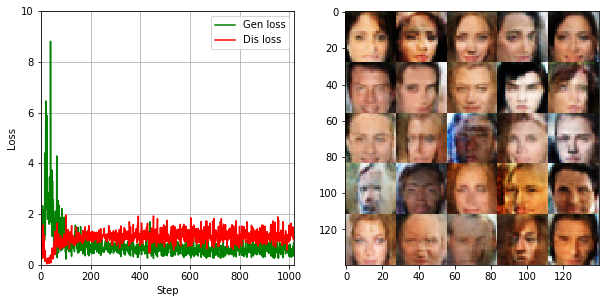

Epc: 1/1    Bat: 10210/12662    Dis Loss: 1.1315    Gen Loss: 0.5323    Time elaps: 00:13:49    Time remain: 00:03:19.
Epc: 1/1    Bat: 10220/12662    Dis Loss: 1.1013    Gen Loss: 0.7953    Time elaps: 00:13:49    Time remain: 00:03:18.
Epc: 1/1    Bat: 10230/12662    Dis Loss: 1.1693    Gen Loss: 0.4948    Time elaps: 00:13:50    Time remain: 00:03:17.
Epc: 1/1    Bat: 10240/12662    Dis Loss: 1.0298    Gen Loss: 0.7332    Time elaps: 00:13:51    Time remain: 00:03:16.
Epc: 1/1    Bat: 10250/12662    Dis Loss: 1.1035    Gen Loss: 0.7223    Time elaps: 00:13:52    Time remain: 00:03:15.
Epc: 1/1    Bat: 10260/12662    Dis Loss: 1.3821    Gen Loss: 0.4245    Time elaps: 00:13:53    Time remain: 00:03:15.
Epc: 1/1    Bat: 10270/12662    Dis Loss: 1.3884    Gen Loss: 0.3649    Time elaps: 00:13:53    Time remain: 00:03:14.
Epc: 1/1    Bat: 10280/12662    Dis Loss: 0.9971    Gen Loss: 0.6119    Time elaps: 00:13:54    Time remain: 00:03:13.
Epc: 1/1    Bat: 10290/12662    Dis Loss: 1.3805

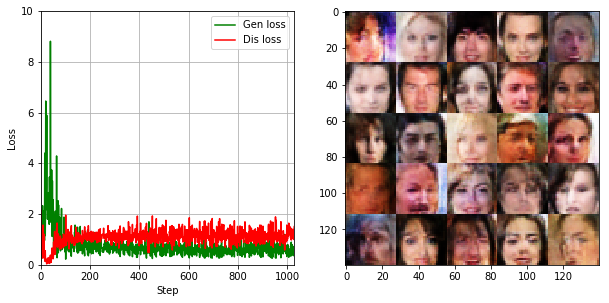

Epc: 1/1    Bat: 10310/12662    Dis Loss: 1.9120    Gen Loss: 0.2532    Time elaps: 00:13:57    Time remain: 00:03:11.
Epc: 1/1    Bat: 10320/12662    Dis Loss: 1.3026    Gen Loss: 0.4326    Time elaps: 00:13:58    Time remain: 00:03:10.
Epc: 1/1    Bat: 10330/12662    Dis Loss: 1.0515    Gen Loss: 0.8271    Time elaps: 00:13:59    Time remain: 00:03:09.
Epc: 1/1    Bat: 10340/12662    Dis Loss: 1.2549    Gen Loss: 0.4329    Time elaps: 00:14:00    Time remain: 00:03:08.
Epc: 1/1    Bat: 10350/12662    Dis Loss: 1.0977    Gen Loss: 0.6243    Time elaps: 00:14:00    Time remain: 00:03:07.
Epc: 1/1    Bat: 10360/12662    Dis Loss: 1.2696    Gen Loss: 0.5578    Time elaps: 00:14:01    Time remain: 00:03:07.
Epc: 1/1    Bat: 10370/12662    Dis Loss: 1.0538    Gen Loss: 0.5621    Time elaps: 00:14:02    Time remain: 00:03:06.
Epc: 1/1    Bat: 10380/12662    Dis Loss: 0.9643    Gen Loss: 0.9394    Time elaps: 00:14:03    Time remain: 00:03:05.
Epc: 1/1    Bat: 10390/12662    Dis Loss: 1.1237

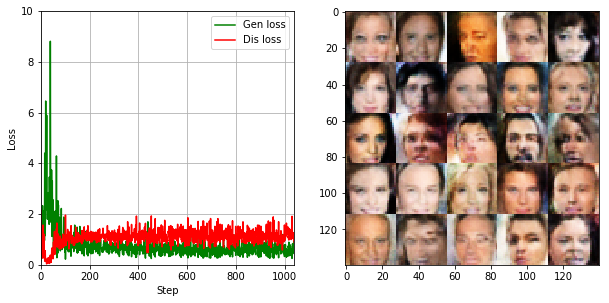

Epc: 1/1    Bat: 10410/12662    Dis Loss: 0.7611    Gen Loss: 0.9541    Time elaps: 00:14:06    Time remain: 00:03:03.
Epc: 1/1    Bat: 10420/12662    Dis Loss: 1.0209    Gen Loss: 0.6621    Time elaps: 00:14:06    Time remain: 00:03:02.
Epc: 1/1    Bat: 10430/12662    Dis Loss: 0.9945    Gen Loss: 0.5910    Time elaps: 00:14:07    Time remain: 00:03:01.
Epc: 1/1    Bat: 10440/12662    Dis Loss: 1.0279    Gen Loss: 0.6950    Time elaps: 00:14:08    Time remain: 00:03:00.
Epc: 1/1    Bat: 10450/12662    Dis Loss: 1.1971    Gen Loss: 0.5392    Time elaps: 00:14:09    Time remain: 00:02:59.
Epc: 1/1    Bat: 10460/12662    Dis Loss: 1.2580    Gen Loss: 0.4519    Time elaps: 00:14:09    Time remain: 00:02:58.
Epc: 1/1    Bat: 10470/12662    Dis Loss: 0.7615    Gen Loss: 0.8755    Time elaps: 00:14:10    Time remain: 00:02:58.
Epc: 1/1    Bat: 10480/12662    Dis Loss: 1.0763    Gen Loss: 0.6206    Time elaps: 00:14:11    Time remain: 00:02:57.
Epc: 1/1    Bat: 10490/12662    Dis Loss: 1.1336

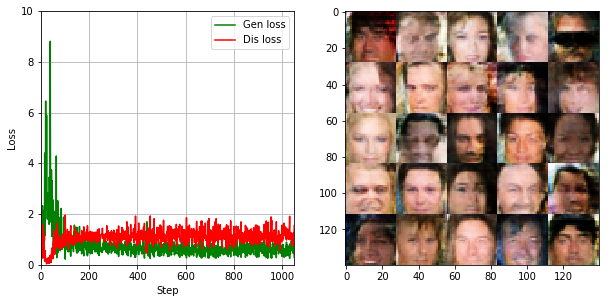

Epc: 1/1    Bat: 10510/12662    Dis Loss: 0.7171    Gen Loss: 1.0591    Time elaps: 00:14:14    Time remain: 00:02:55.
Epc: 1/1    Bat: 10520/12662    Dis Loss: 0.9894    Gen Loss: 0.7717    Time elaps: 00:14:15    Time remain: 00:02:54.
Epc: 1/1    Bat: 10530/12662    Dis Loss: 1.0106    Gen Loss: 0.6019    Time elaps: 00:14:16    Time remain: 00:02:53.
Epc: 1/1    Bat: 10540/12662    Dis Loss: 0.7197    Gen Loss: 1.2111    Time elaps: 00:14:16    Time remain: 00:02:52.
Epc: 1/1    Bat: 10550/12662    Dis Loss: 1.2381    Gen Loss: 0.4565    Time elaps: 00:14:17    Time remain: 00:02:51.
Epc: 1/1    Bat: 10560/12662    Dis Loss: 0.7277    Gen Loss: 0.9158    Time elaps: 00:14:18    Time remain: 00:02:50.
Epc: 1/1    Bat: 10570/12662    Dis Loss: 1.6789    Gen Loss: 0.2791    Time elaps: 00:14:19    Time remain: 00:02:50.
Epc: 1/1    Bat: 10580/12662    Dis Loss: 1.6789    Gen Loss: 0.2947    Time elaps: 00:14:19    Time remain: 00:02:49.
Epc: 1/1    Bat: 10590/12662    Dis Loss: 0.8195

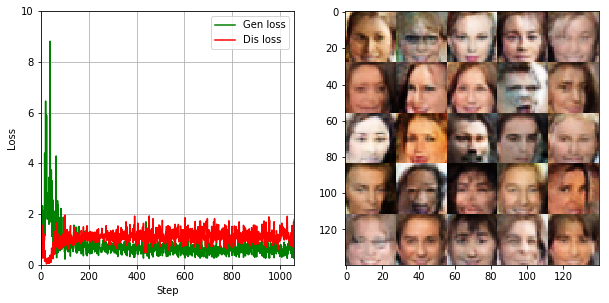

Epc: 1/1    Bat: 10610/12662    Dis Loss: 1.4930    Gen Loss: 0.3524    Time elaps: 00:14:22    Time remain: 00:02:46.
Epc: 1/1    Bat: 10620/12662    Dis Loss: 1.6594    Gen Loss: 0.2676    Time elaps: 00:14:23    Time remain: 00:02:46.
Epc: 1/1    Bat: 10630/12662    Dis Loss: 1.0828    Gen Loss: 0.6530    Time elaps: 00:14:24    Time remain: 00:02:45.
Epc: 1/1    Bat: 10640/12662    Dis Loss: 1.0505    Gen Loss: 0.5894    Time elaps: 00:14:25    Time remain: 00:02:44.
Epc: 1/1    Bat: 10650/12662    Dis Loss: 1.2725    Gen Loss: 0.5572    Time elaps: 00:14:25    Time remain: 00:02:43.
Epc: 1/1    Bat: 10660/12662    Dis Loss: 1.2523    Gen Loss: 0.4869    Time elaps: 00:14:26    Time remain: 00:02:42.
Epc: 1/1    Bat: 10670/12662    Dis Loss: 0.9456    Gen Loss: 0.7281    Time elaps: 00:14:27    Time remain: 00:02:41.
Epc: 1/1    Bat: 10680/12662    Dis Loss: 1.2402    Gen Loss: 0.7345    Time elaps: 00:14:28    Time remain: 00:02:41.
Epc: 1/1    Bat: 10690/12662    Dis Loss: 1.1699

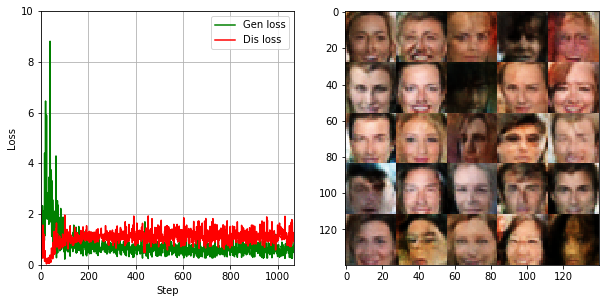

Epc: 1/1    Bat: 10710/12662    Dis Loss: 1.0665    Gen Loss: 0.7515    Time elaps: 00:14:30    Time remain: 00:02:38.
Epc: 1/1    Bat: 10720/12662    Dis Loss: 1.3160    Gen Loss: 0.7168    Time elaps: 00:14:31    Time remain: 00:02:37.
Epc: 1/1    Bat: 10730/12662    Dis Loss: 1.3463    Gen Loss: 0.5545    Time elaps: 00:14:32    Time remain: 00:02:37.
Epc: 1/1    Bat: 10740/12662    Dis Loss: 1.5338    Gen Loss: 0.3332    Time elaps: 00:14:33    Time remain: 00:02:36.
Epc: 1/1    Bat: 10750/12662    Dis Loss: 1.1938    Gen Loss: 0.4692    Time elaps: 00:14:33    Time remain: 00:02:35.
Epc: 1/1    Bat: 10760/12662    Dis Loss: 1.1286    Gen Loss: 0.6072    Time elaps: 00:14:34    Time remain: 00:02:34.
Epc: 1/1    Bat: 10770/12662    Dis Loss: 0.7888    Gen Loss: 1.2763    Time elaps: 00:14:35    Time remain: 00:02:33.
Epc: 1/1    Bat: 10780/12662    Dis Loss: 1.0281    Gen Loss: 0.6454    Time elaps: 00:14:36    Time remain: 00:02:33.
Epc: 1/1    Bat: 10790/12662    Dis Loss: 1.1506

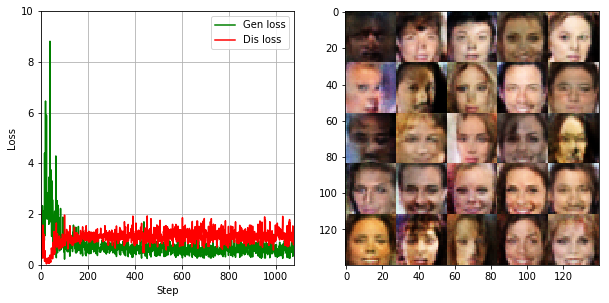

Epc: 1/1    Bat: 10810/12662    Dis Loss: 1.3420    Gen Loss: 0.3816    Time elaps: 00:14:39    Time remain: 00:02:30.
Epc: 1/1    Bat: 10820/12662    Dis Loss: 1.0655    Gen Loss: 0.6903    Time elaps: 00:14:39    Time remain: 00:02:29.
Epc: 1/1    Bat: 10830/12662    Dis Loss: 1.5673    Gen Loss: 0.3218    Time elaps: 00:14:40    Time remain: 00:02:29.
Epc: 1/1    Bat: 10840/12662    Dis Loss: 0.8947    Gen Loss: 1.1126    Time elaps: 00:14:41    Time remain: 00:02:28.
Epc: 1/1    Bat: 10850/12662    Dis Loss: 1.1364    Gen Loss: 0.6121    Time elaps: 00:14:42    Time remain: 00:02:27.
Epc: 1/1    Bat: 10860/12662    Dis Loss: 1.8212    Gen Loss: 0.2813    Time elaps: 00:14:42    Time remain: 00:02:26.
Epc: 1/1    Bat: 10870/12662    Dis Loss: 1.0569    Gen Loss: 0.6911    Time elaps: 00:14:43    Time remain: 00:02:25.
Epc: 1/1    Bat: 10880/12662    Dis Loss: 1.5203    Gen Loss: 0.3557    Time elaps: 00:14:44    Time remain: 00:02:24.
Epc: 1/1    Bat: 10890/12662    Dis Loss: 0.8459

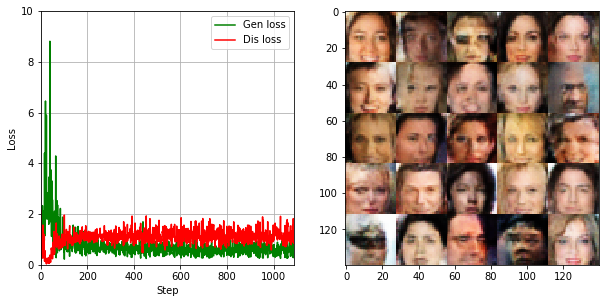

Epc: 1/1    Bat: 10910/12662    Dis Loss: 1.1717    Gen Loss: 0.6825    Time elaps: 00:14:47    Time remain: 00:02:22.
Epc: 1/1    Bat: 10920/12662    Dis Loss: 0.8010    Gen Loss: 0.9436    Time elaps: 00:14:48    Time remain: 00:02:21.
Epc: 1/1    Bat: 10930/12662    Dis Loss: 1.2026    Gen Loss: 0.6148    Time elaps: 00:14:48    Time remain: 00:02:20.
Epc: 1/1    Bat: 10940/12662    Dis Loss: 1.1542    Gen Loss: 0.6667    Time elaps: 00:14:49    Time remain: 00:02:20.
Epc: 1/1    Bat: 10950/12662    Dis Loss: 0.9623    Gen Loss: 0.7281    Time elaps: 00:14:50    Time remain: 00:02:19.
Epc: 1/1    Bat: 10960/12662    Dis Loss: 1.4200    Gen Loss: 0.4320    Time elaps: 00:14:51    Time remain: 00:02:18.
Epc: 1/1    Bat: 10970/12662    Dis Loss: 1.7265    Gen Loss: 0.2752    Time elaps: 00:14:51    Time remain: 00:02:17.
Epc: 1/1    Bat: 10980/12662    Dis Loss: 1.3000    Gen Loss: 0.4081    Time elaps: 00:14:52    Time remain: 00:02:16.
Epc: 1/1    Bat: 10990/12662    Dis Loss: 1.2579

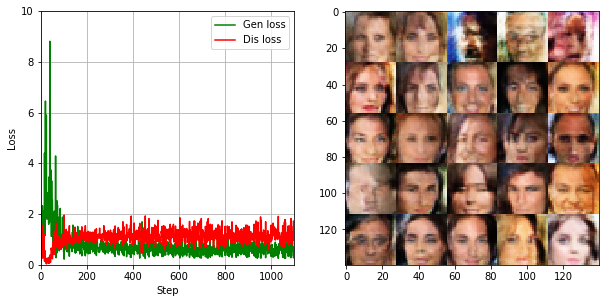

Epc: 1/1    Bat: 11010/12662    Dis Loss: 0.9324    Gen Loss: 0.7687    Time elaps: 00:14:55    Time remain: 00:02:14.
Epc: 1/1    Bat: 11020/12662    Dis Loss: 0.8415    Gen Loss: 0.9377    Time elaps: 00:14:56    Time remain: 00:02:13.
Epc: 1/1    Bat: 11030/12662    Dis Loss: 1.3059    Gen Loss: 0.5428    Time elaps: 00:14:56    Time remain: 00:02:12.
Epc: 1/1    Bat: 11040/12662    Dis Loss: 0.9885    Gen Loss: 0.8568    Time elaps: 00:14:57    Time remain: 00:02:11.
Epc: 1/1    Bat: 11050/12662    Dis Loss: 1.0358    Gen Loss: 0.9037    Time elaps: 00:14:58    Time remain: 00:02:11.
Epc: 1/1    Bat: 11060/12662    Dis Loss: 1.0880    Gen Loss: 0.7096    Time elaps: 00:14:59    Time remain: 00:02:10.
Epc: 1/1    Bat: 11070/12662    Dis Loss: 1.1736    Gen Loss: 0.5909    Time elaps: 00:15:00    Time remain: 00:02:09.
Epc: 1/1    Bat: 11080/12662    Dis Loss: 1.0007    Gen Loss: 0.6377    Time elaps: 00:15:00    Time remain: 00:02:08.
Epc: 1/1    Bat: 11090/12662    Dis Loss: 0.8219

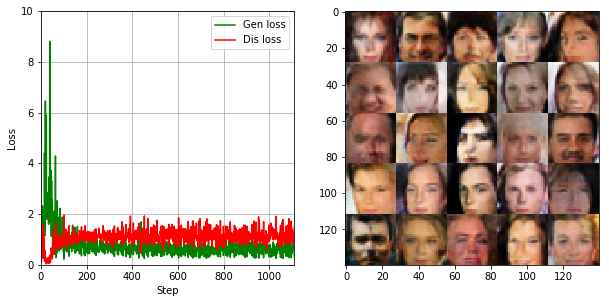

Epc: 1/1    Bat: 11110/12662    Dis Loss: 1.0967    Gen Loss: 0.6453    Time elaps: 00:15:03    Time remain: 00:02:06.
Epc: 1/1    Bat: 11120/12662    Dis Loss: 1.1945    Gen Loss: 0.4447    Time elaps: 00:15:04    Time remain: 00:02:05.
Epc: 1/1    Bat: 11130/12662    Dis Loss: 0.9507    Gen Loss: 0.7427    Time elaps: 00:15:05    Time remain: 00:02:04.
Epc: 1/1    Bat: 11140/12662    Dis Loss: 0.9956    Gen Loss: 0.6752    Time elaps: 00:15:06    Time remain: 00:02:03.
Epc: 1/1    Bat: 11150/12662    Dis Loss: 1.1143    Gen Loss: 0.5829    Time elaps: 00:15:06    Time remain: 00:02:03.
Epc: 1/1    Bat: 11160/12662    Dis Loss: 1.2623    Gen Loss: 0.4358    Time elaps: 00:15:07    Time remain: 00:02:02.
Epc: 1/1    Bat: 11170/12662    Dis Loss: 1.0746    Gen Loss: 0.7550    Time elaps: 00:15:08    Time remain: 00:02:01.
Epc: 1/1    Bat: 11180/12662    Dis Loss: 1.0648    Gen Loss: 0.5902    Time elaps: 00:15:09    Time remain: 00:02:00.
Epc: 1/1    Bat: 11190/12662    Dis Loss: 1.1680

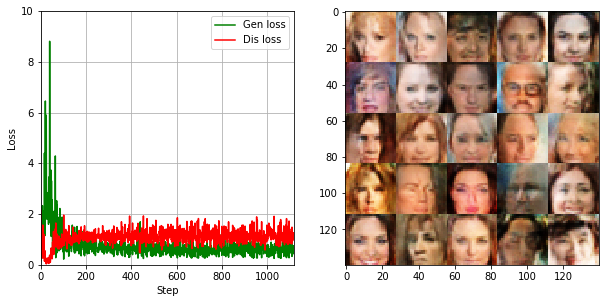

Epc: 1/1    Bat: 11210/12662    Dis Loss: 0.7855    Gen Loss: 1.0382    Time elaps: 00:15:12    Time remain: 00:01:58.
Epc: 1/1    Bat: 11220/12662    Dis Loss: 1.1643    Gen Loss: 0.4768    Time elaps: 00:15:12    Time remain: 00:01:57.
Epc: 1/1    Bat: 11230/12662    Dis Loss: 1.8040    Gen Loss: 0.2631    Time elaps: 00:15:13    Time remain: 00:01:56.
Epc: 1/1    Bat: 11240/12662    Dis Loss: 1.6920    Gen Loss: 0.2636    Time elaps: 00:15:14    Time remain: 00:01:55.
Epc: 1/1    Bat: 11250/12662    Dis Loss: 1.0047    Gen Loss: 0.5994    Time elaps: 00:15:15    Time remain: 00:01:54.
Epc: 1/1    Bat: 11260/12662    Dis Loss: 1.3762    Gen Loss: 0.5323    Time elaps: 00:15:16    Time remain: 00:01:54.
Epc: 1/1    Bat: 11270/12662    Dis Loss: 0.9829    Gen Loss: 0.8773    Time elaps: 00:15:16    Time remain: 00:01:53.
Epc: 1/1    Bat: 11280/12662    Dis Loss: 1.2159    Gen Loss: 0.6037    Time elaps: 00:15:17    Time remain: 00:01:52.
Epc: 1/1    Bat: 11290/12662    Dis Loss: 1.4962

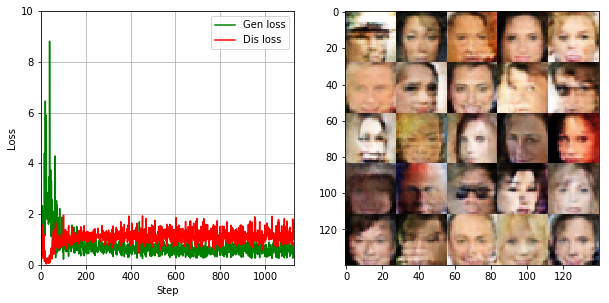

Epc: 1/1    Bat: 11310/12662    Dis Loss: 1.1994    Gen Loss: 0.6929    Time elaps: 00:15:20    Time remain: 00:01:50.
Epc: 1/1    Bat: 11320/12662    Dis Loss: 1.3645    Gen Loss: 0.3799    Time elaps: 00:15:21    Time remain: 00:01:49.
Epc: 1/1    Bat: 11330/12662    Dis Loss: 0.8648    Gen Loss: 0.8041    Time elaps: 00:15:22    Time remain: 00:01:48.
Epc: 1/1    Bat: 11340/12662    Dis Loss: 1.3290    Gen Loss: 0.5740    Time elaps: 00:15:22    Time remain: 00:01:47.
Epc: 1/1    Bat: 11350/12662    Dis Loss: 1.1924    Gen Loss: 0.5799    Time elaps: 00:15:23    Time remain: 00:01:46.
Epc: 1/1    Bat: 11360/12662    Dis Loss: 1.5759    Gen Loss: 0.3322    Time elaps: 00:15:24    Time remain: 00:01:45.
Epc: 1/1    Bat: 11370/12662    Dis Loss: 1.0288    Gen Loss: 0.7098    Time elaps: 00:15:25    Time remain: 00:01:45.
Epc: 1/1    Bat: 11380/12662    Dis Loss: 1.2461    Gen Loss: 0.4782    Time elaps: 00:15:25    Time remain: 00:01:44.
Epc: 1/1    Bat: 11390/12662    Dis Loss: 1.0387

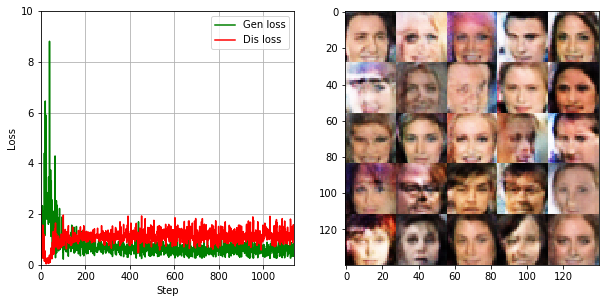

Epc: 1/1    Bat: 11410/12662    Dis Loss: 1.2289    Gen Loss: 0.4963    Time elaps: 00:15:28    Time remain: 00:01:41.
Epc: 1/1    Bat: 11420/12662    Dis Loss: 1.0370    Gen Loss: 0.5688    Time elaps: 00:15:29    Time remain: 00:01:41.
Epc: 1/1    Bat: 11430/12662    Dis Loss: 1.8626    Gen Loss: 0.2509    Time elaps: 00:15:30    Time remain: 00:01:40.
Epc: 1/1    Bat: 11440/12662    Dis Loss: 1.0859    Gen Loss: 0.7138    Time elaps: 00:15:31    Time remain: 00:01:39.
Epc: 1/1    Bat: 11450/12662    Dis Loss: 1.3247    Gen Loss: 0.4526    Time elaps: 00:15:31    Time remain: 00:01:38.
Epc: 1/1    Bat: 11460/12662    Dis Loss: 1.3519    Gen Loss: 0.4888    Time elaps: 00:15:32    Time remain: 00:01:37.
Epc: 1/1    Bat: 11470/12662    Dis Loss: 1.1899    Gen Loss: 0.5374    Time elaps: 00:15:33    Time remain: 00:01:37.
Epc: 1/1    Bat: 11480/12662    Dis Loss: 0.9164    Gen Loss: 1.1117    Time elaps: 00:15:34    Time remain: 00:01:36.
Epc: 1/1    Bat: 11490/12662    Dis Loss: 0.9527

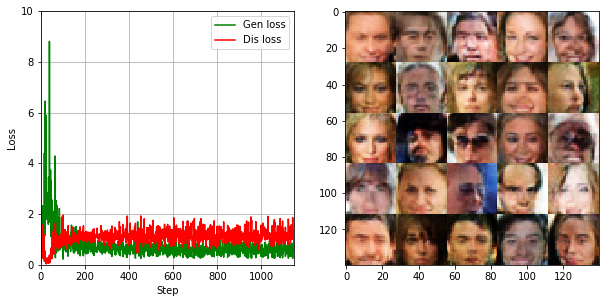

Epc: 1/1    Bat: 11510/12662    Dis Loss: 1.4336    Gen Loss: 0.3539    Time elaps: 00:15:36    Time remain: 00:01:33.
Epc: 1/1    Bat: 11520/12662    Dis Loss: 1.2912    Gen Loss: 0.4136    Time elaps: 00:15:37    Time remain: 00:01:32.
Epc: 1/1    Bat: 11530/12662    Dis Loss: 0.9274    Gen Loss: 0.7497    Time elaps: 00:15:38    Time remain: 00:01:32.
Epc: 1/1    Bat: 11540/12662    Dis Loss: 1.0028    Gen Loss: 0.6859    Time elaps: 00:15:39    Time remain: 00:01:31.
Epc: 1/1    Bat: 11550/12662    Dis Loss: 1.3567    Gen Loss: 0.4554    Time elaps: 00:15:40    Time remain: 00:01:30.
Epc: 1/1    Bat: 11560/12662    Dis Loss: 1.3927    Gen Loss: 0.4011    Time elaps: 00:15:40    Time remain: 00:01:29.
Epc: 1/1    Bat: 11570/12662    Dis Loss: 1.0542    Gen Loss: 0.7380    Time elaps: 00:15:41    Time remain: 00:01:28.
Epc: 1/1    Bat: 11580/12662    Dis Loss: 1.0170    Gen Loss: 0.7886    Time elaps: 00:15:42    Time remain: 00:01:28.
Epc: 1/1    Bat: 11590/12662    Dis Loss: 1.3219

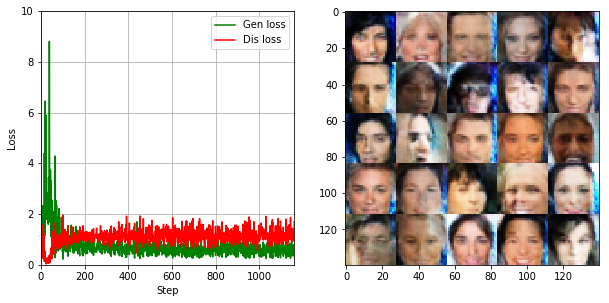

Epc: 1/1    Bat: 11610/12662    Dis Loss: 1.1327    Gen Loss: 0.5470    Time elaps: 00:15:45    Time remain: 00:01:25.
Epc: 1/1    Bat: 11620/12662    Dis Loss: 1.1406    Gen Loss: 0.5072    Time elaps: 00:15:46    Time remain: 00:01:24.
Epc: 1/1    Bat: 11630/12662    Dis Loss: 1.1374    Gen Loss: 0.5964    Time elaps: 00:15:46    Time remain: 00:01:24.
Epc: 1/1    Bat: 11640/12662    Dis Loss: 0.9130    Gen Loss: 0.7835    Time elaps: 00:15:47    Time remain: 00:01:23.
Epc: 1/1    Bat: 11650/12662    Dis Loss: 1.2760    Gen Loss: 0.4123    Time elaps: 00:15:48    Time remain: 00:01:22.
Epc: 1/1    Bat: 11660/12662    Dis Loss: 1.3517    Gen Loss: 0.3724    Time elaps: 00:15:49    Time remain: 00:01:21.
Epc: 1/1    Bat: 11670/12662    Dis Loss: 1.2165    Gen Loss: 0.5452    Time elaps: 00:15:49    Time remain: 00:01:20.
Epc: 1/1    Bat: 11680/12662    Dis Loss: 1.1842    Gen Loss: 0.6177    Time elaps: 00:15:50    Time remain: 00:01:19.
Epc: 1/1    Bat: 11690/12662    Dis Loss: 1.1676

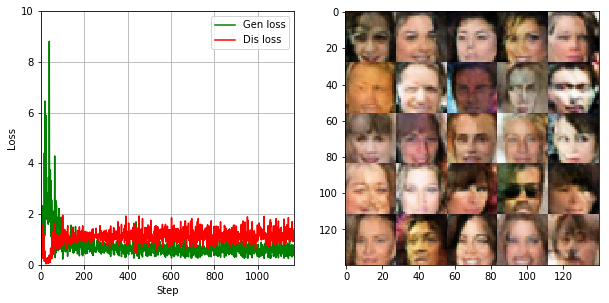

Epc: 1/1    Bat: 11710/12662    Dis Loss: 1.2212    Gen Loss: 0.5297    Time elaps: 00:15:53    Time remain: 00:01:17.
Epc: 1/1    Bat: 11720/12662    Dis Loss: 0.9042    Gen Loss: 0.7930    Time elaps: 00:15:54    Time remain: 00:01:16.
Epc: 1/1    Bat: 11730/12662    Dis Loss: 1.1511    Gen Loss: 0.5478    Time elaps: 00:15:55    Time remain: 00:01:15.
Epc: 1/1    Bat: 11740/12662    Dis Loss: 1.2133    Gen Loss: 0.4387    Time elaps: 00:15:55    Time remain: 00:01:15.
Epc: 1/1    Bat: 11750/12662    Dis Loss: 0.9947    Gen Loss: 0.6556    Time elaps: 00:15:56    Time remain: 00:01:14.
Epc: 1/1    Bat: 11760/12662    Dis Loss: 0.7595    Gen Loss: 0.8153    Time elaps: 00:15:57    Time remain: 00:01:13.
Epc: 1/1    Bat: 11770/12662    Dis Loss: 0.9922    Gen Loss: 0.7268    Time elaps: 00:15:58    Time remain: 00:01:12.
Epc: 1/1    Bat: 11780/12662    Dis Loss: 1.0867    Gen Loss: 0.6740    Time elaps: 00:15:58    Time remain: 00:01:11.
Epc: 1/1    Bat: 11790/12662    Dis Loss: 0.9597

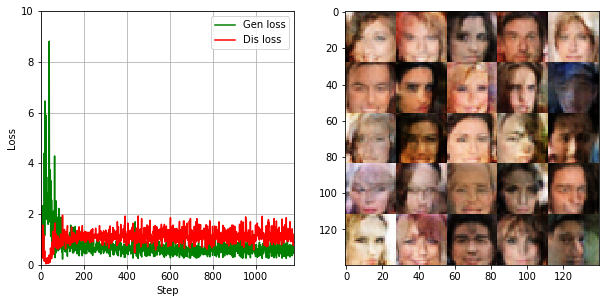

Epc: 1/1    Bat: 11810/12662    Dis Loss: 1.8524    Gen Loss: 0.3538    Time elaps: 00:16:01    Time remain: 00:01:09.
Epc: 1/1    Bat: 11820/12662    Dis Loss: 1.6496    Gen Loss: 0.3158    Time elaps: 00:16:02    Time remain: 00:01:08.
Epc: 1/1    Bat: 11830/12662    Dis Loss: 1.0439    Gen Loss: 0.7994    Time elaps: 00:16:03    Time remain: 00:01:07.
Epc: 1/1    Bat: 11840/12662    Dis Loss: 0.9844    Gen Loss: 0.6444    Time elaps: 00:16:04    Time remain: 00:01:06.
Epc: 1/1    Bat: 11850/12662    Dis Loss: 1.2302    Gen Loss: 0.5015    Time elaps: 00:16:04    Time remain: 00:01:06.
Epc: 1/1    Bat: 11860/12662    Dis Loss: 1.2266    Gen Loss: 0.4372    Time elaps: 00:16:05    Time remain: 00:01:05.
Epc: 1/1    Bat: 11870/12662    Dis Loss: 1.3588    Gen Loss: 0.3746    Time elaps: 00:16:06    Time remain: 00:01:04.
Epc: 1/1    Bat: 11880/12662    Dis Loss: 1.3240    Gen Loss: 0.4496    Time elaps: 00:16:07    Time remain: 00:01:03.
Epc: 1/1    Bat: 11890/12662    Dis Loss: 1.4647

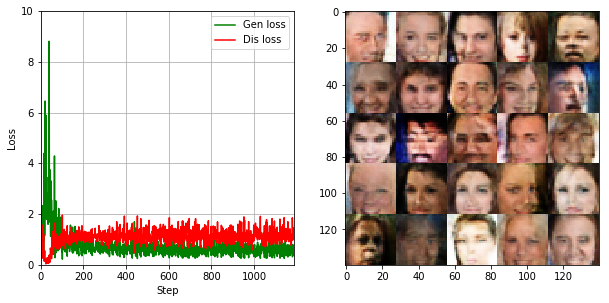

Epc: 1/1    Bat: 11910/12662    Dis Loss: 1.0490    Gen Loss: 0.7275    Time elaps: 00:16:09    Time remain: 00:01:01.
Epc: 1/1    Bat: 11920/12662    Dis Loss: 1.3804    Gen Loss: 0.4267    Time elaps: 00:16:10    Time remain: 00:01:00.
Epc: 1/1    Bat: 11930/12662    Dis Loss: 1.0105    Gen Loss: 0.6536    Time elaps: 00:16:11    Time remain: 00:00:59.
Epc: 1/1    Bat: 11940/12662    Dis Loss: 1.2216    Gen Loss: 0.4980    Time elaps: 00:16:12    Time remain: 00:00:58.
Epc: 1/1    Bat: 11950/12662    Dis Loss: 0.9275    Gen Loss: 0.7640    Time elaps: 00:16:12    Time remain: 00:00:58.
Epc: 1/1    Bat: 11960/12662    Dis Loss: 1.1558    Gen Loss: 0.5388    Time elaps: 00:16:13    Time remain: 00:00:57.
Epc: 1/1    Bat: 11970/12662    Dis Loss: 1.0376    Gen Loss: 0.8846    Time elaps: 00:16:14    Time remain: 00:00:56.
Epc: 1/1    Bat: 11980/12662    Dis Loss: 1.2649    Gen Loss: 0.4349    Time elaps: 00:16:15    Time remain: 00:00:55.
Epc: 1/1    Bat: 11990/12662    Dis Loss: 1.1737

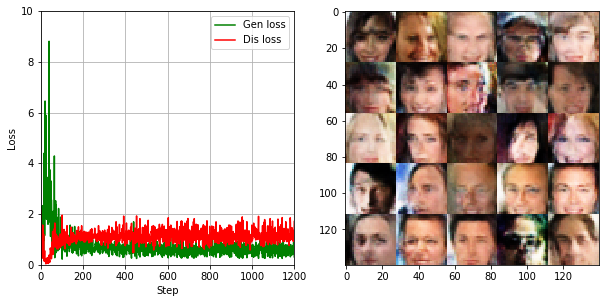

Epc: 1/1    Bat: 12010/12662    Dis Loss: 1.2079    Gen Loss: 0.6356    Time elaps: 00:16:18    Time remain: 00:00:53.
Epc: 1/1    Bat: 12020/12662    Dis Loss: 0.9741    Gen Loss: 0.6906    Time elaps: 00:16:18    Time remain: 00:00:52.
Epc: 1/1    Bat: 12030/12662    Dis Loss: 1.0931    Gen Loss: 0.6984    Time elaps: 00:16:19    Time remain: 00:00:51.
Epc: 1/1    Bat: 12040/12662    Dis Loss: 0.9036    Gen Loss: 0.8640    Time elaps: 00:16:20    Time remain: 00:00:50.
Epc: 1/1    Bat: 12050/12662    Dis Loss: 1.4197    Gen Loss: 0.3814    Time elaps: 00:16:21    Time remain: 00:00:49.
Epc: 1/1    Bat: 12060/12662    Dis Loss: 1.1092    Gen Loss: 0.5437    Time elaps: 00:16:21    Time remain: 00:00:49.
Epc: 1/1    Bat: 12070/12662    Dis Loss: 1.0547    Gen Loss: 0.7701    Time elaps: 00:16:22    Time remain: 00:00:48.
Epc: 1/1    Bat: 12080/12662    Dis Loss: 1.2785    Gen Loss: 0.5654    Time elaps: 00:16:23    Time remain: 00:00:47.
Epc: 1/1    Bat: 12090/12662    Dis Loss: 0.7903

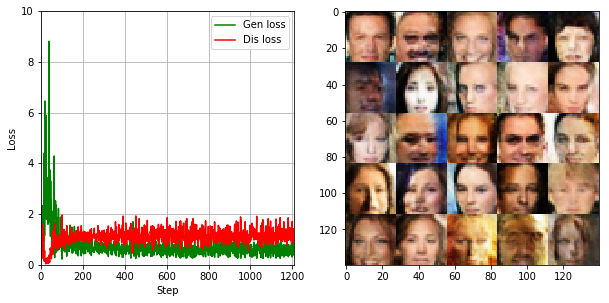

Epc: 1/1    Bat: 12110/12662    Dis Loss: 1.0002    Gen Loss: 0.6661    Time elaps: 00:16:26    Time remain: 00:00:44.
Epc: 1/1    Bat: 12120/12662    Dis Loss: 1.2323    Gen Loss: 0.5404    Time elaps: 00:16:27    Time remain: 00:00:44.
Epc: 1/1    Bat: 12130/12662    Dis Loss: 1.4927    Gen Loss: 0.3585    Time elaps: 00:16:27    Time remain: 00:00:43.
Epc: 1/1    Bat: 12140/12662    Dis Loss: 1.1799    Gen Loss: 1.1313    Time elaps: 00:16:28    Time remain: 00:00:42.
Epc: 1/1    Bat: 12150/12662    Dis Loss: 0.9540    Gen Loss: 1.0206    Time elaps: 00:16:29    Time remain: 00:00:41.
Epc: 1/1    Bat: 12160/12662    Dis Loss: 1.1801    Gen Loss: 0.5570    Time elaps: 00:16:30    Time remain: 00:00:40.
Epc: 1/1    Bat: 12170/12662    Dis Loss: 0.6471    Gen Loss: 0.9474    Time elaps: 00:16:30    Time remain: 00:00:40.
Epc: 1/1    Bat: 12180/12662    Dis Loss: 1.0163    Gen Loss: 0.8359    Time elaps: 00:16:31    Time remain: 00:00:39.
Epc: 1/1    Bat: 12190/12662    Dis Loss: 1.4787

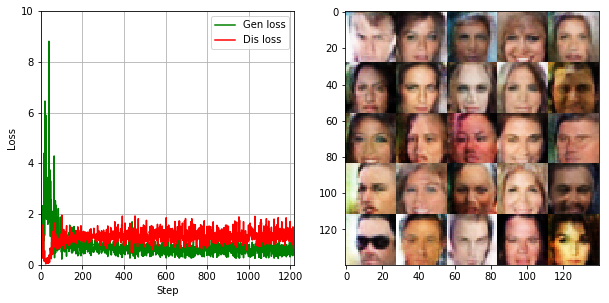

Epc: 1/1    Bat: 12210/12662    Dis Loss: 0.9156    Gen Loss: 0.8510    Time elaps: 00:16:34    Time remain: 00:00:36.
Epc: 1/1    Bat: 12220/12662    Dis Loss: 1.2739    Gen Loss: 0.4842    Time elaps: 00:16:35    Time remain: 00:00:36.
Epc: 1/1    Bat: 12230/12662    Dis Loss: 1.1871    Gen Loss: 0.5607    Time elaps: 00:16:36    Time remain: 00:00:35.
Epc: 1/1    Bat: 12240/12662    Dis Loss: 0.9592    Gen Loss: 0.8423    Time elaps: 00:16:36    Time remain: 00:00:34.
Epc: 1/1    Bat: 12250/12662    Dis Loss: 1.0268    Gen Loss: 0.7632    Time elaps: 00:16:37    Time remain: 00:00:33.
Epc: 1/1    Bat: 12260/12662    Dis Loss: 0.9306    Gen Loss: 0.7051    Time elaps: 00:16:38    Time remain: 00:00:32.
Epc: 1/1    Bat: 12270/12662    Dis Loss: 0.9638    Gen Loss: 0.7111    Time elaps: 00:16:39    Time remain: 00:00:31.
Epc: 1/1    Bat: 12280/12662    Dis Loss: 1.1091    Gen Loss: 0.6174    Time elaps: 00:16:39    Time remain: 00:00:31.
Epc: 1/1    Bat: 12290/12662    Dis Loss: 1.0608

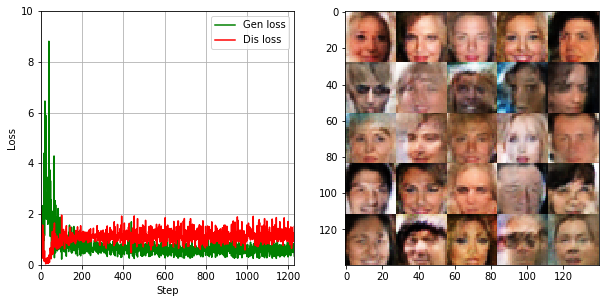

Epc: 1/1    Bat: 12310/12662    Dis Loss: 1.3359    Gen Loss: 0.4652    Time elaps: 00:16:42    Time remain: 00:00:28.
Epc: 1/1    Bat: 12320/12662    Dis Loss: 1.0959    Gen Loss: 0.5001    Time elaps: 00:16:43    Time remain: 00:00:27.
Epc: 1/1    Bat: 12330/12662    Dis Loss: 1.3074    Gen Loss: 0.4941    Time elaps: 00:16:44    Time remain: 00:00:27.
Epc: 1/1    Bat: 12340/12662    Dis Loss: 1.1309    Gen Loss: 1.1881    Time elaps: 00:16:45    Time remain: 00:00:26.
Epc: 1/1    Bat: 12350/12662    Dis Loss: 1.3324    Gen Loss: 0.3755    Time elaps: 00:16:45    Time remain: 00:00:25.
Epc: 1/1    Bat: 12360/12662    Dis Loss: 0.8583    Gen Loss: 0.7529    Time elaps: 00:16:46    Time remain: 00:00:24.
Epc: 1/1    Bat: 12370/12662    Dis Loss: 1.3516    Gen Loss: 0.4587    Time elaps: 00:16:47    Time remain: 00:00:23.
Epc: 1/1    Bat: 12380/12662    Dis Loss: 1.8845    Gen Loss: 0.3420    Time elaps: 00:16:48    Time remain: 00:00:23.
Epc: 1/1    Bat: 12390/12662    Dis Loss: 1.1796

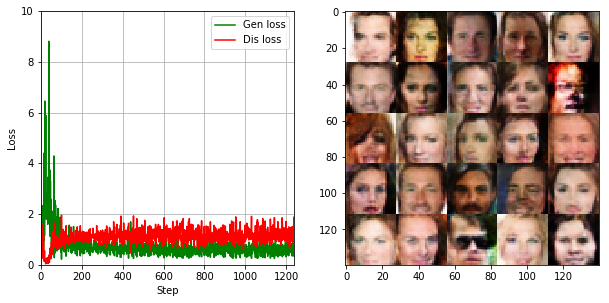

Epc: 1/1    Bat: 12410/12662    Dis Loss: 1.3898    Gen Loss: 0.4108    Time elaps: 00:16:51    Time remain: 00:00:20.
Epc: 1/1    Bat: 12420/12662    Dis Loss: 1.4910    Gen Loss: 0.4096    Time elaps: 00:16:52    Time remain: 00:00:19.
Epc: 1/1    Bat: 12430/12662    Dis Loss: 0.9122    Gen Loss: 0.8292    Time elaps: 00:16:52    Time remain: 00:00:18.
Epc: 1/1    Bat: 12440/12662    Dis Loss: 1.0099    Gen Loss: 0.6244    Time elaps: 00:16:53    Time remain: 00:00:18.
Epc: 1/1    Bat: 12450/12662    Dis Loss: 0.9093    Gen Loss: 1.0818    Time elaps: 00:16:54    Time remain: 00:00:17.
Epc: 1/1    Bat: 12460/12662    Dis Loss: 1.1097    Gen Loss: 0.6924    Time elaps: 00:16:55    Time remain: 00:00:16.
Epc: 1/1    Bat: 12470/12662    Dis Loss: 1.4777    Gen Loss: 0.4882    Time elaps: 00:16:55    Time remain: 00:00:15.
Epc: 1/1    Bat: 12480/12662    Dis Loss: 1.1037    Gen Loss: 0.5971    Time elaps: 00:16:56    Time remain: 00:00:14.
Epc: 1/1    Bat: 12490/12662    Dis Loss: 2.1349

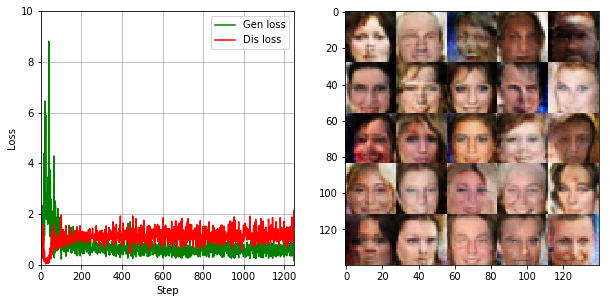

Epc: 1/1    Bat: 12510/12662    Dis Loss: 1.0626    Gen Loss: 0.5617    Time elaps: 00:16:59    Time remain: 00:00:12.
Epc: 1/1    Bat: 12520/12662    Dis Loss: 1.1928    Gen Loss: 0.5079    Time elaps: 00:17:00    Time remain: 00:00:11.
Epc: 1/1    Bat: 12530/12662    Dis Loss: 0.9657    Gen Loss: 0.7098    Time elaps: 00:17:01    Time remain: 00:00:10.
Epc: 1/1    Bat: 12540/12662    Dis Loss: 1.1223    Gen Loss: 0.5064    Time elaps: 00:17:02    Time remain: 00:00:09.
Epc: 1/1    Bat: 12550/12662    Dis Loss: 1.1715    Gen Loss: 0.5308    Time elaps: 00:17:02    Time remain: 00:00:09.
Epc: 1/1    Bat: 12560/12662    Dis Loss: 1.3888    Gen Loss: 0.3459    Time elaps: 00:17:03    Time remain: 00:00:08.
Epc: 1/1    Bat: 12570/12662    Dis Loss: 0.8468    Gen Loss: 0.8462    Time elaps: 00:17:04    Time remain: 00:00:07.
Epc: 1/1    Bat: 12580/12662    Dis Loss: 1.5800    Gen Loss: 0.2824    Time elaps: 00:17:05    Time remain: 00:00:06.
Epc: 1/1    Bat: 12590/12662    Dis Loss: 0.8111

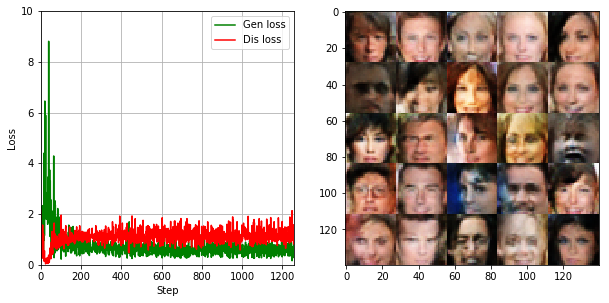

Epc: 1/1    Bat: 12610/12662    Dis Loss: 0.9822    Gen Loss: 0.7163    Time elaps: 00:17:08    Time remain: 00:00:04.
Epc: 1/1    Bat: 12620/12662    Dis Loss: 1.2682    Gen Loss: 0.4336    Time elaps: 00:17:08    Time remain: 00:00:03.
Epc: 1/1    Bat: 12630/12662    Dis Loss: 1.4874    Gen Loss: 0.3495    Time elaps: 00:17:09    Time remain: 00:00:02.
Epc: 1/1    Bat: 12640/12662    Dis Loss: 2.0019    Gen Loss: 0.1937    Time elaps: 00:17:10    Time remain: 00:00:01.
Epc: 1/1    Bat: 12650/12662    Dis Loss: 1.2997    Gen Loss: 0.4667    Time elaps: 00:17:11    Time remain: 00:00:01.
Epc: 1/1    Bat: 12660/12662    Dis Loss: 0.7614    Gen Loss: 1.0419    Time elaps: 00:17:11    Time remain: 00:00:00.


In [38]:
batch_size =16
z_dim = 100
learning_rate = 0.0001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.